In [1130]:
import numpy as np
import numpy.typing as npt
import scipy.stats as st
import matplotlib.pyplot as plt
import math
import os, sys, pickle, time, re, csv, io
import numpy as np
from scipy.optimize import minimize
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA, FastICA, NMF, SparsePCA
from sklearn.manifold import MDS, TSNE
from scipy.stats import ttest_ind
from sklearn.linear_model import Lasso, LinearRegression
from matplotlib.cm import ScalarMappable
from matplotlib import colors
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
from scipy.stats.stats import pearsonr  
from scipy.signal import resample
from tqdm import tqdm
from scipy.stats import zscore
from numpy import dot
from numpy.linalg import norm

### # Data structure



### Neuron npy files:
These contain the normalized firing rates of each neuron - spikes per frame (frame rate is 60 Hz)

npy files for each session
matrix with dimensions [neuron,trial,bin]

360 bins per trial, every state is 90 bins

### Location npy files:
These contain the location of the animal in each bin (should correspond exactly to the neuron bins)
locations1-9 are the 9 nodes

Then the remaining locations 10-21 are the bridges, coded in the "Edge_grid" array. just subtract 10 and that
gives you the index of the Edge_grid array which tells you which bridges are being referenced
e.g. an entry of 10 means index 0 which is array([1, 2]) (i.e. animal is at the the bridge between nodes 1 and 2)

### task_data
this is the task sequence used for that day (which nodes are rewarded in what order)


##Raw data:

Neuron_raw arrays are matrices of shape neurons X bins
each bin is the firing rate in a 25 ms timewindow

Location_raw arrays are arrays of length equal to the number of bins for the Neuron_raw matrix (may be 1 off)

trialtimes arrays are times (in ms) of each state: the first four columns are the start of each state
the fifth column is the end of the last state (D)

Pokes and Tone times in ms aligned to first trial - some will have negative timestamps if anumal poked before activating 
first A

Note that you'll have to convert the trial times, pokes and tone tomes from ms to bin number to subset the neuron 
and location arrays (i.e. divide by 25)

### Scores

A boolean matrix of N trials X N states (4) showing whether animal took shortest route between two 
reward locations or not (1 if shortest route taken; 0 if not)


### Analysis

Phase_state_place_anchoring a Nx4 boolean matrix (N= number of neurons) outlining results of tuning analysis: columns
aranged as follows: Phase, State, Place and Anchoring
e.g. a cell thats True, True, True, False is phase, state and place tuned but not spatially anchored
Phase and Place determined by beta values obtained from a GLM looking at tuning consistency across tasks
State boolean is determined by comparing peaks in mean firing in state space to those from shuffled data - a state cell
has significant peaks in atleast half of the tasks
Anchoring via relative rotation to possible anchors - an anchored cell has consiustent anchoring in atleast half of 
the tasks

All thresholds currently being refined



In [1131]:
Data_folder= r'/Users/AdamHarris/Documents/PFC Subspaces/Data/'

In [1132]:
def get_sessions(mouse_recday, Data_folder=Data_folder):
    
    Tasks = np.load(Data_folder + "Task_data_" + mouse_recday + ".npy")
    sessions_to_try = range(len(Tasks))
    sessions = []
    for session in sessions_to_try:
        try:
            data_neurons = np.load(
                Data_folder + "Neuron_" + mouse_recday + "_" + str(session) + ".npy"
            )
            sessions.append(session)
        except:
            print("Exception: " + mouse_recday + "_" + str(session) + ".npy  not found")
        
    return sessions, Tasks

def unroll_listoflists(l):
    flat_list = [item for sublist in l for item in sublist]
    return(flat_list)

def smooth_circ(xx, sigma=10, axis=0):
    x_smoothed = gaussian_filter1d(np.hstack((xx, xx, xx)), sigma, axis=axis)[
        len(xx) : int(len(xx) * 2)
    ]
    return x_smoothed

def mean_neuron_session(data_neuron):
    
    return np.mean(data_neuron, 0)

def std_err(data_neuron):
    return smooth_circ(sem(data_neuron, axis=0))

def occupency_map(raw_locs, maze_mat, place_plot):
    occupency_map = maze_mat.copy()
    for i in range(1,22):
        occupency_map[place_plot[i]]=np.sum(raw_locs==i)
        
    return occupency_map

def spikes_in_place_map(raw_spikes, raw_locs, maze_mat, place_plot):
    max_ind = min(len(raw_spikes), len(raw_locs))
    spikes_map=maze_mat.copy()
    raw_locs = raw_locs[:max_ind]
    raw_spikes = raw_spikes[:max_ind]
    for i in range(1,22):
        locs_ = raw_locs==i
        spikes_ = np.sum(raw_spikes[locs_])
        spikes_map[place_plot[i]] = spikes_
        
    return(spikes_map)

def place_map(raw_spikes, raw_locs, maze_mat, place_plot):
    occupency_ = occupency_map(raw_locs, maze_mat, place_plot)
    spikes_in_place_ = spikes_in_place_map(raw_spikes, raw_locs, maze_mat, place_plot)
    place_map = np.divide(spikes_in_place_, occupency_)
    return(place_map)
    

def get_raster_arrays(raw_spikes_state):
    spike_events_ = [np.where(raw_spikes_state[i]>0)[0] for i in range(len(raw_spikes_state))]
    trial_len_ = np.asarray([[len(raw_spikes_state[i])] for i in range(len(raw_spikes_state))])
    return spike_events_, trial_len_

def get_data_for_state(Neuron_raw, Location_raw, state, trial_times):

    Neuron_state = []
    Location_state = []
    Neuron_state_pertrial = []
    state_dic = {
        'A': 0,
        'B': 1,
        'C': 2,
        'D': 3
    }
    
    for trial in trial_times:
        trial_inds = (trial/25).astype(int) # 25 is scaling factor between tria samling rate and neuron/locs sampling rate
        state_inds = [trial_inds[state_dic[state]], trial_inds[state_dic[state]+1]]

        neuron_ = Neuron_raw[state_inds[0]:state_inds[1]]
        locs_ = Location_raw[state_inds[0]:state_inds[1]]
        Neuron_state.extend(neuron_)
        Neuron_state_pertrial.append(neuron_)
        Location_state.extend(locs_)
        
    Neuron_state_arr = np.array(Neuron_state)
    Location_state_arr = np.array(Location_state)    
        
    return Neuron_state_arr, Location_state_arr, Neuron_state_pertrial


def get_max_time(raster, conversion=40):
    max_time=0
    for i in raster:
        if len(i)>0:
            if max(i)>max_time:
                max_time=max(i)
    bins = np.array(list(range(max_time)))
    bins_s = bins/conversion
    ind_of_max_s = 0
    max_s = 0
    for i , j in enumerate(bins_s):
        if i%conversion==0:
            ind_of_max_s  = i
            max_s = j.astype(int)
    return max_time/conversion, bins, ind_of_max_s, max_s

def average_over_factor(m, factor):
    # Calculate the number of columns in the reshaped array
    new_columns = m.shape[1] // factor * factor

    # Pad the array with zeros to make the number of columns divisible by the factor
    padded_m = np.pad(m[:, :new_columns], ((0, 0), (0, factor - (new_columns % factor))), mode='constant')

    # Reshape the array to have 'factor' columns per block and flatten the last dimension
    reshaped_m = padded_m.reshape(m.shape[0], -1, factor)

    # Take the mean along the last axis (axis=-1) to get the average for each block
    result = np.mean(reshaped_m, axis=-1)

    return result


def sample_every_nth(matrix, n):
    """
    Sample every nth element of a numpy matrix.

    Parameters:
    - matrix: numpy array, input matrix (1D or 2D)
    - n: int, sampling interval

    Returns:
    - numpy array, sampled elements
    """
    if matrix.ndim == 1:
        return matrix[::n]
    elif matrix.ndim == 2:
        return matrix[:, ::n]
    else:
        raise ValueError("Input matrix must be either 1 or 2-dimensional")

def average_over_factor_1d(arr, factor):
    # Calculate the number of elements in the reshaped array
    new_length = len(arr) // factor * factor

    # Pad the array with zeros to make the length divisible by the factor
    padded_arr = np.pad(arr[:new_length], (0, factor - (new_length % factor)), mode='constant')

    # Reshape the array to have 'factor' elements per block
    reshaped_arr = padded_arr.reshape(-1, factor)

    # Take the mean along the last axis (axis=-1) to get the average for each block
    result = np.mean(reshaped_arr, axis=-1)

    return result


def smooth_and_calculate_scalar_derivatives(data_matrix, sigma=3, dt=1.0):
    # Assuming data_matrix is an nx2 array with x and y positions

    # Separate x and y columns
    x_positions = data_matrix[:, 0]
    y_positions = data_matrix[:, 1]

    # Smooth the data using 1D Gaussian filter
    x_smoothed = gaussian_filter1d(x_positions, sigma=sigma)
    y_smoothed = gaussian_filter1d(y_positions, sigma=sigma)

    
    # Calculate speeds (first derivative) and magnitudes
    vx = np.gradient(x_smoothed, dt)
    vy = np.gradient(y_smoothed, dt)
    speed = np.sqrt(vx**2 + vy**2)

    # calculate acceleration
    acceleration = np.gradient(speed, dt)
    # Combine results into a single array
    smoothed_data = np.column_stack((x_smoothed, y_smoothed, speed, acceleration))

    return smoothed_data




In [1133]:
Recording_days=np.load(Data_folder+'Recording_days_combined.npy')
Edge_grid=np.load(Data_folder+'Edge_grid.npy')

In [1134]:
Recording_days

array(['ah03_18082021_19082021', 'ah04_01122021_02122021',
       'ah04_05122021_06122021', 'ah04_09122021_10122021',
       'me08_10092021_11092021', 'me10_09122021_10122021',
       'me11_01122021_02122021', 'me11_05122021_06122021'], dtype='<U22')

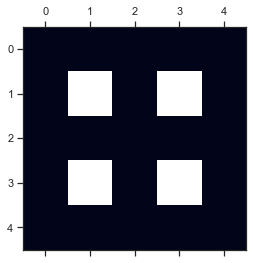

In [1135]:
connections = [[0,1],
               [0,3],
               [1,4],
               [1,2],
               [2,5],
               [3,4],
               [3,6],
               [4,7],
               [4,5],
               [6,7],
               [7,8],
               [5,8]]


loc_mapping_for_plot = {
    1: (0,0),
    2: (0,2),
    3: (0,4),
    4: (2,0),
    5: (2,2),
    6: (2,4),
    7: (4,0),
    8: (4,2),
    9: (4,4),
    10: (0,1),
    11: (0,3),
    12: (1,0),
    13: (1,2),
    14: (1,4),
    15: (2,1),
    16: (2,3), 
    17: (3,0),
    18: (3,2),
    19: (3,4),
    20: (4,1),
    21: (4,3),
}
maze_mat = np.zeros((5,5))
maze_mat[1,1]=np.inf
maze_mat[1,3]=np.inf
maze_mat[3,1]=np.inf
maze_mat[3,3]=np.inf
plt.matshow(maze_mat)

In [1136]:
mouse_recday = Recording_days[2]
sessions, Tasks = get_sessions(mouse_recday)

Exception: ah04_05122021_06122021_3.npy  not found


In [1137]:
Recording_days

array(['ah03_18082021_19082021', 'ah04_01122021_02122021',
       'ah04_05122021_06122021', 'ah04_09122021_10122021',
       'me08_10092021_11092021', 'me10_09122021_10122021',
       'me11_01122021_02122021', 'me11_05122021_06122021'], dtype='<U22')

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


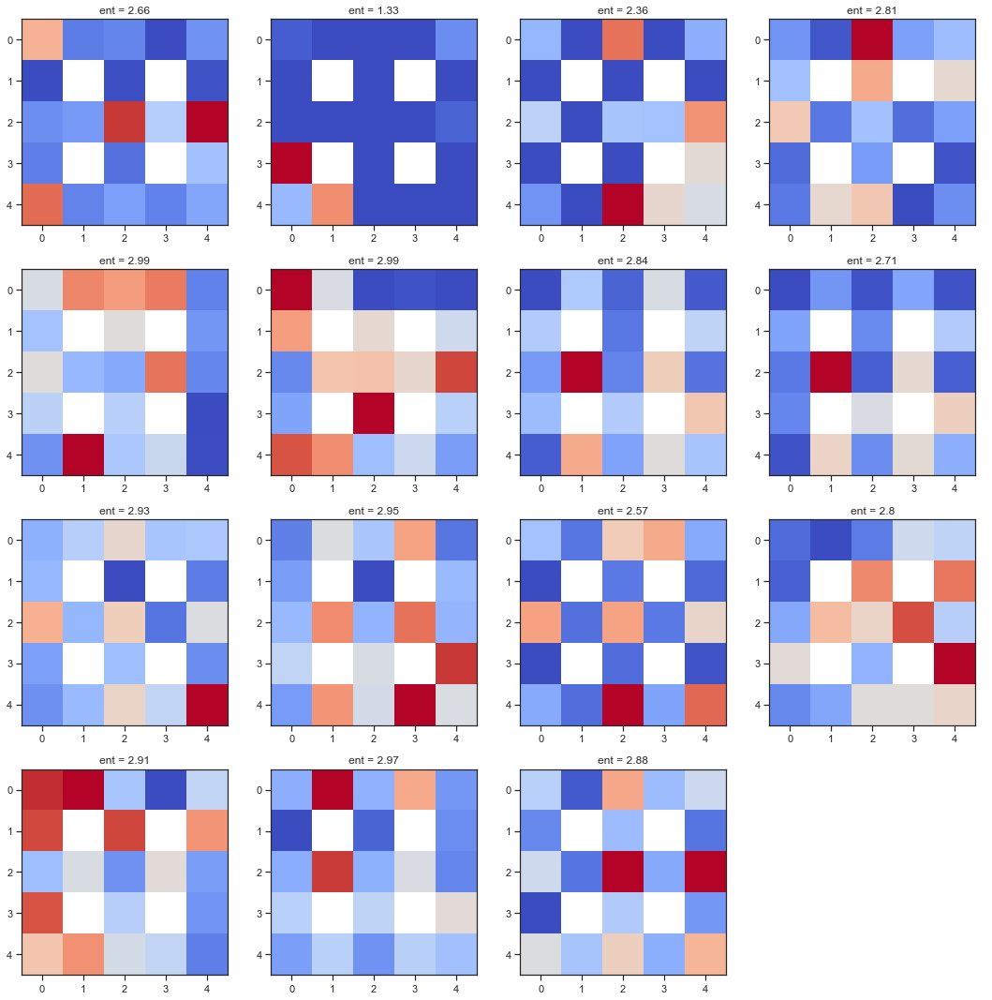

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


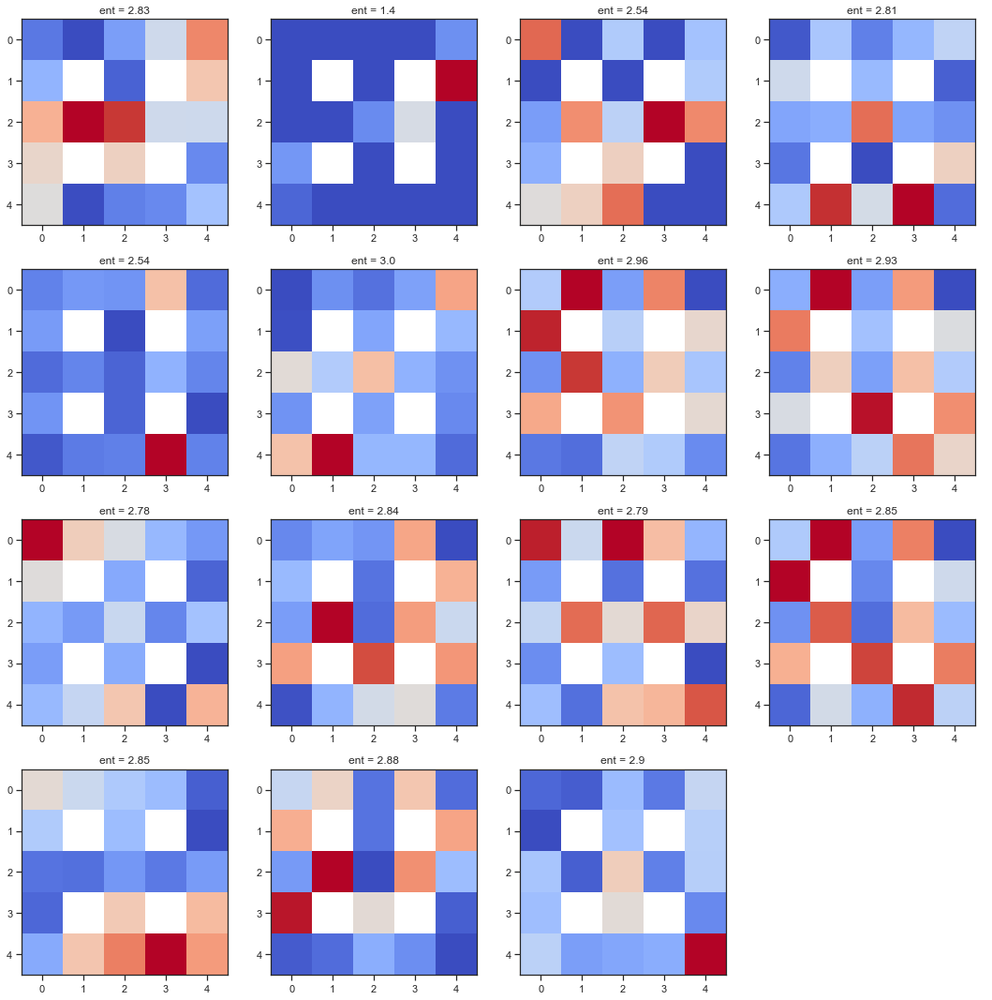

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


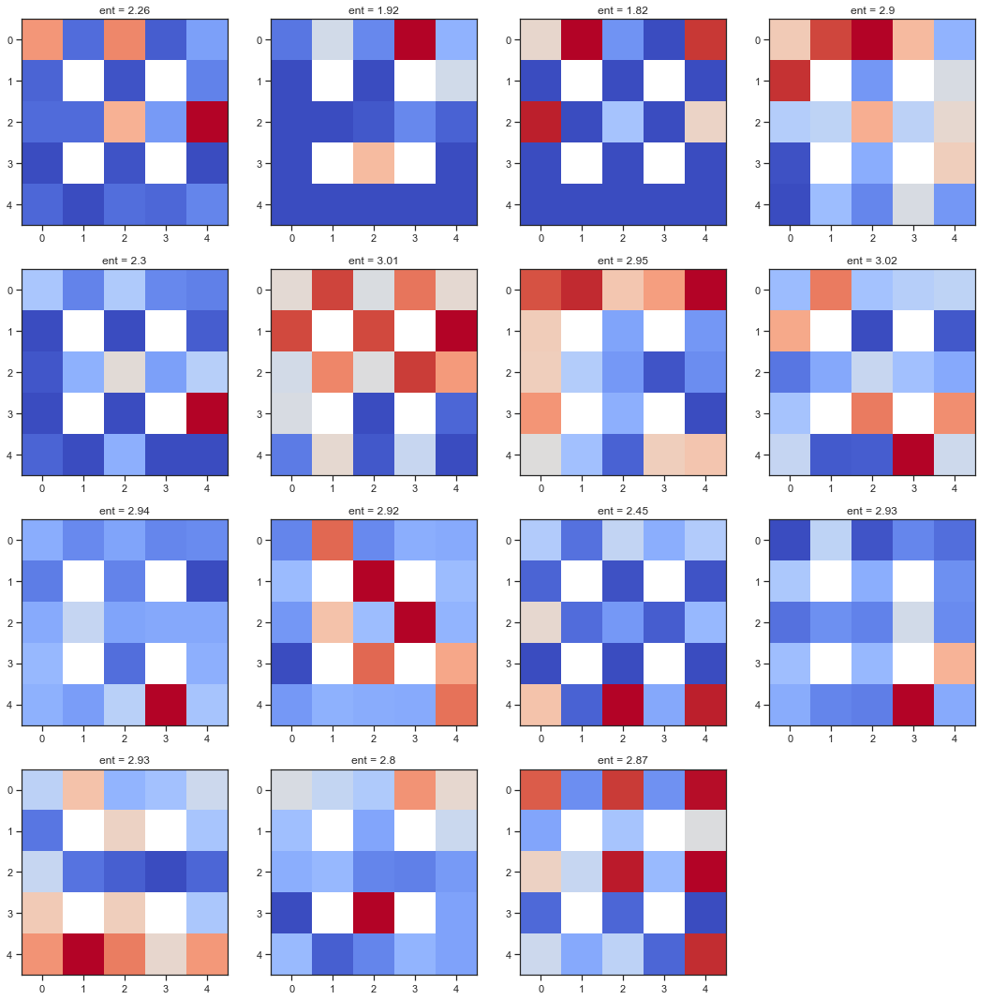

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


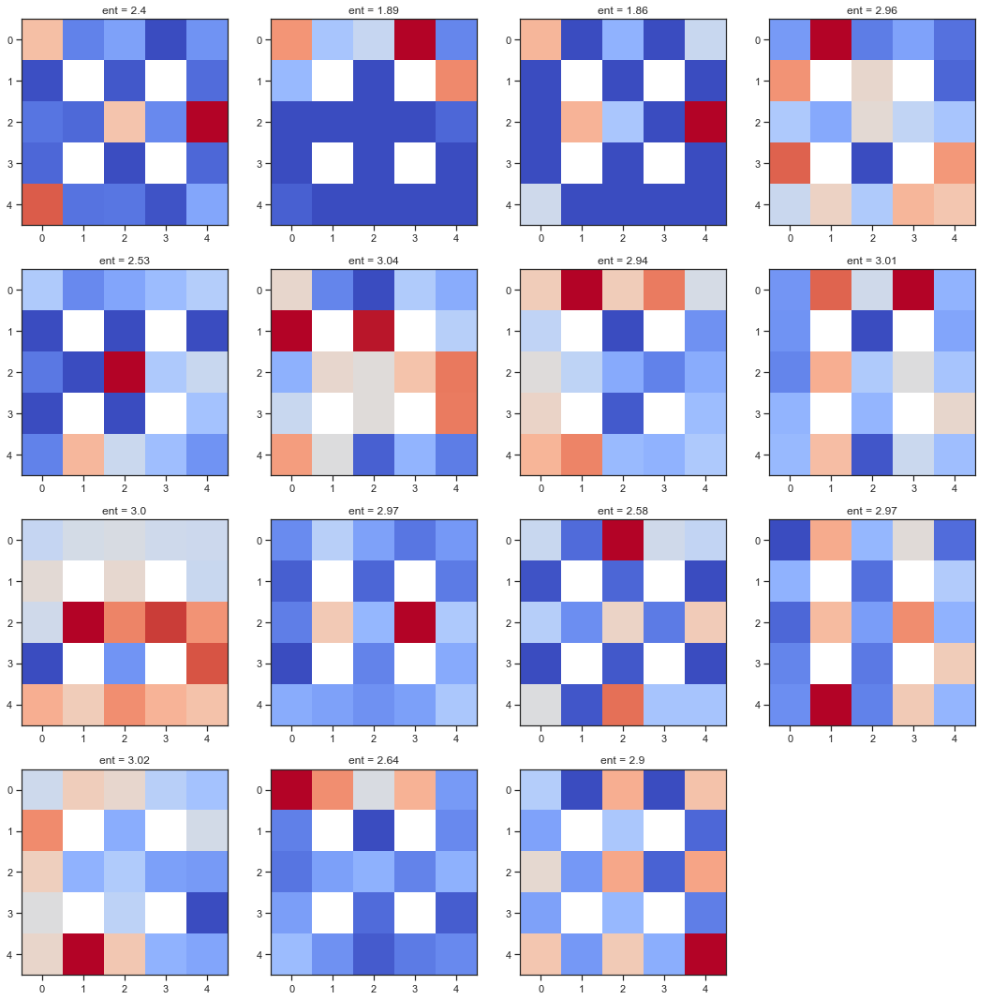

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


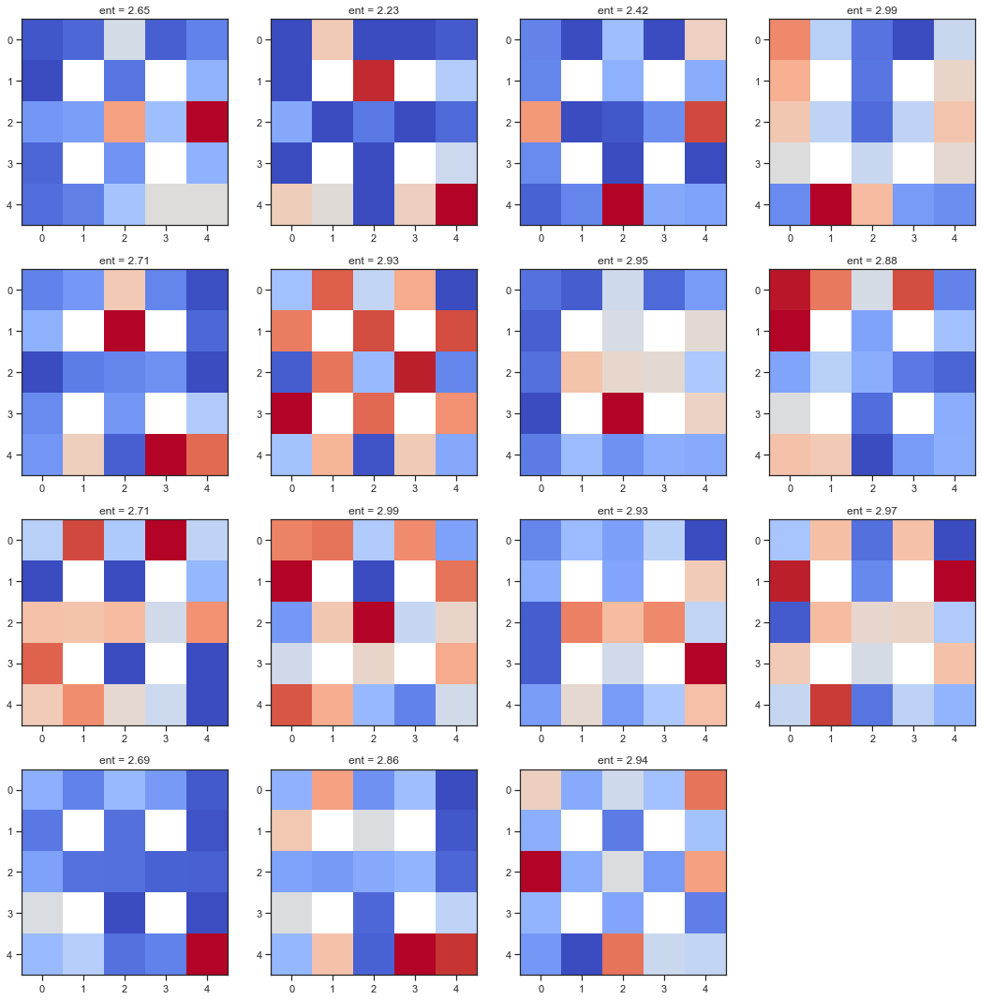

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


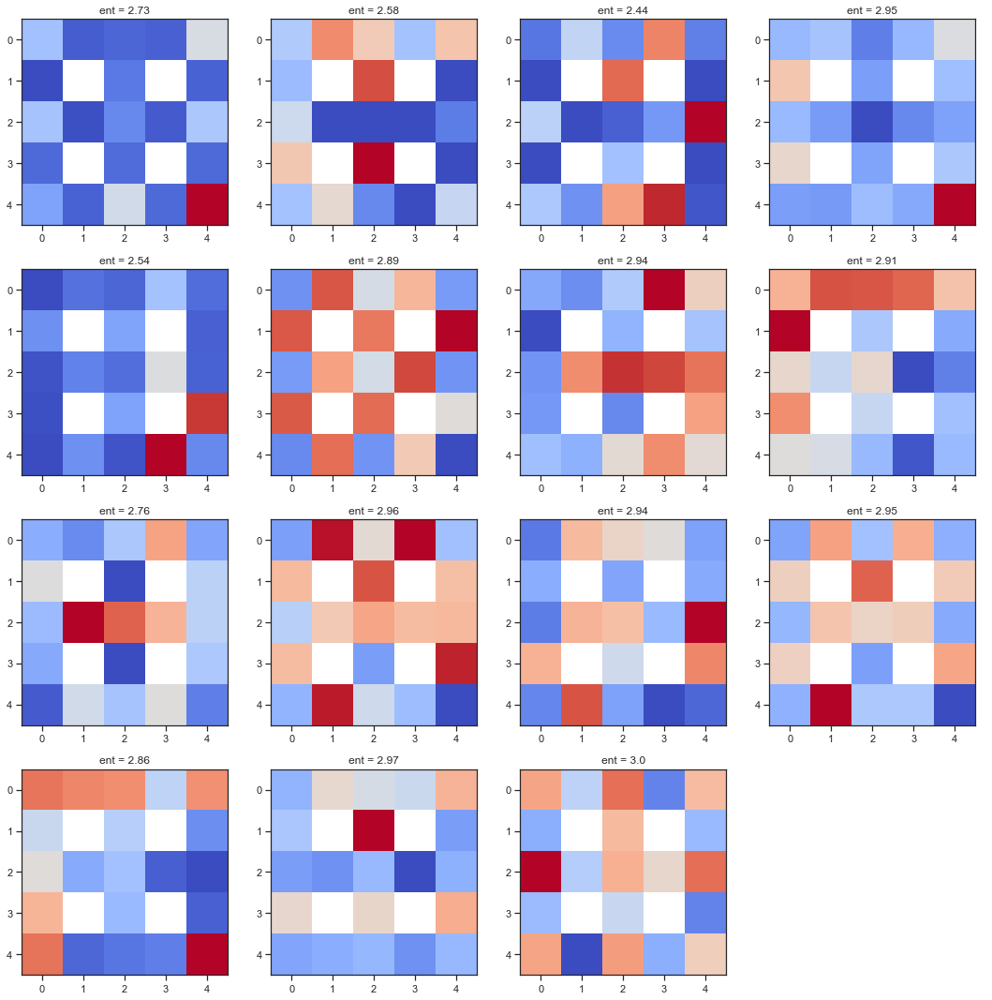

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


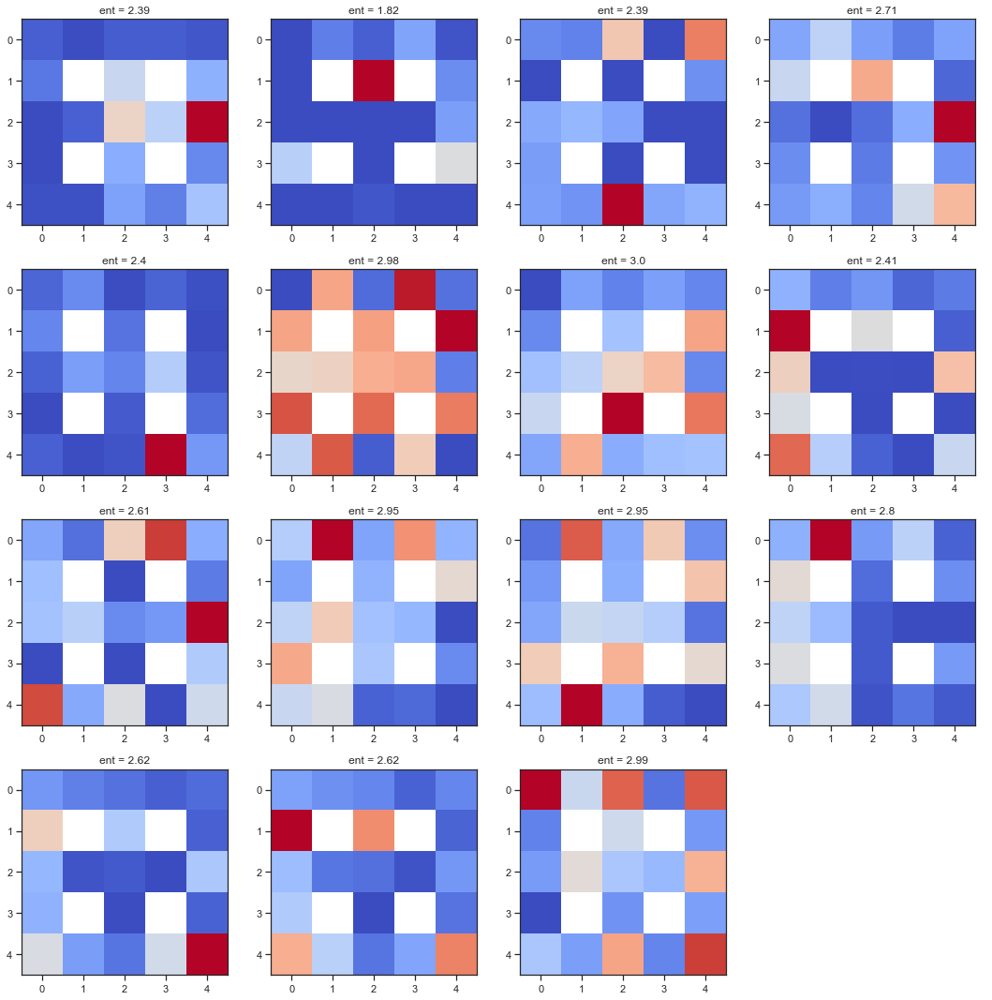

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


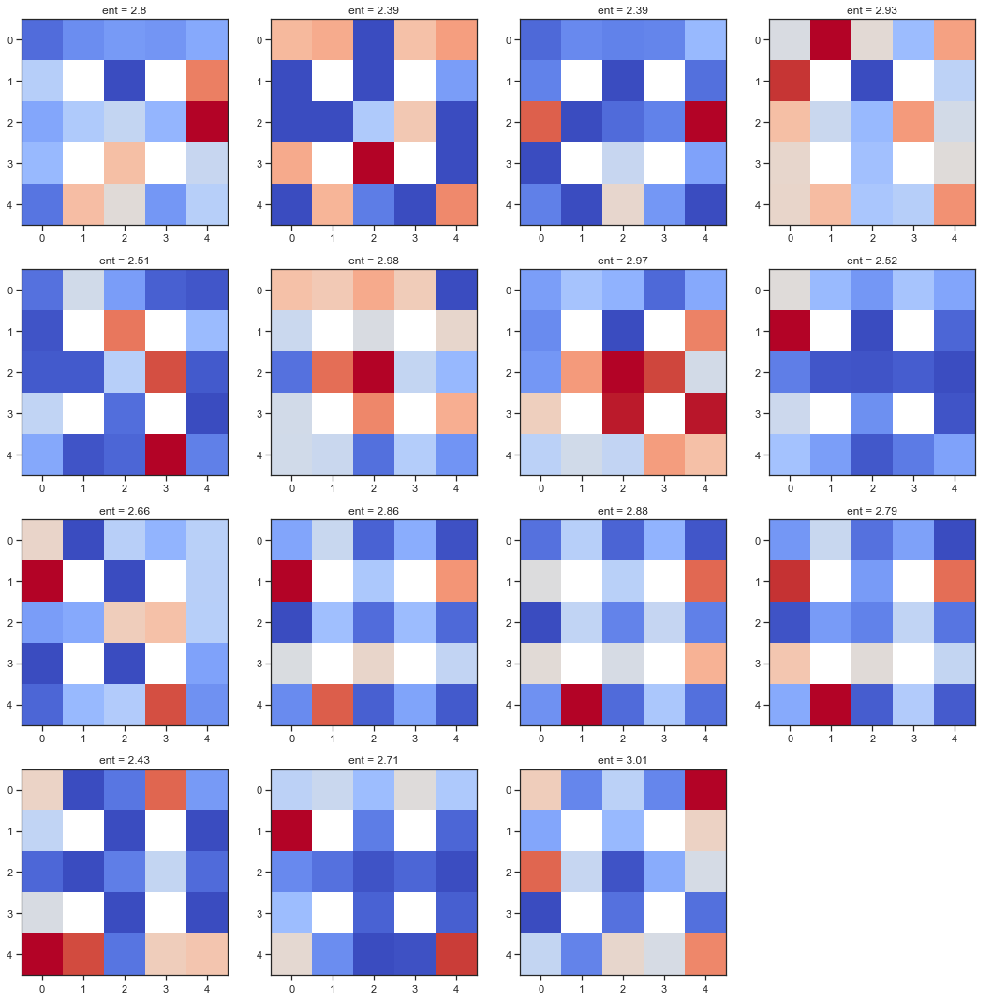

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


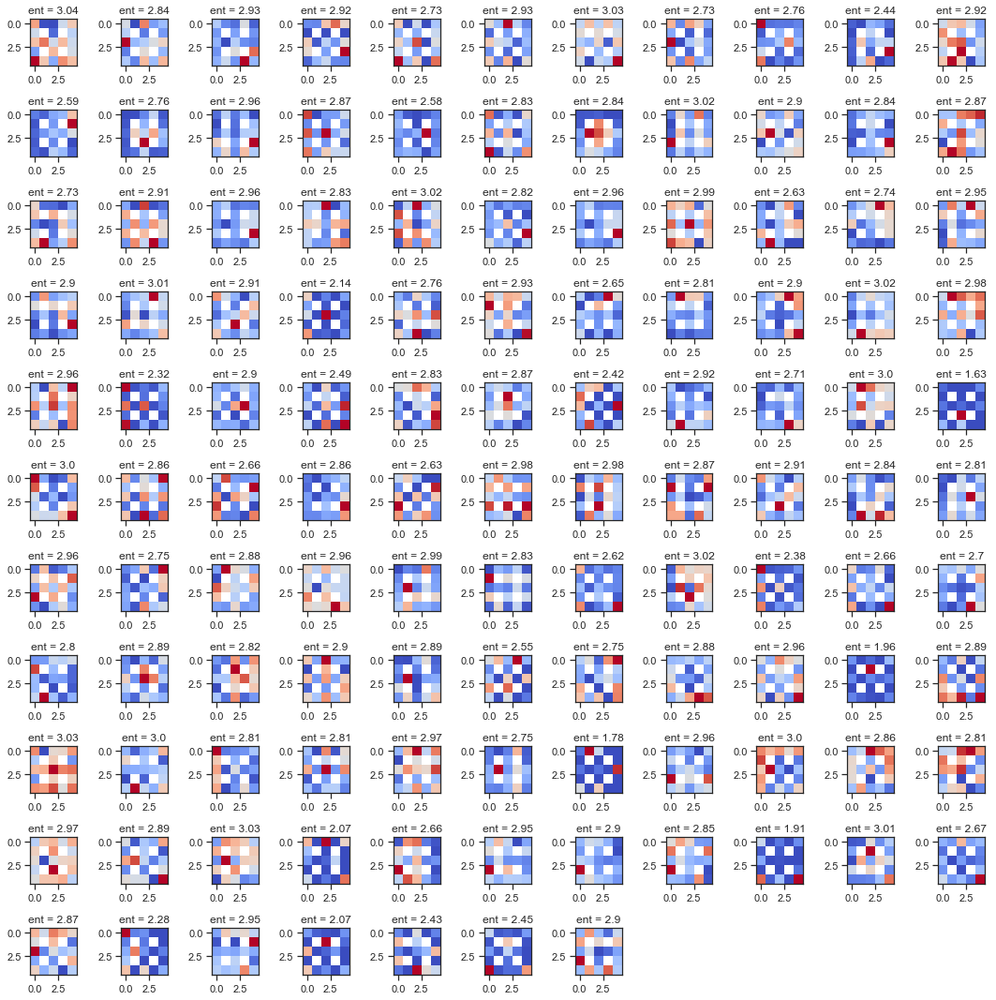

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


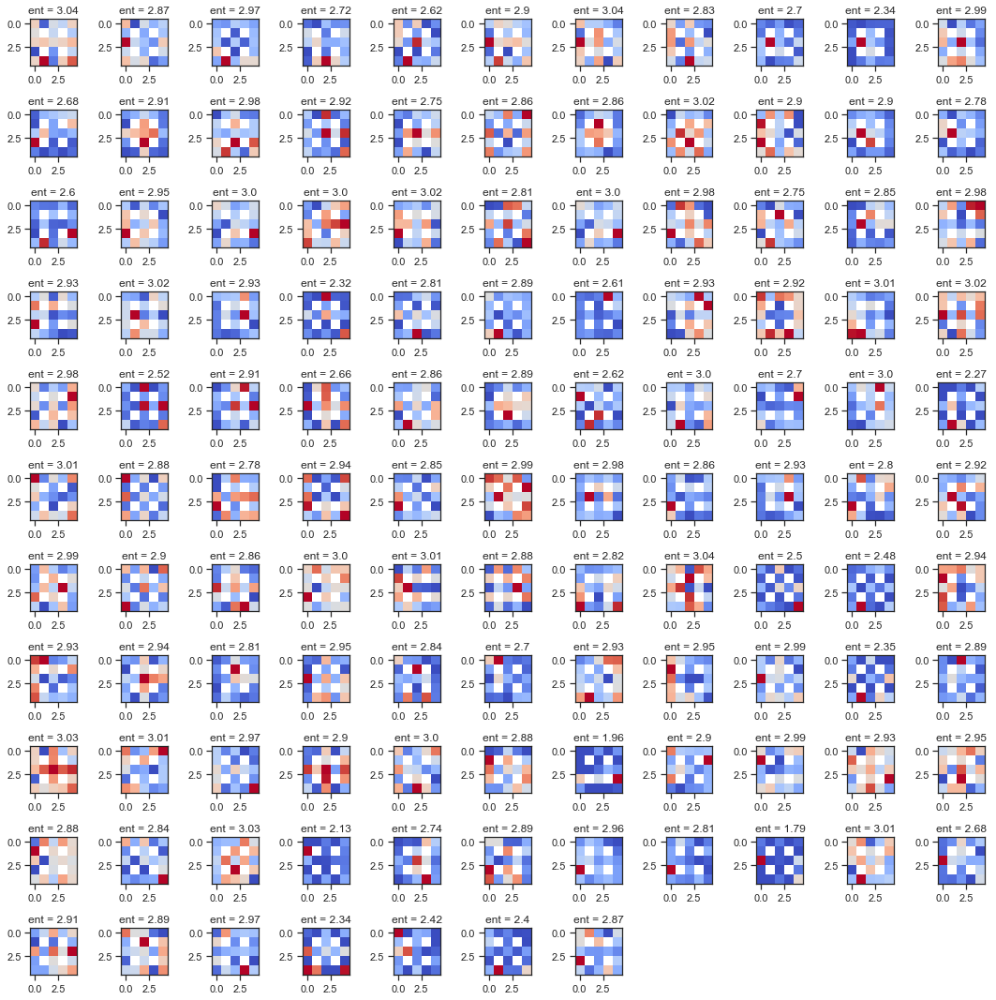

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


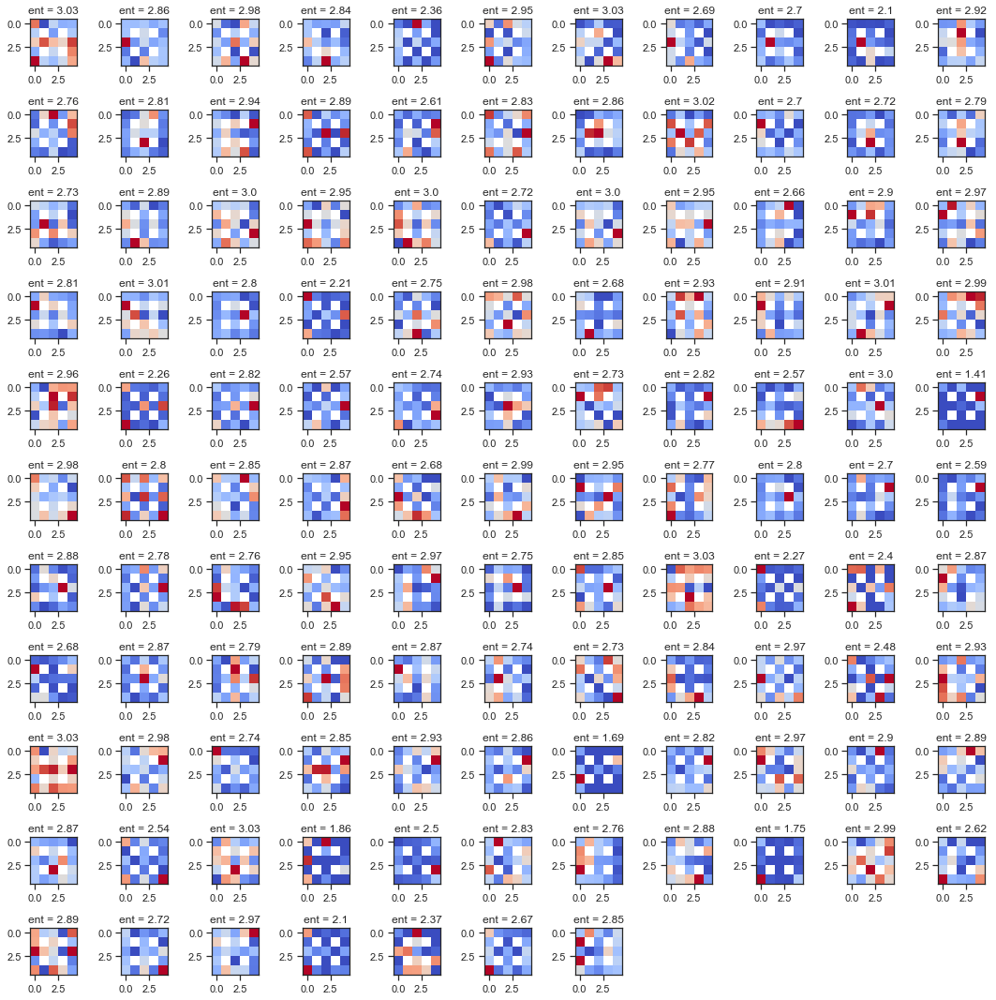

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


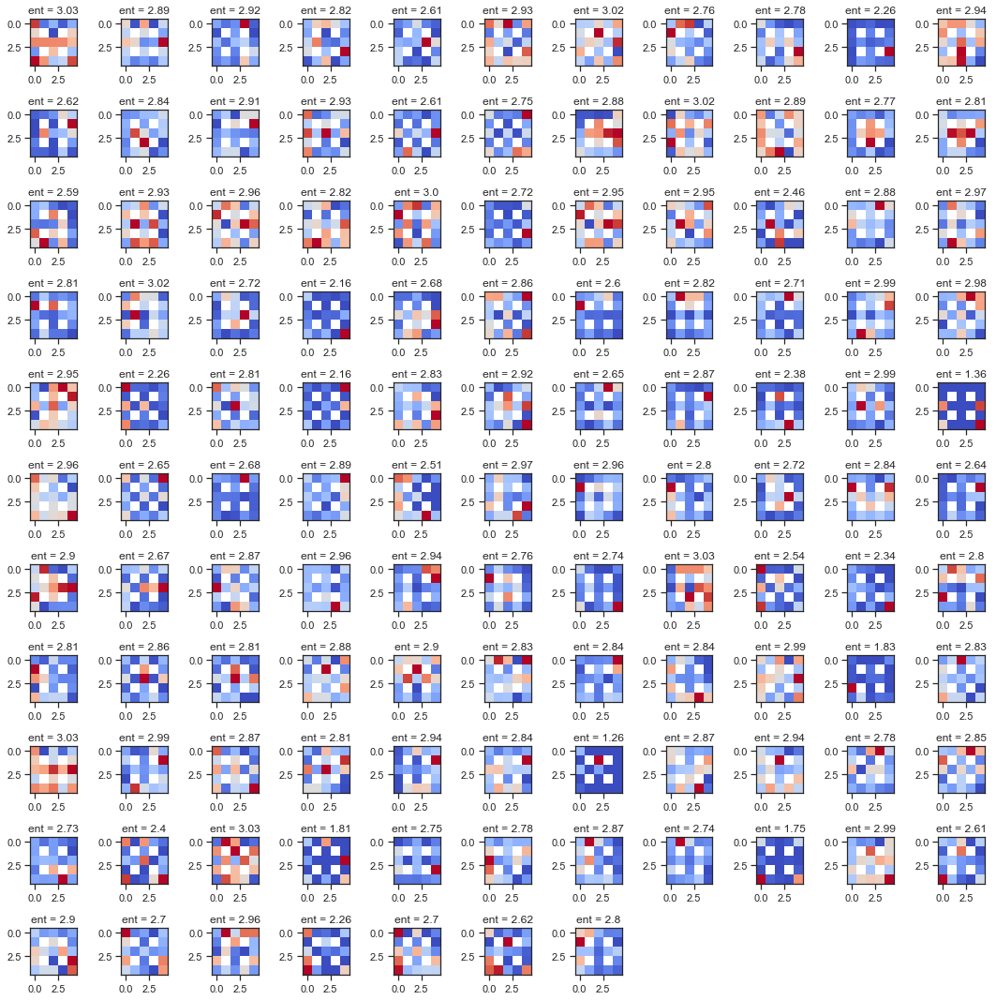

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


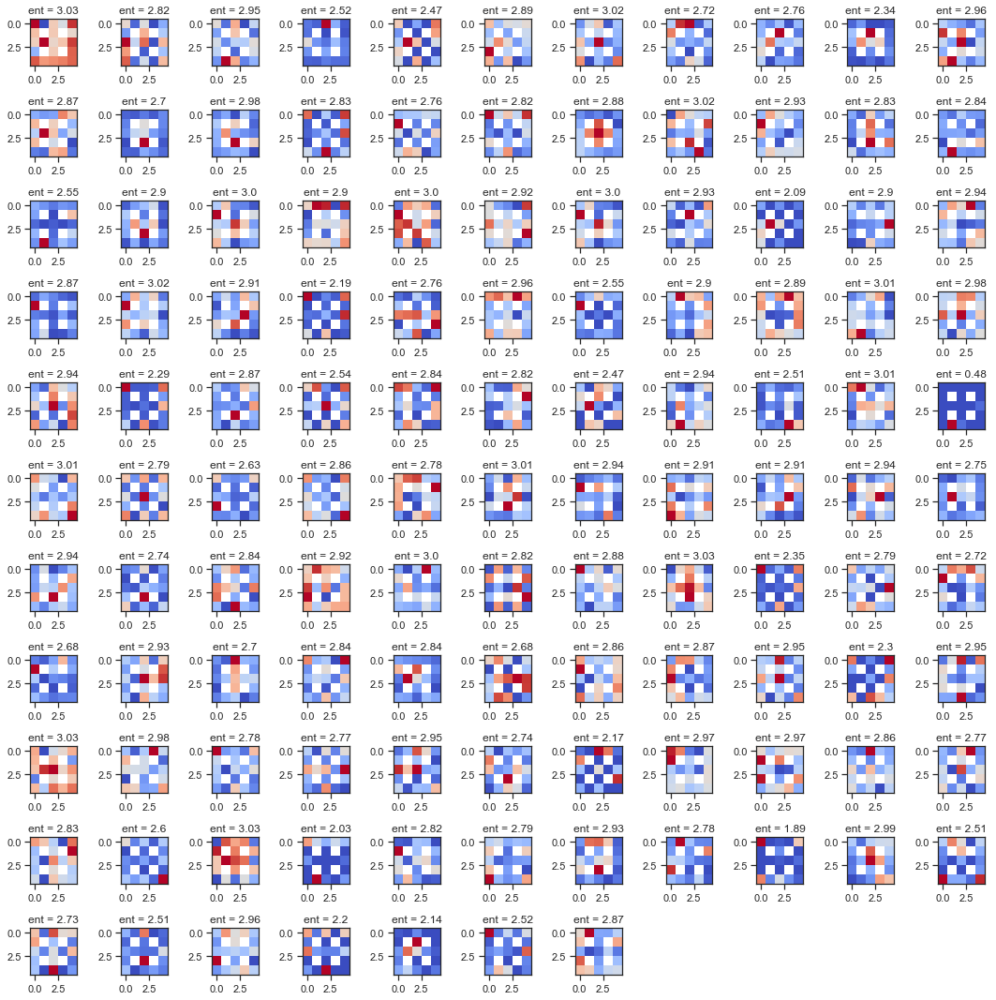

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


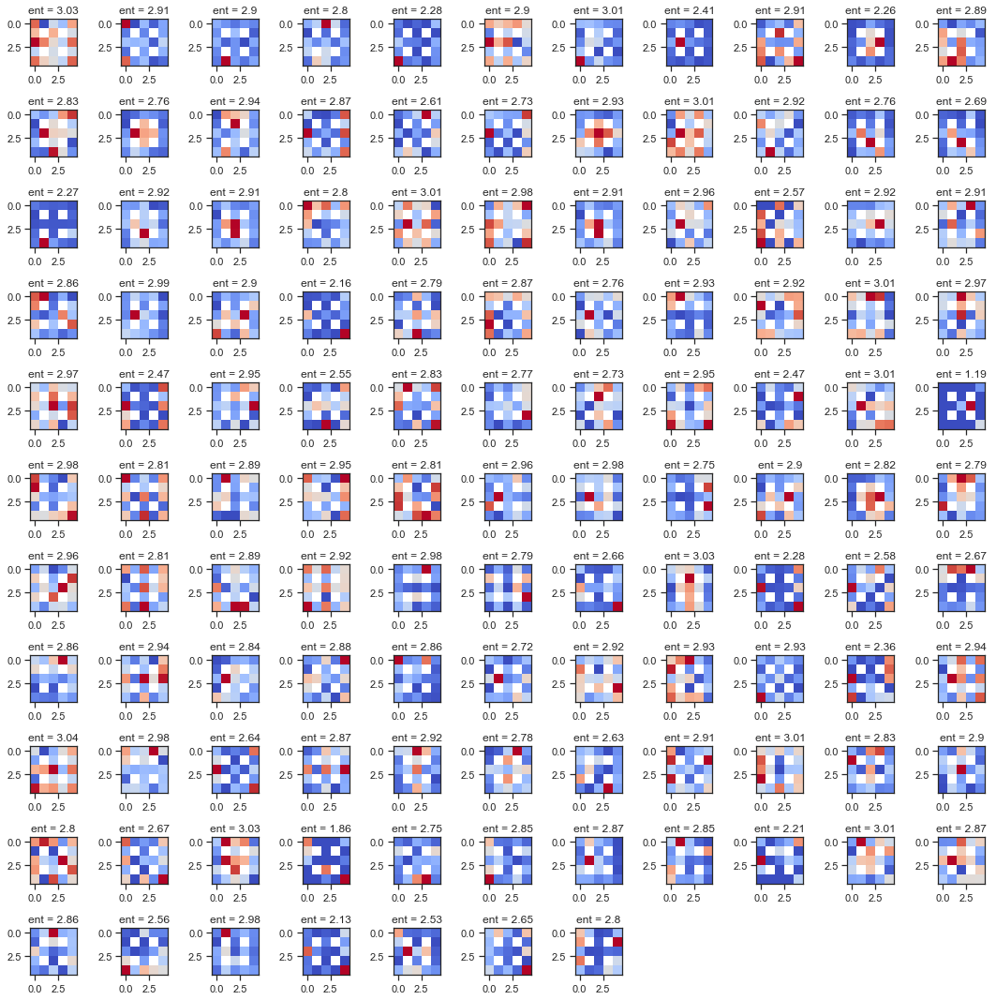

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


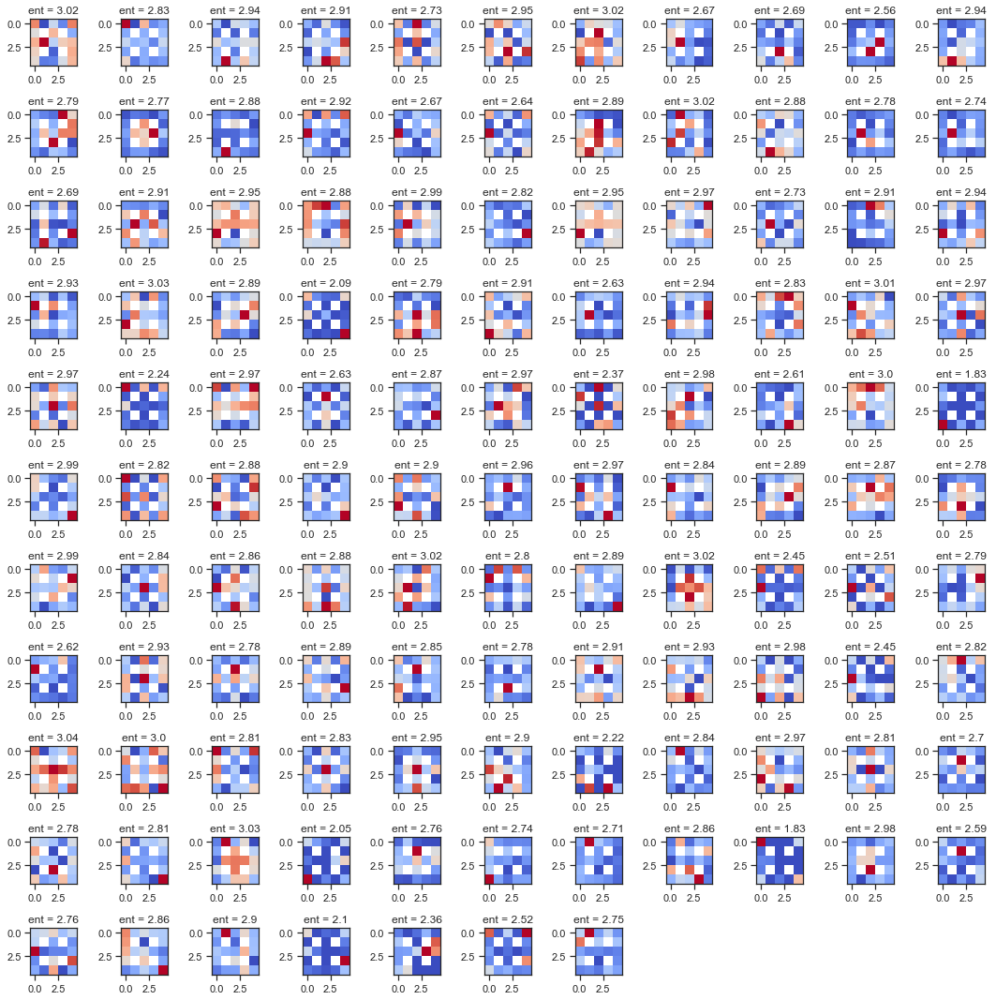

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


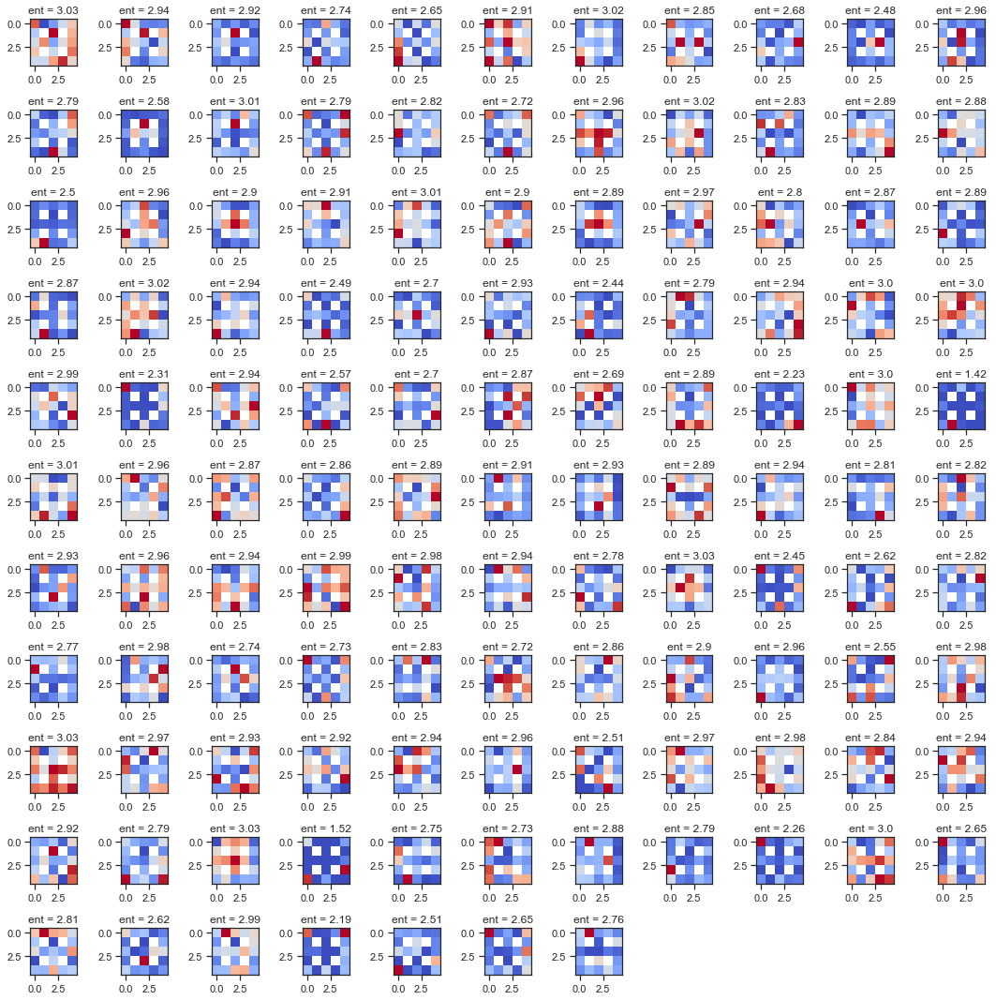

Exception: ah04_05122021_06122021_3.npy  not found


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


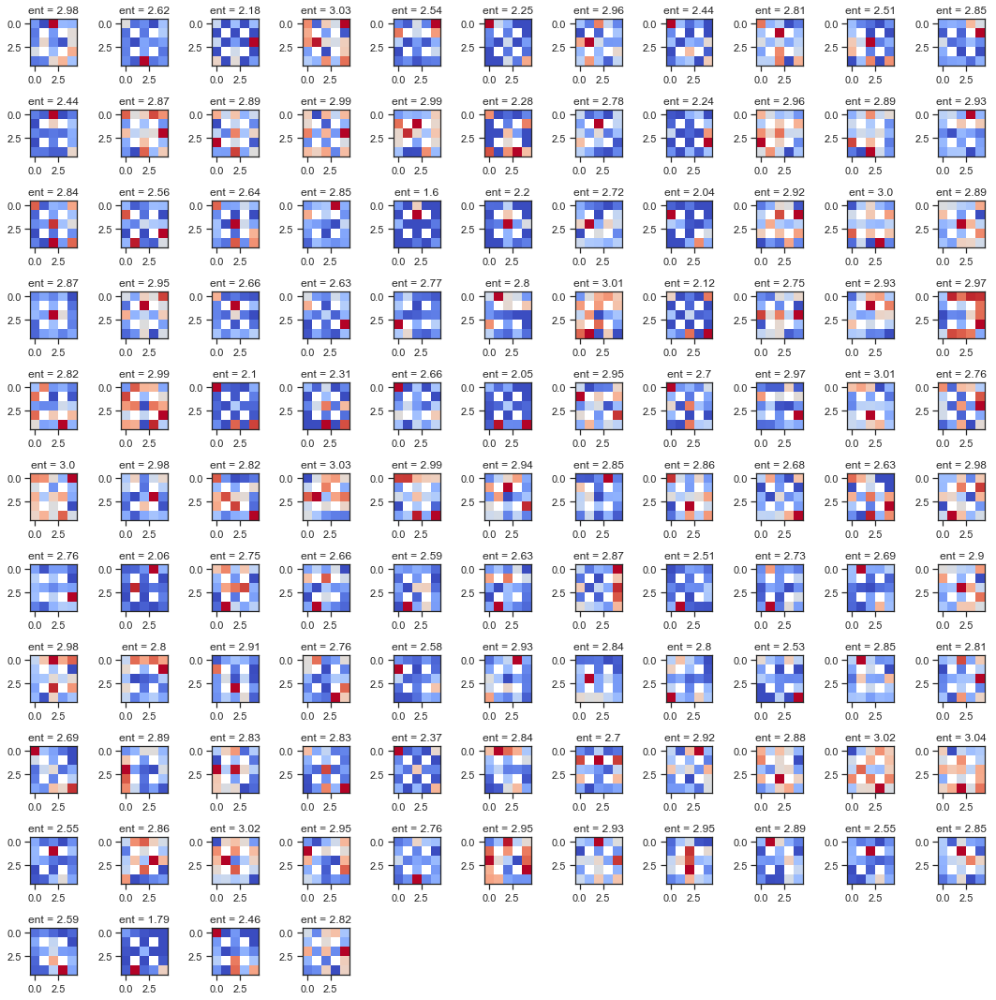

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


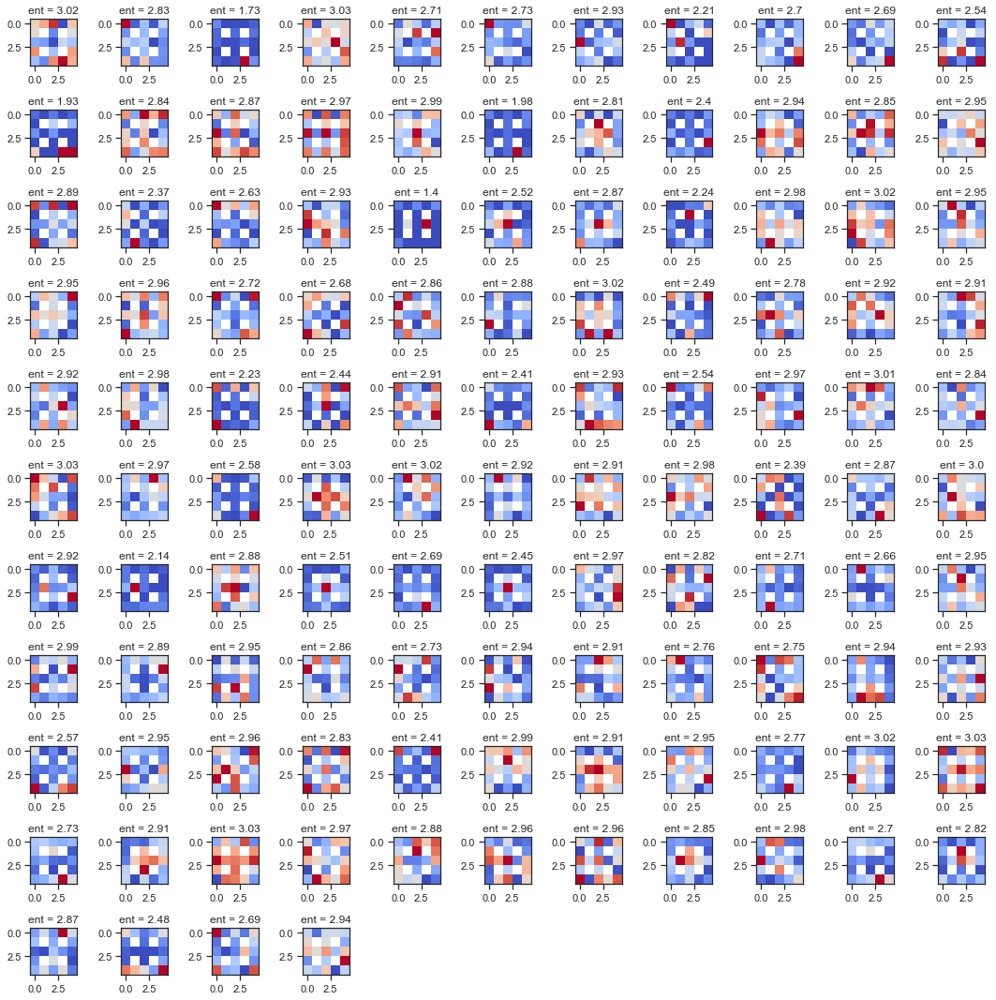

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


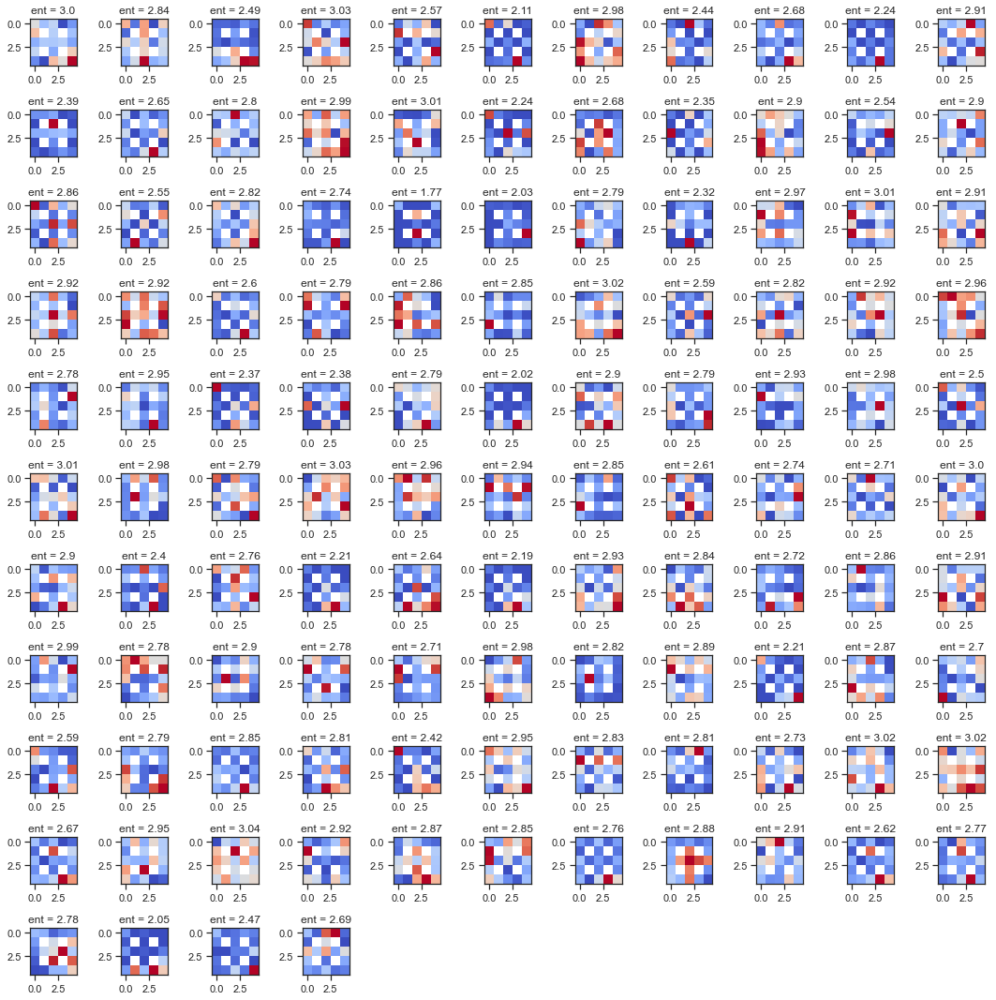

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


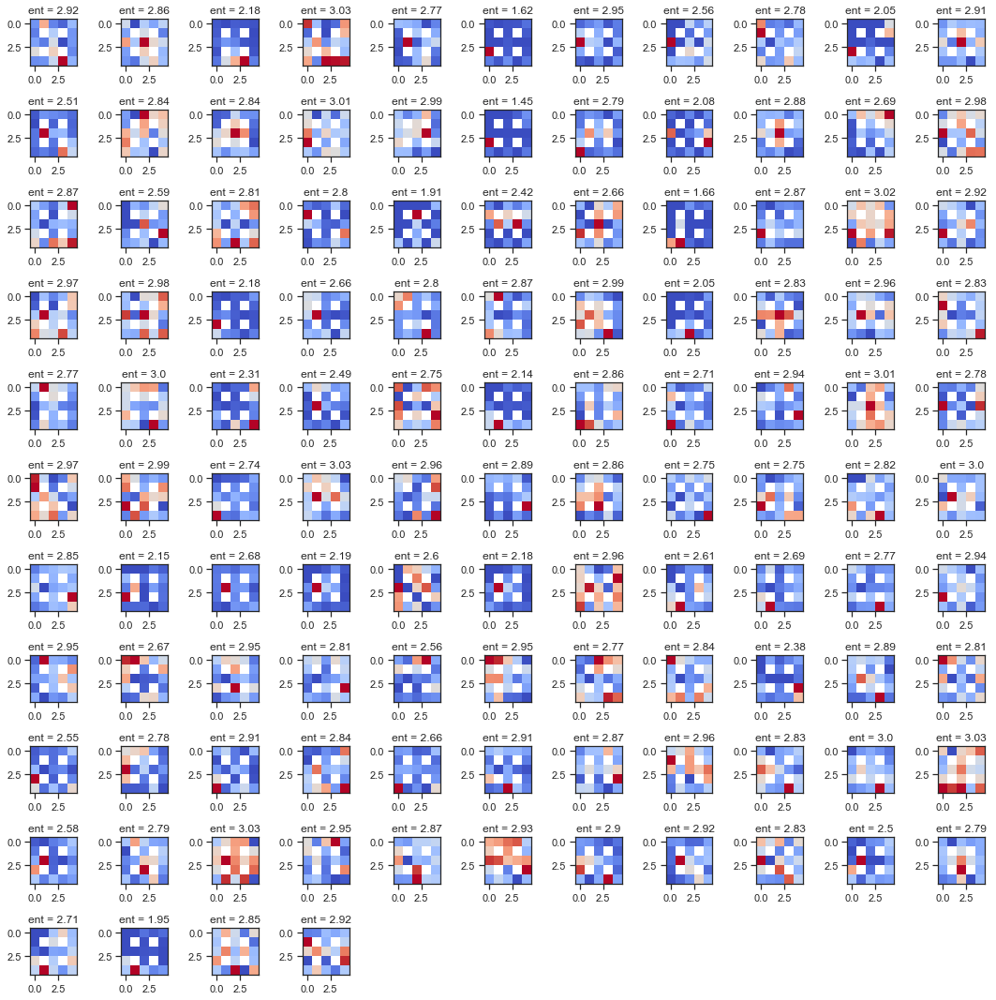

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


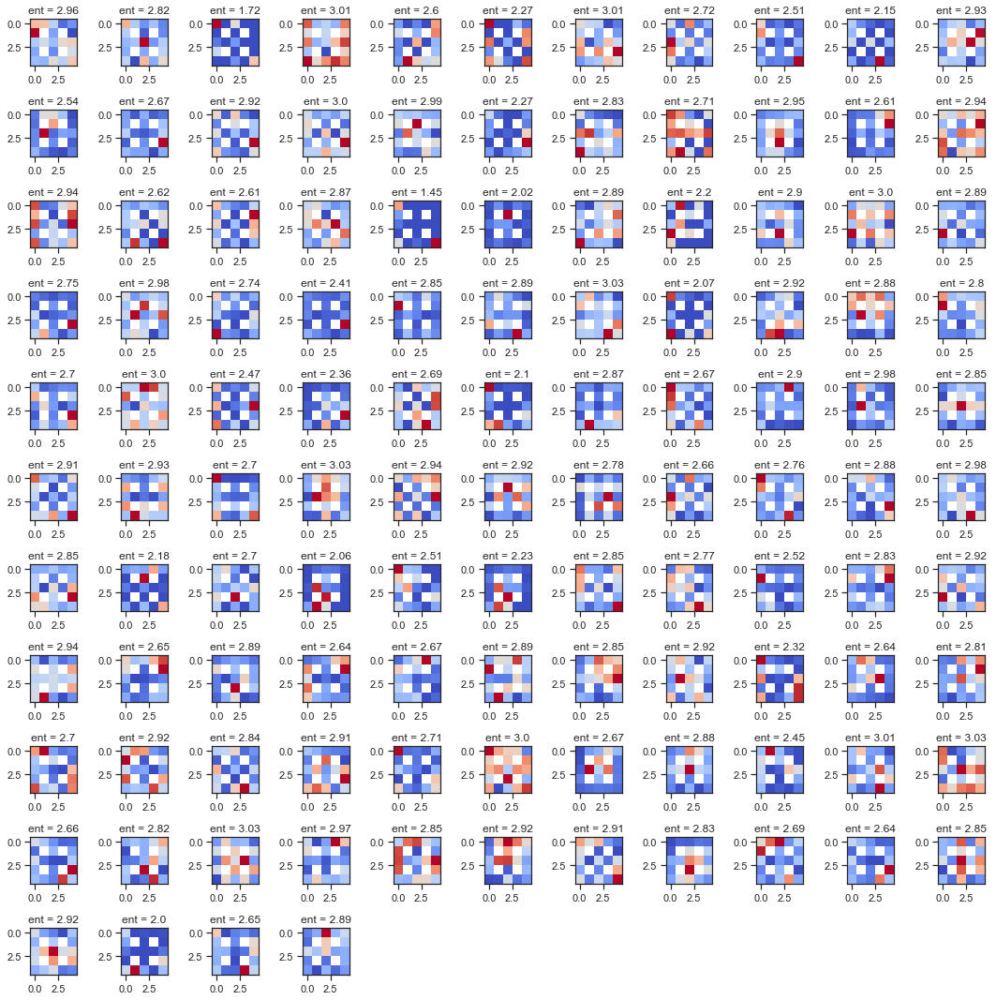

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


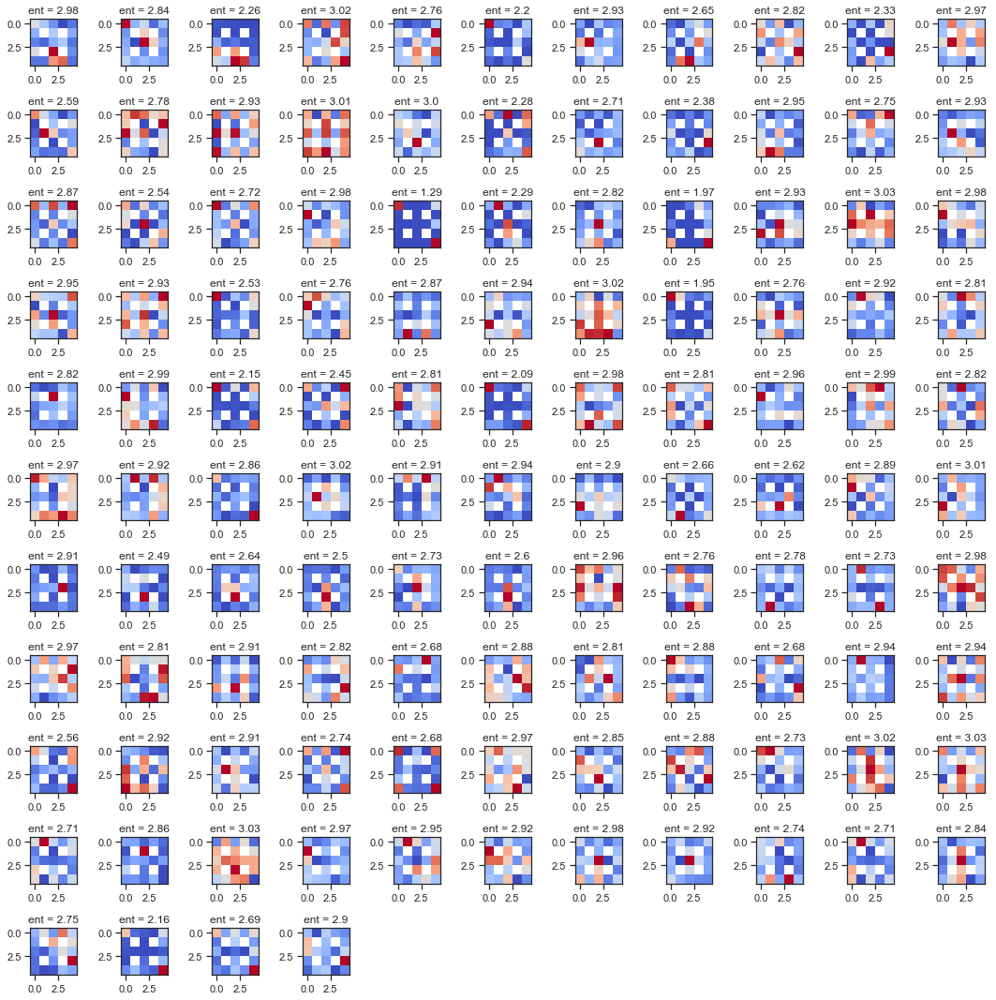

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


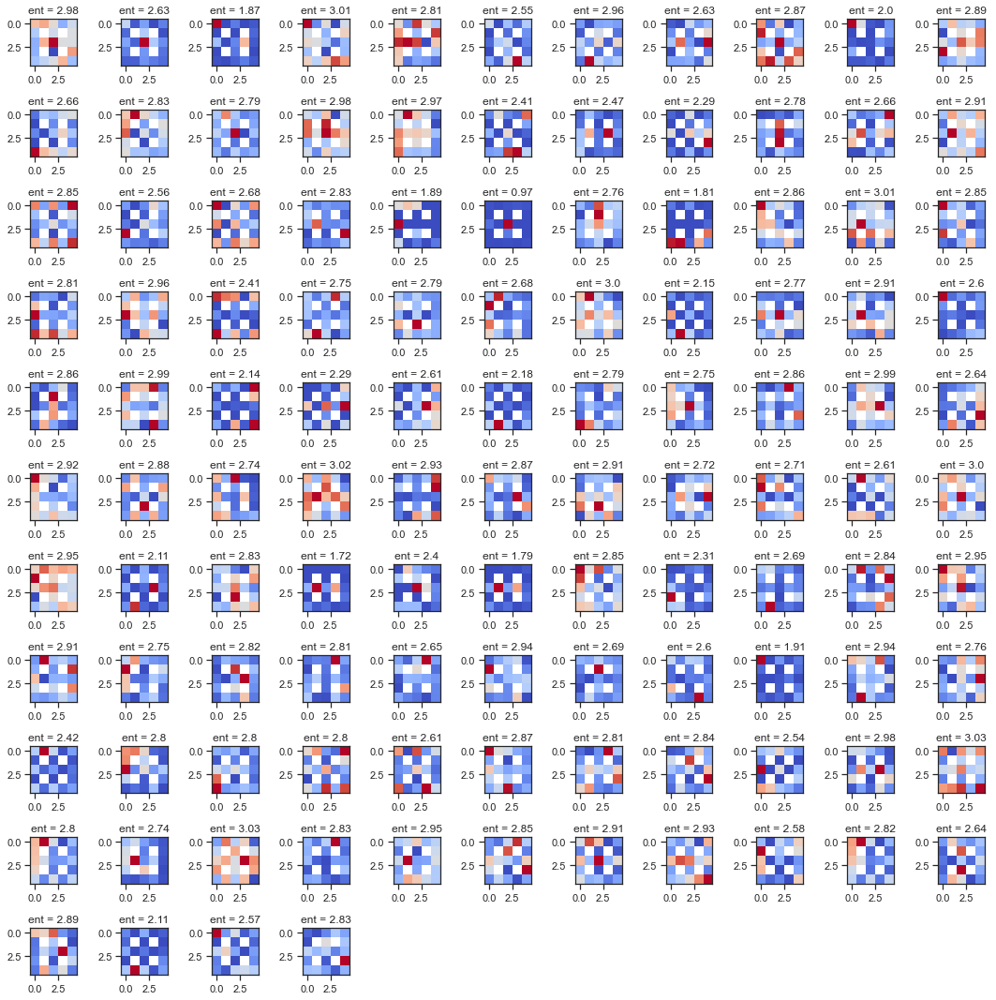

Exception: ah04_09122021_10122021_3.npy  not found


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


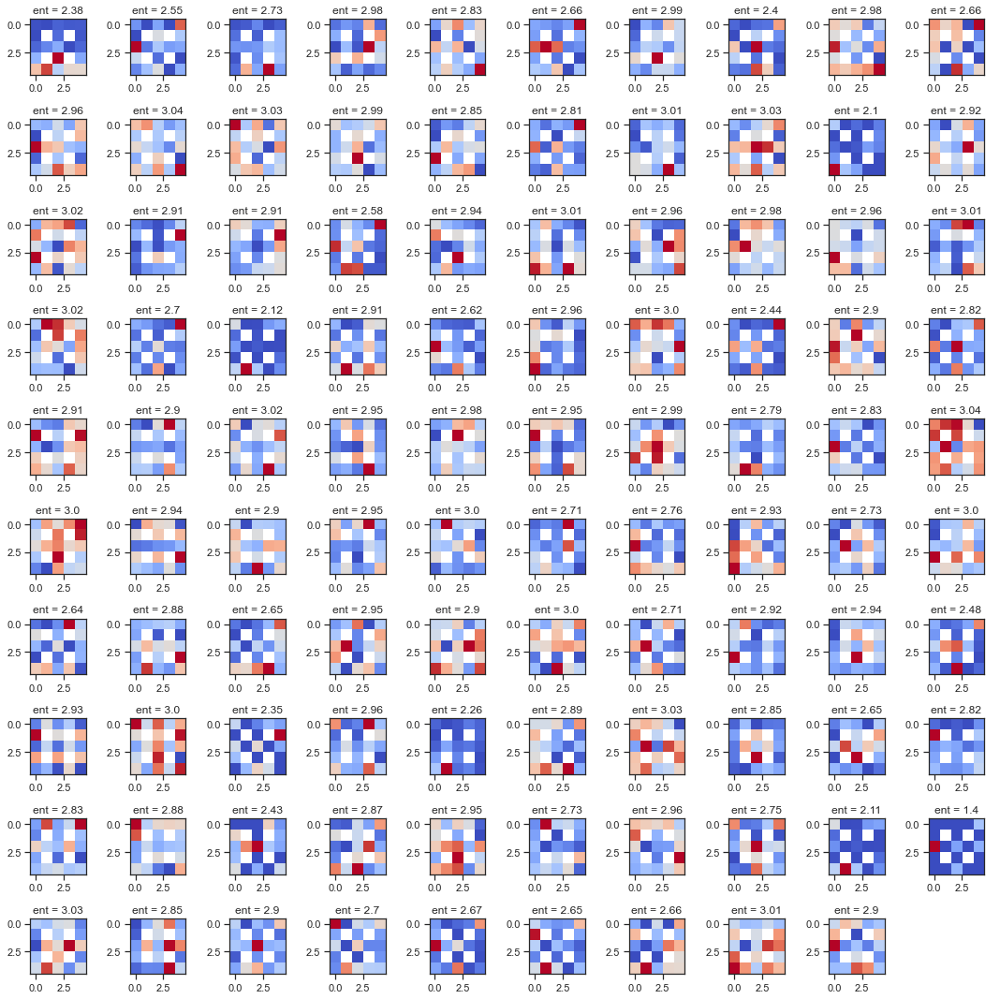

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


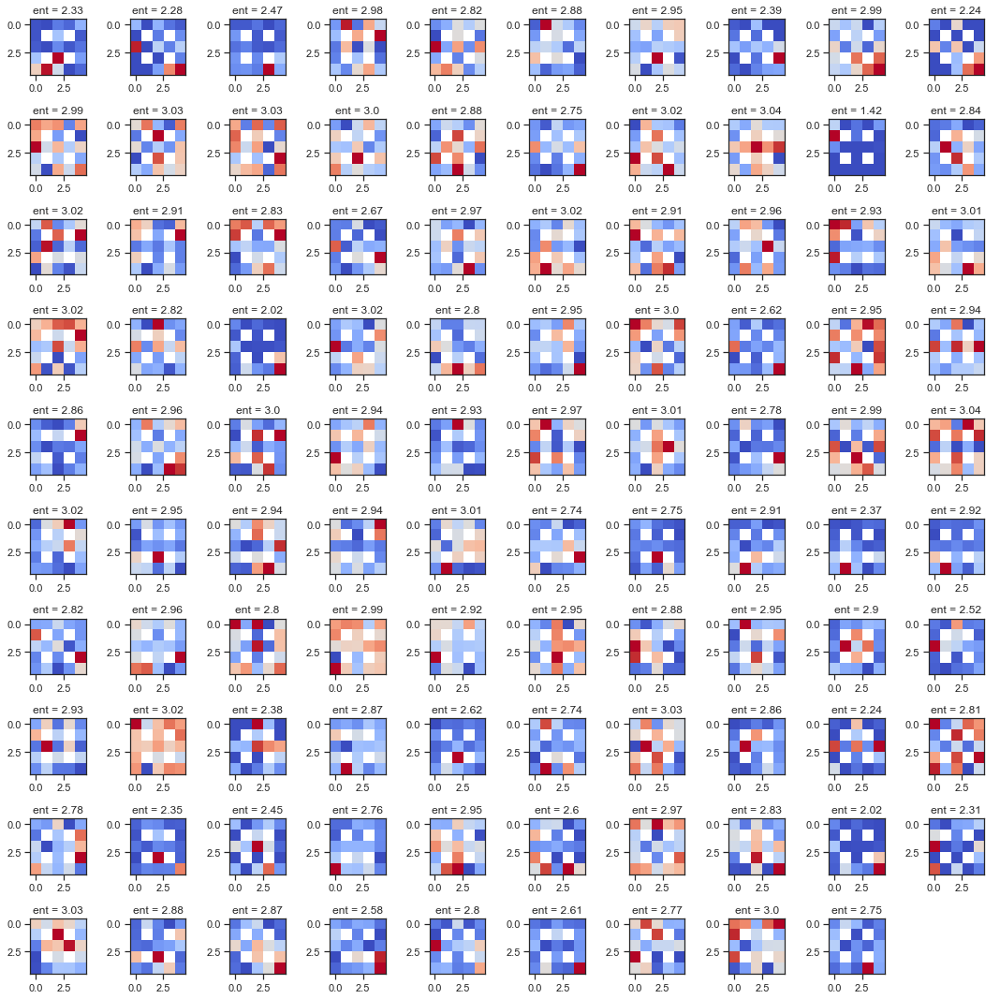

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


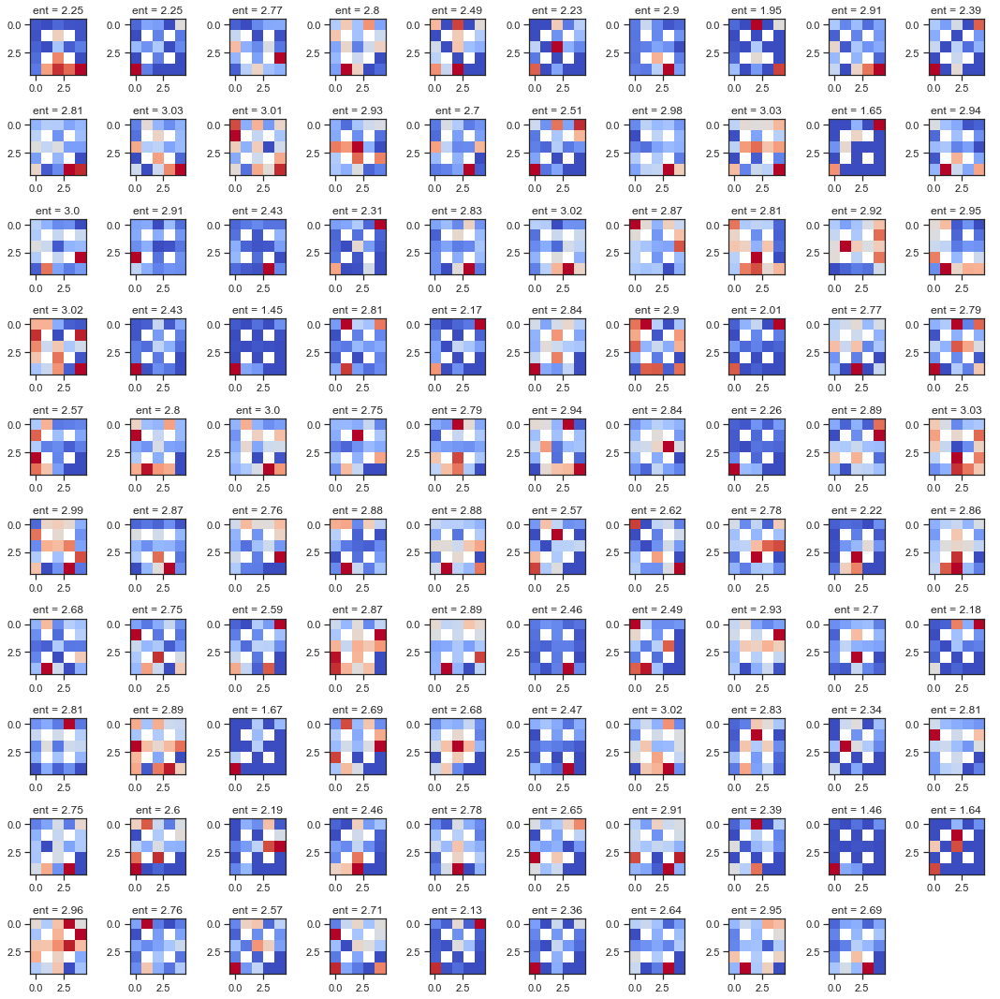

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


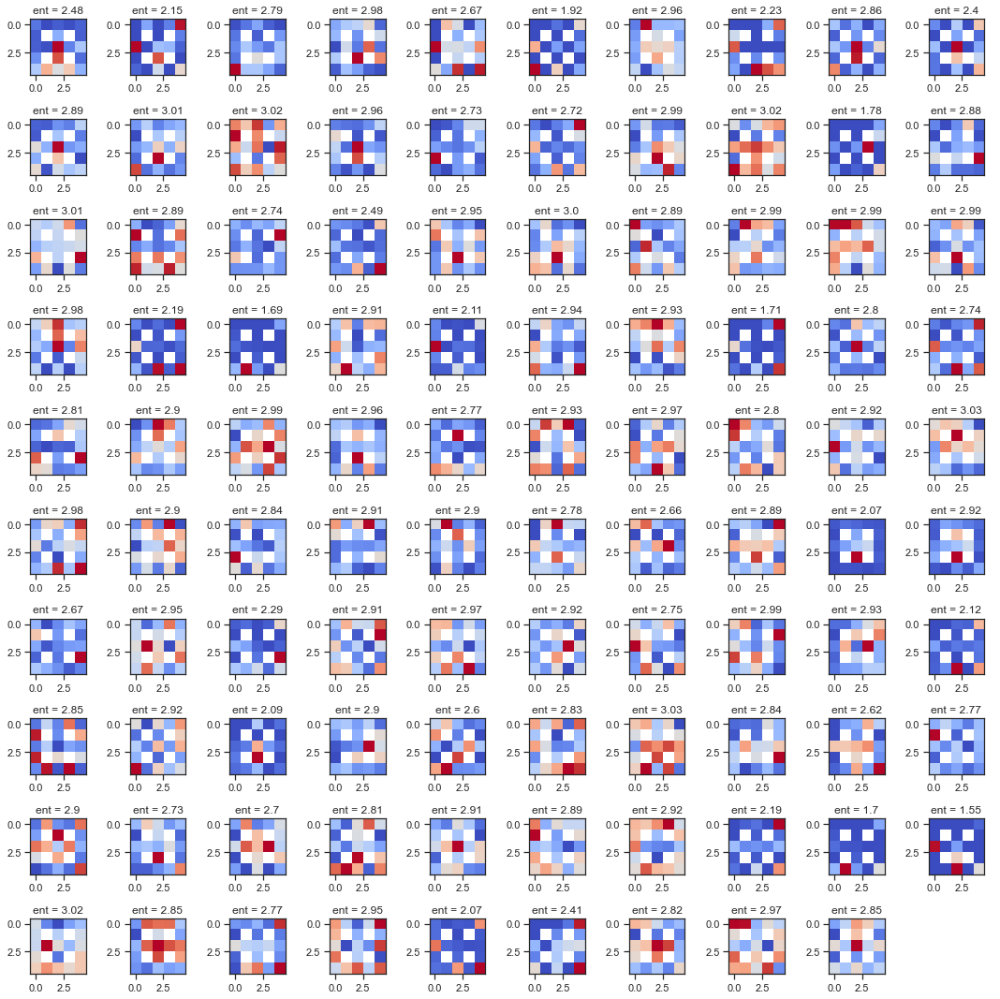

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


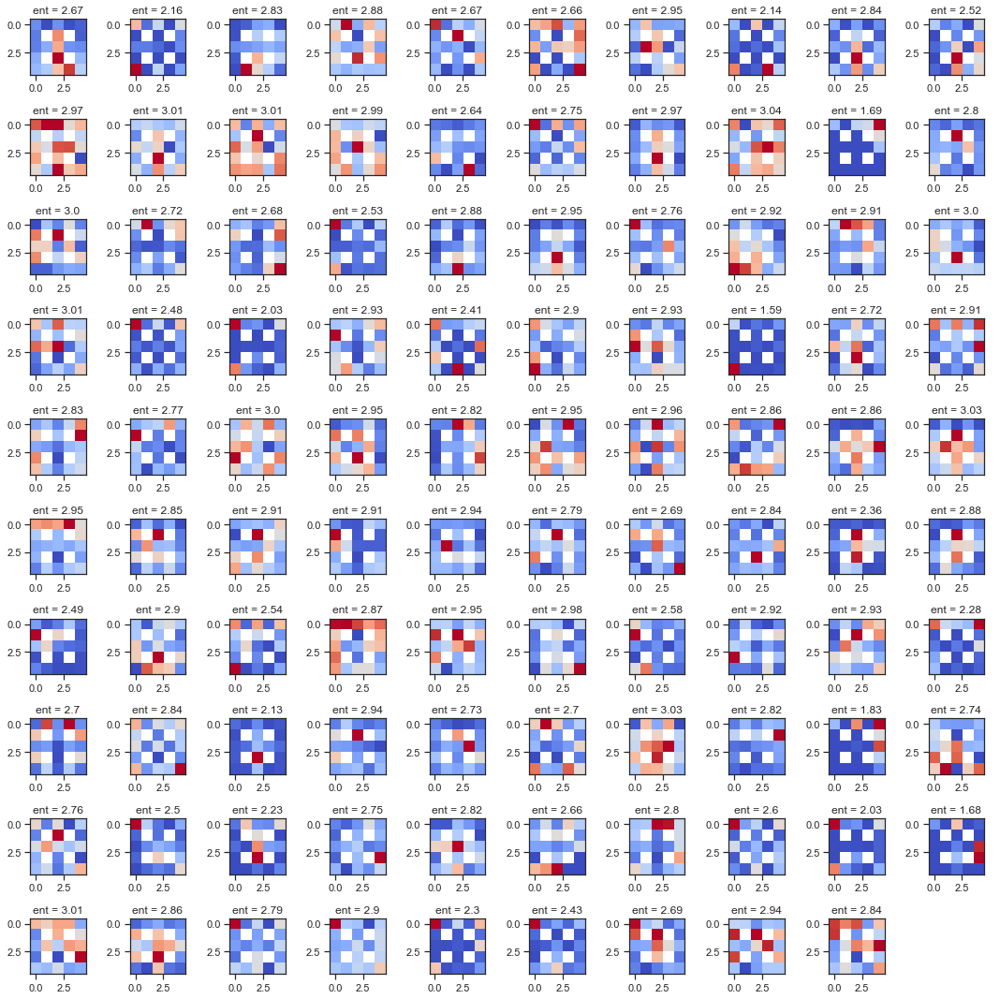

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


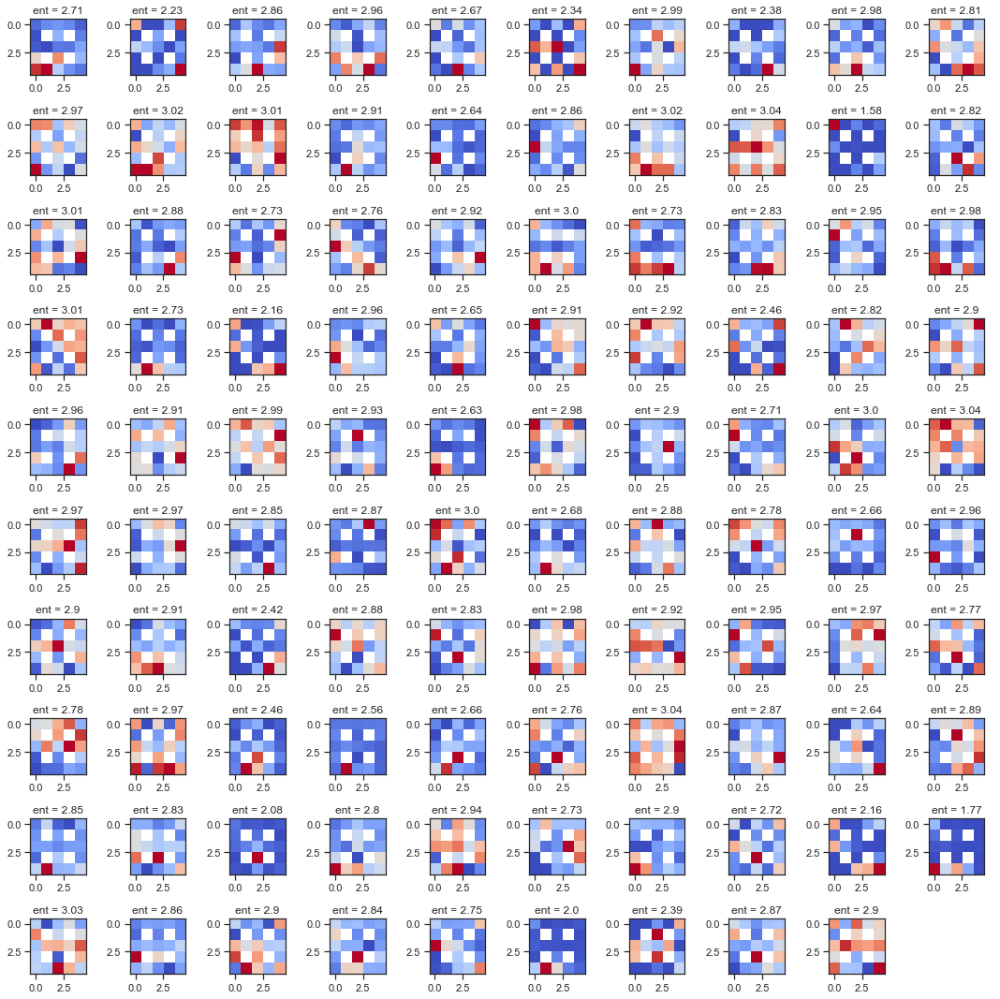

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


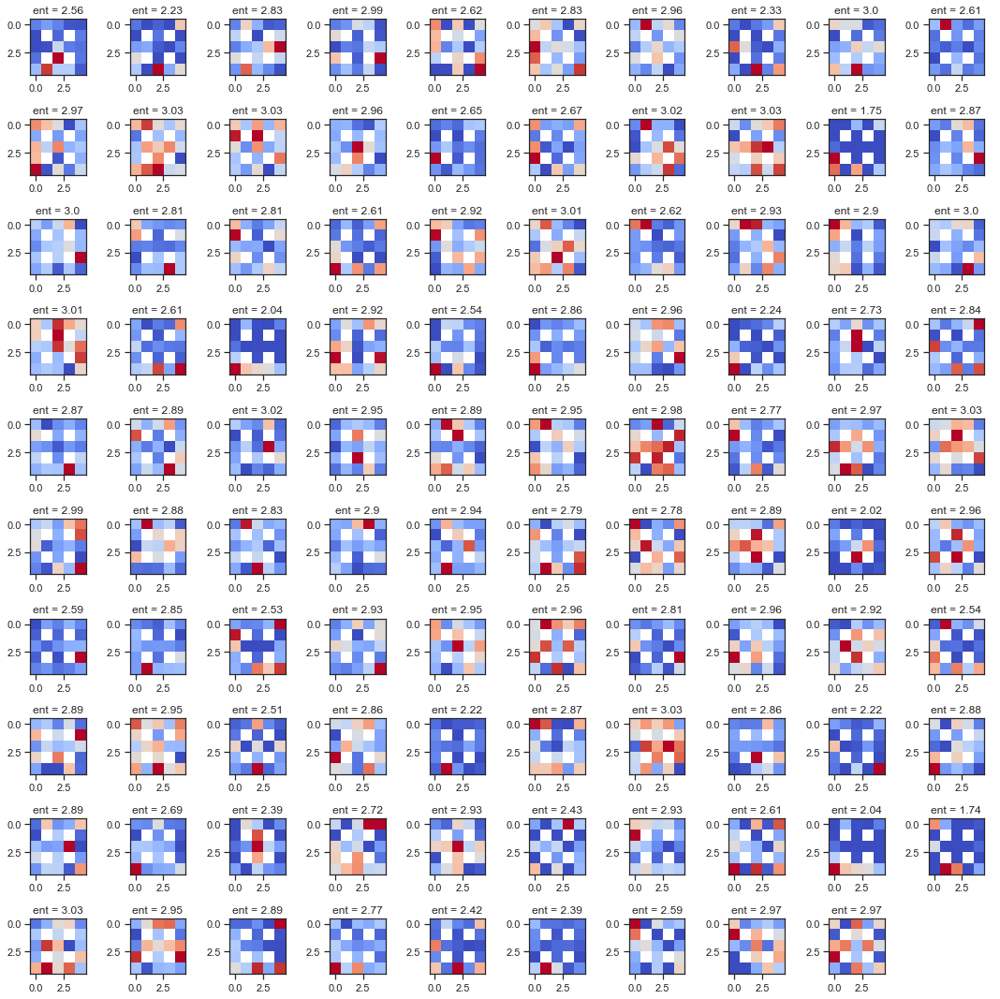

Exception: me08_10092021_11092021_6.npy  not found


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


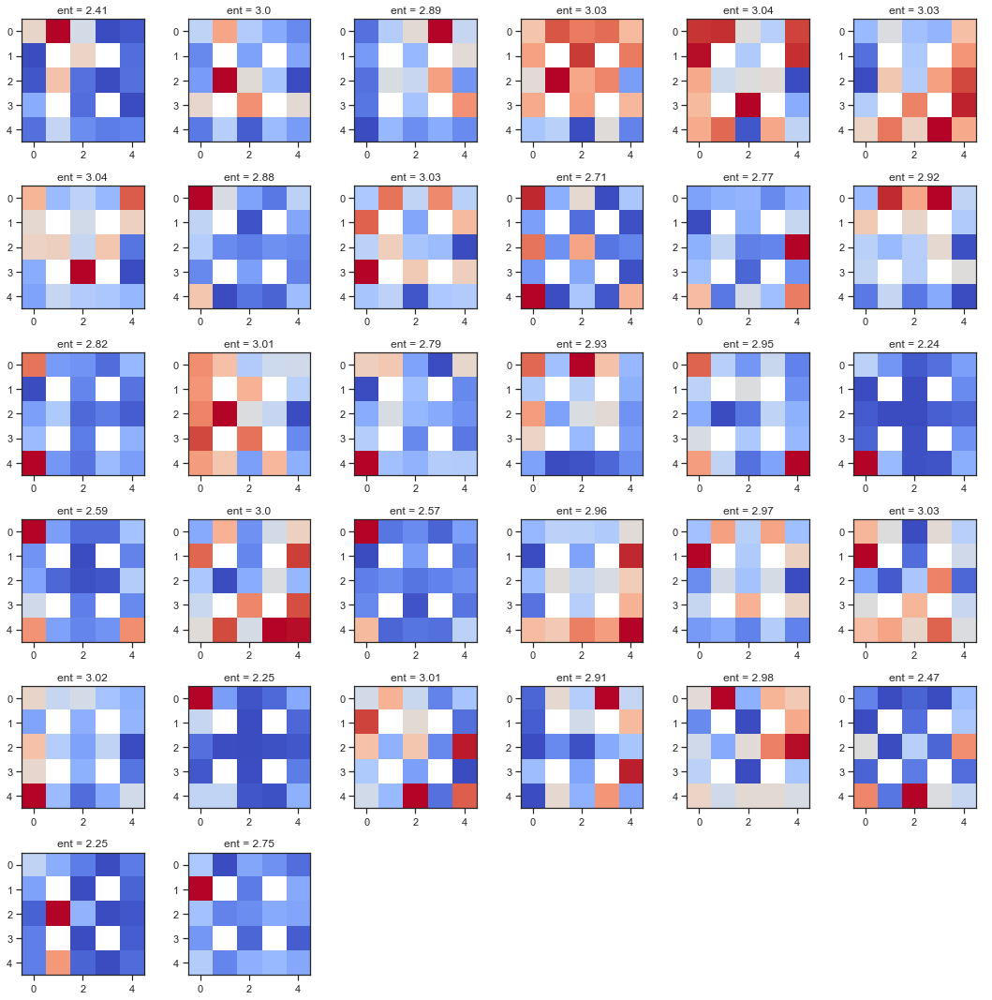

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


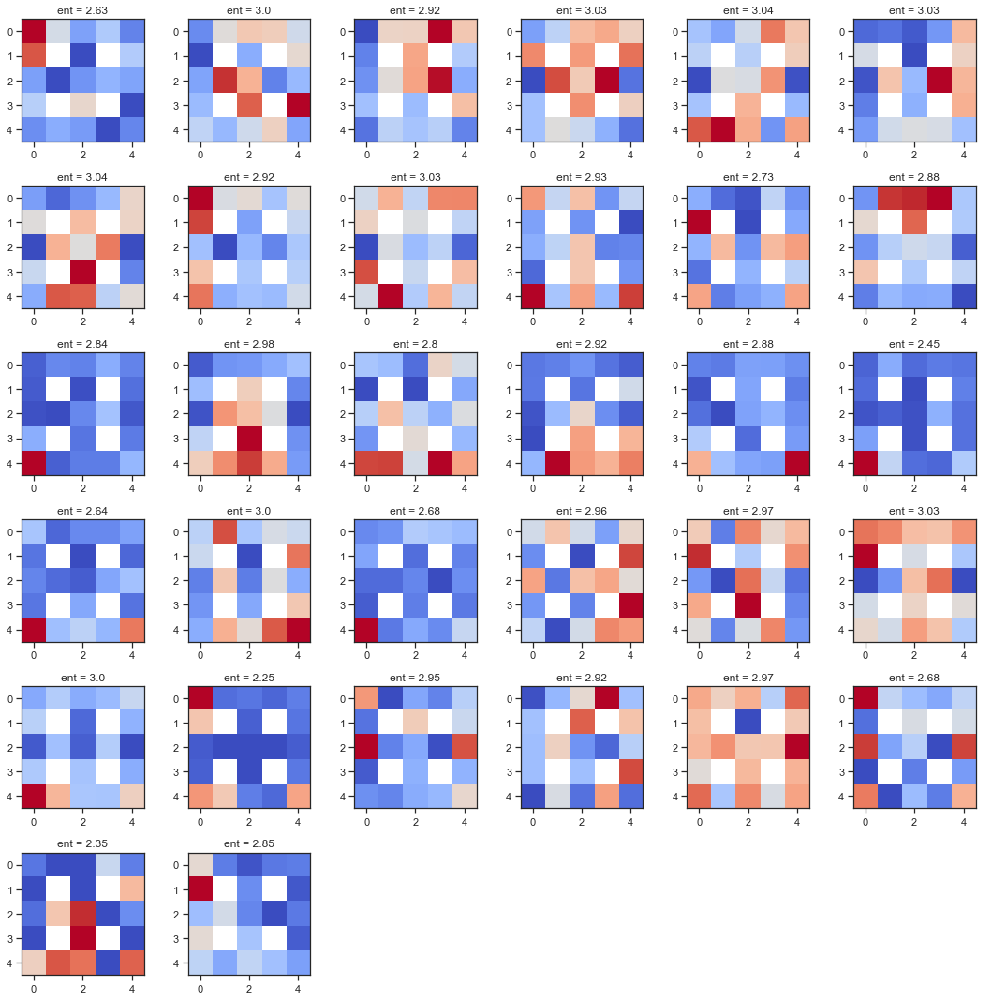

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


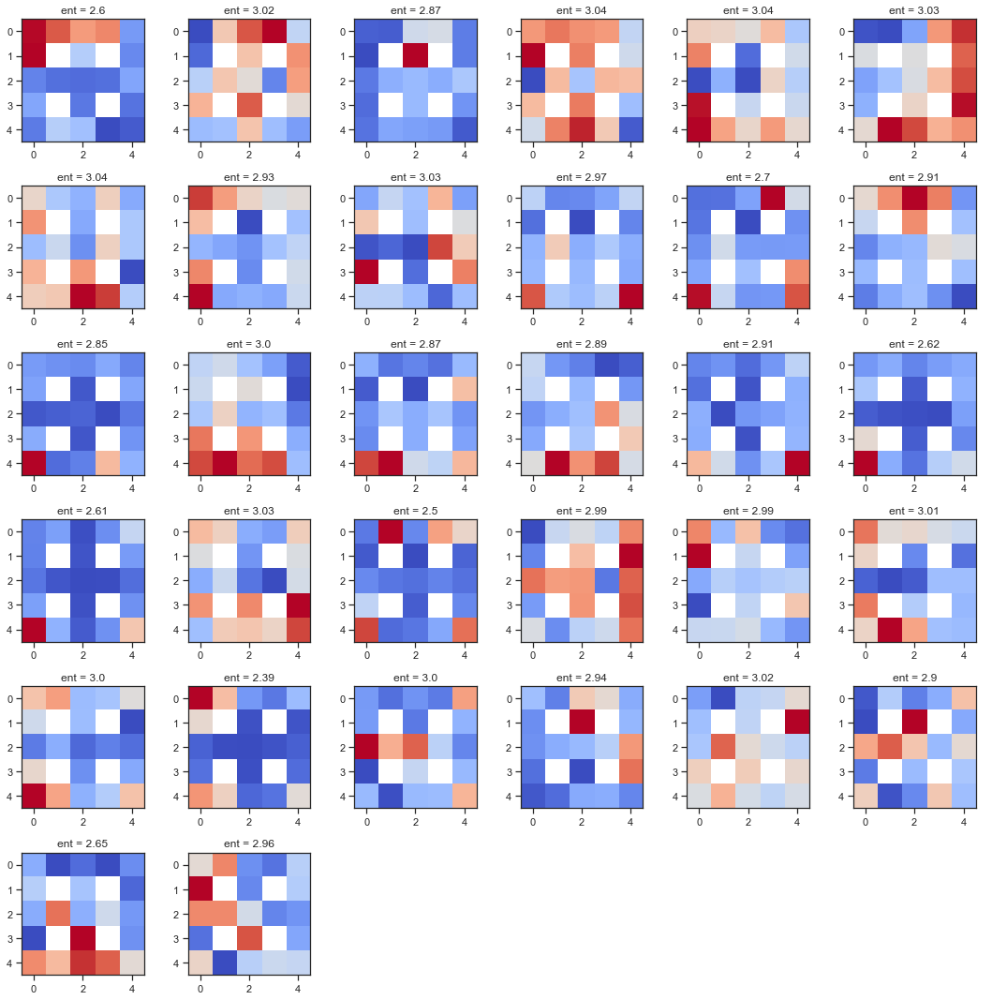

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


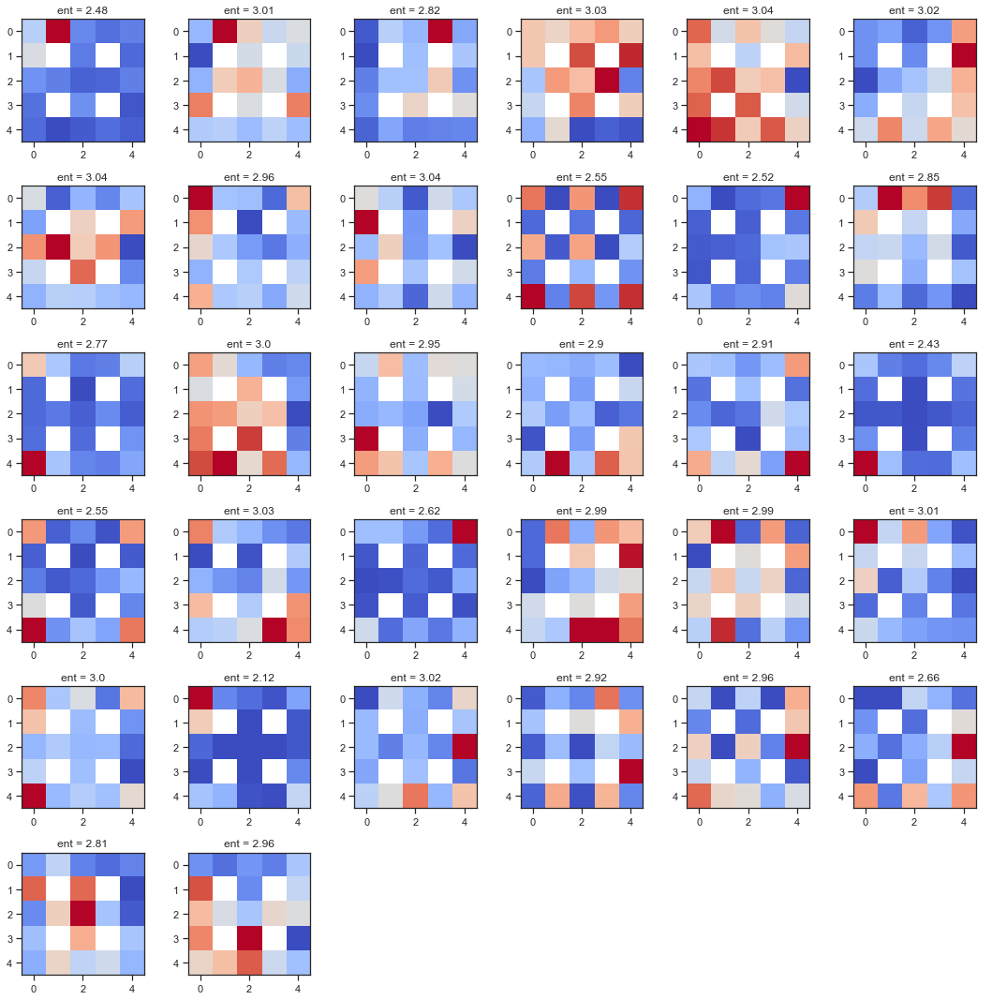

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


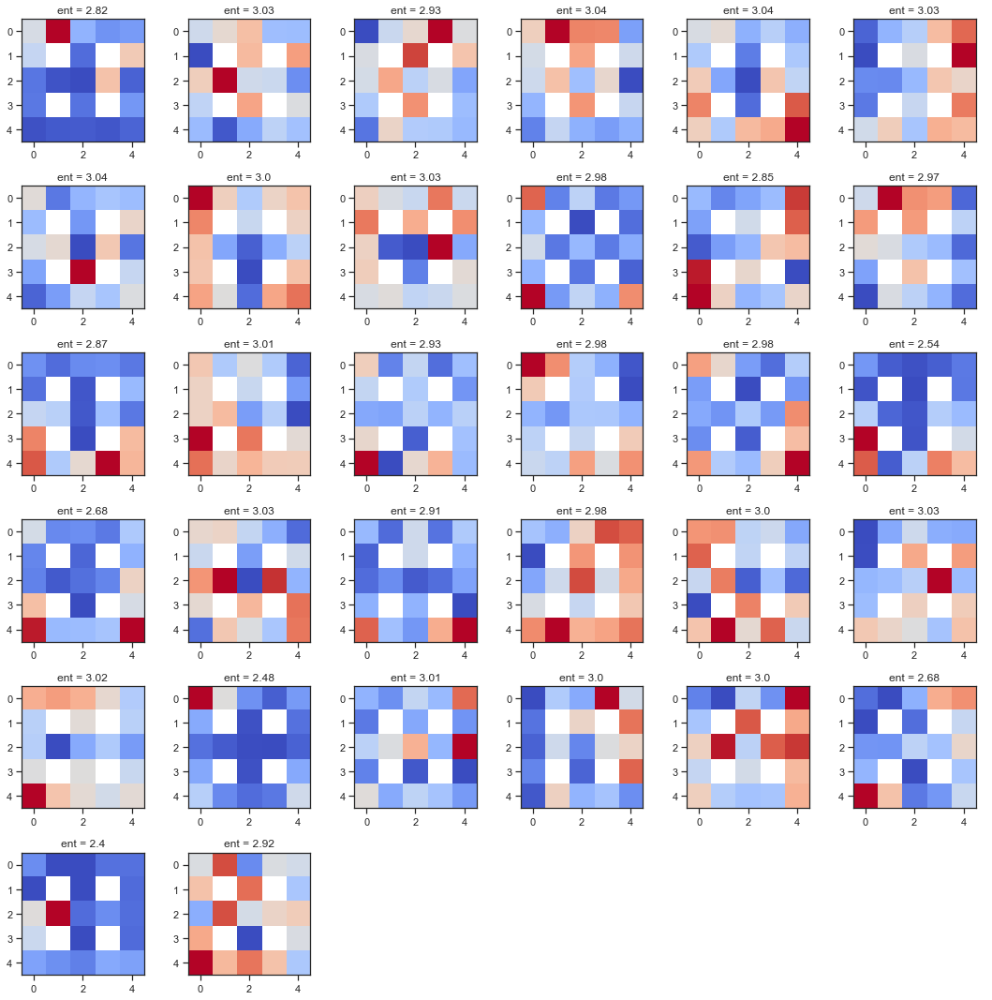

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


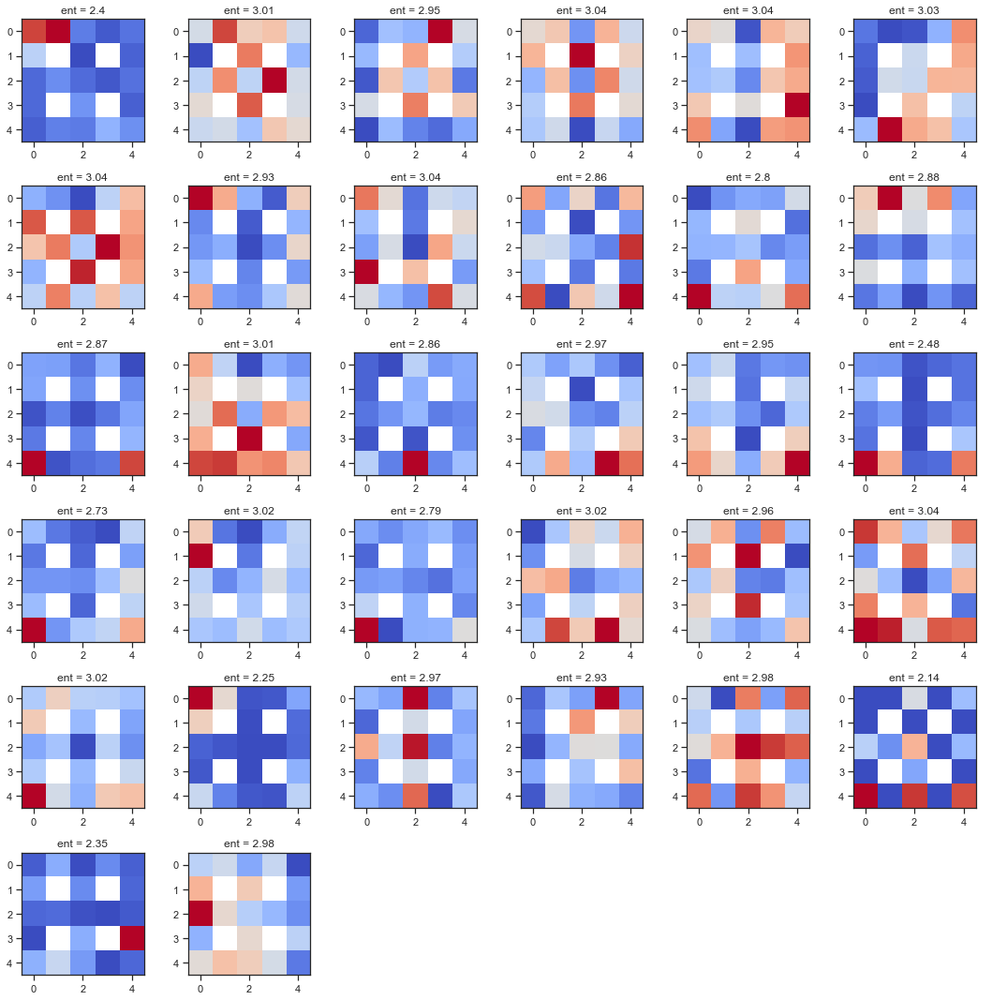

Exception: me10_09122021_10122021_8.npy  not found


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


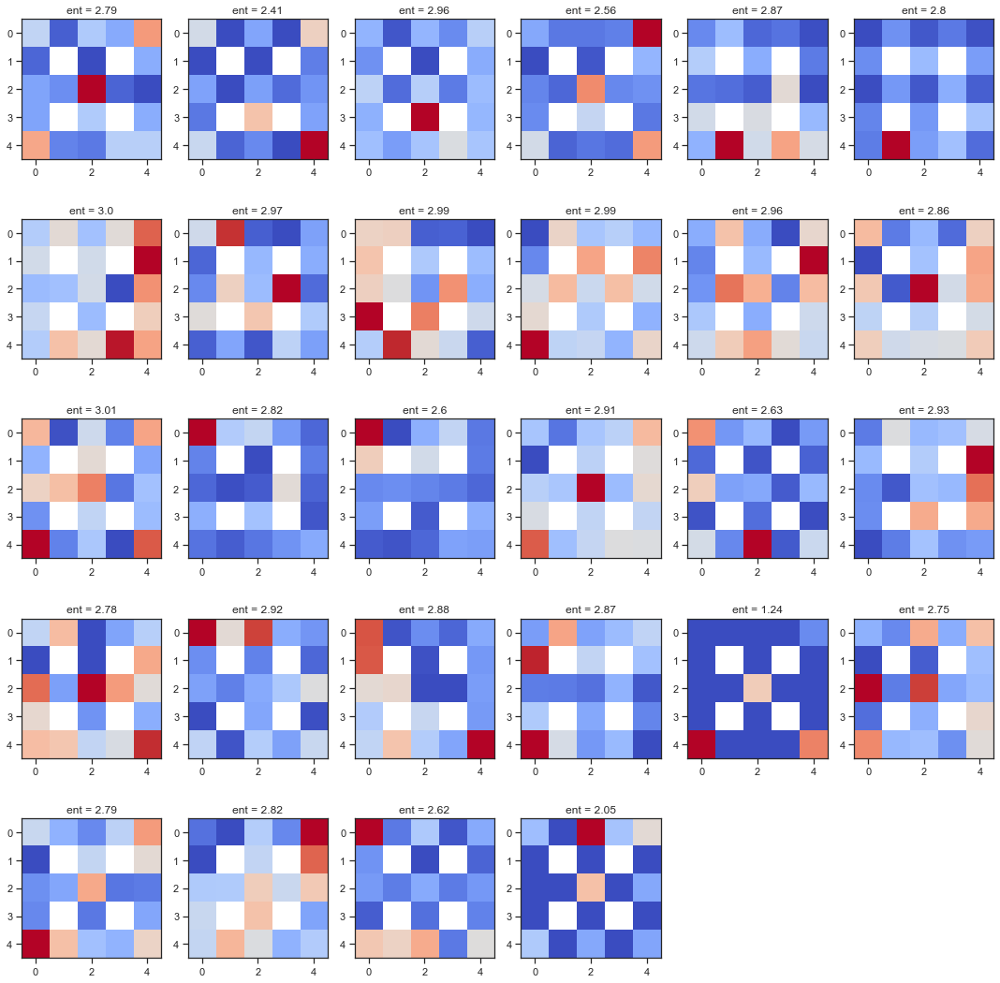

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


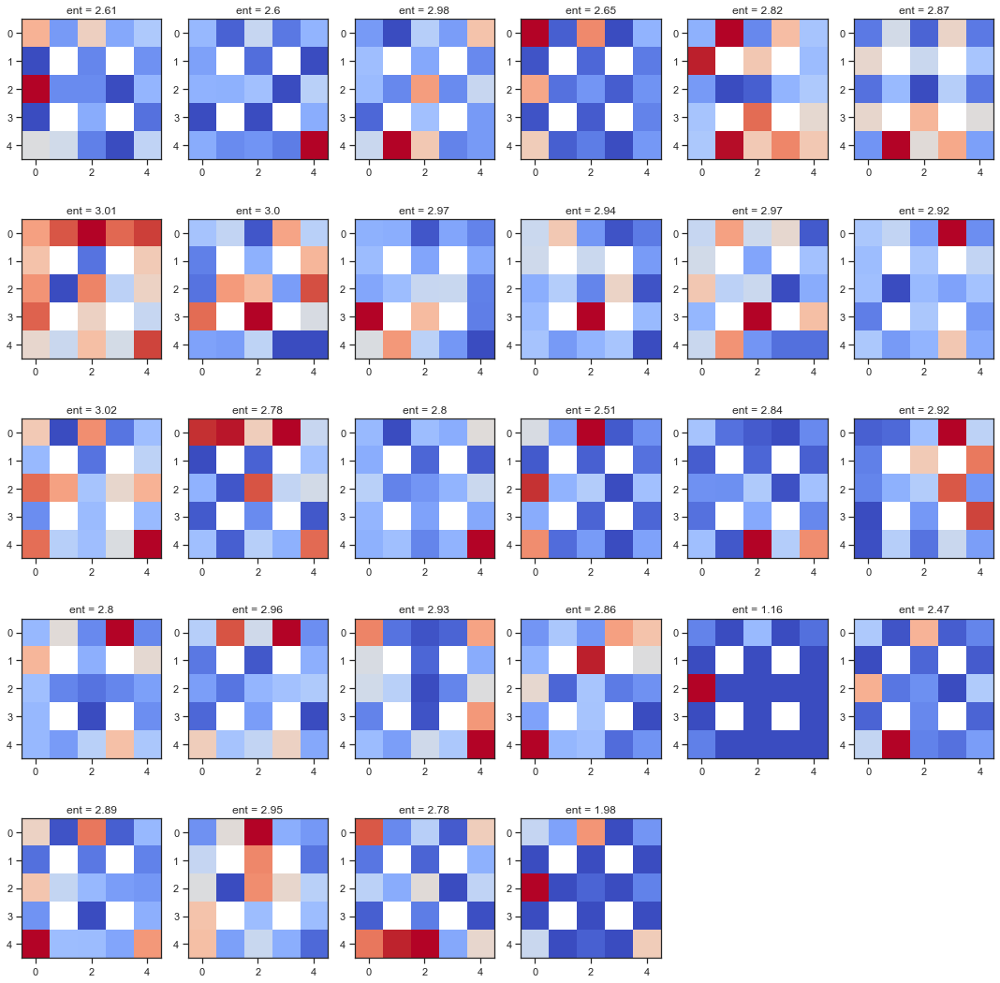

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


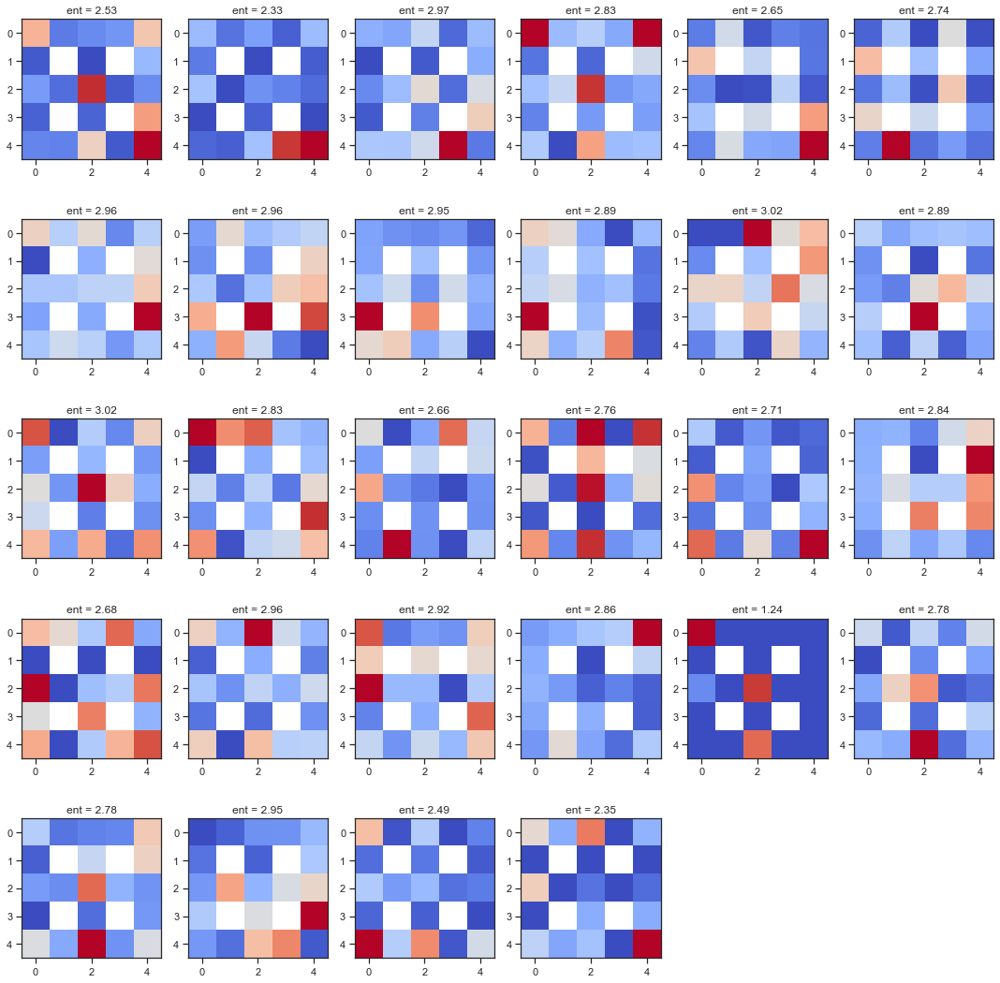

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


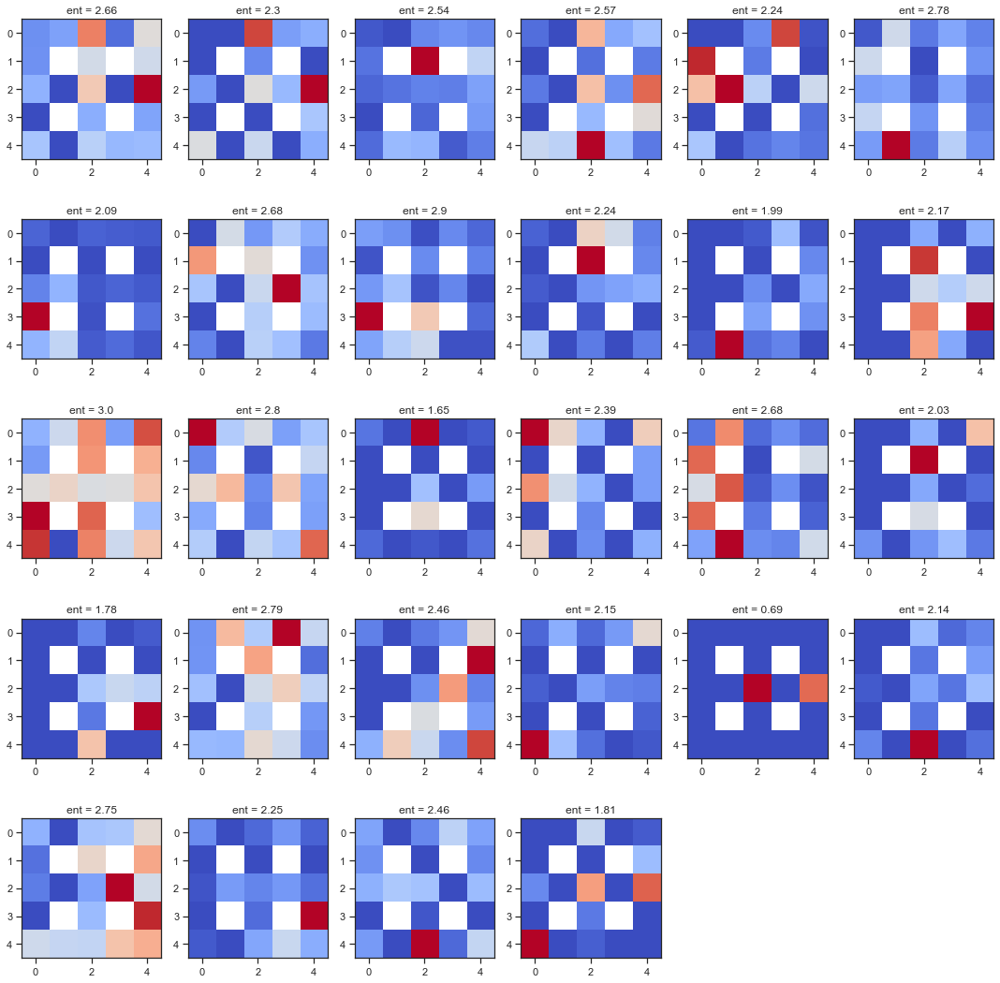

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


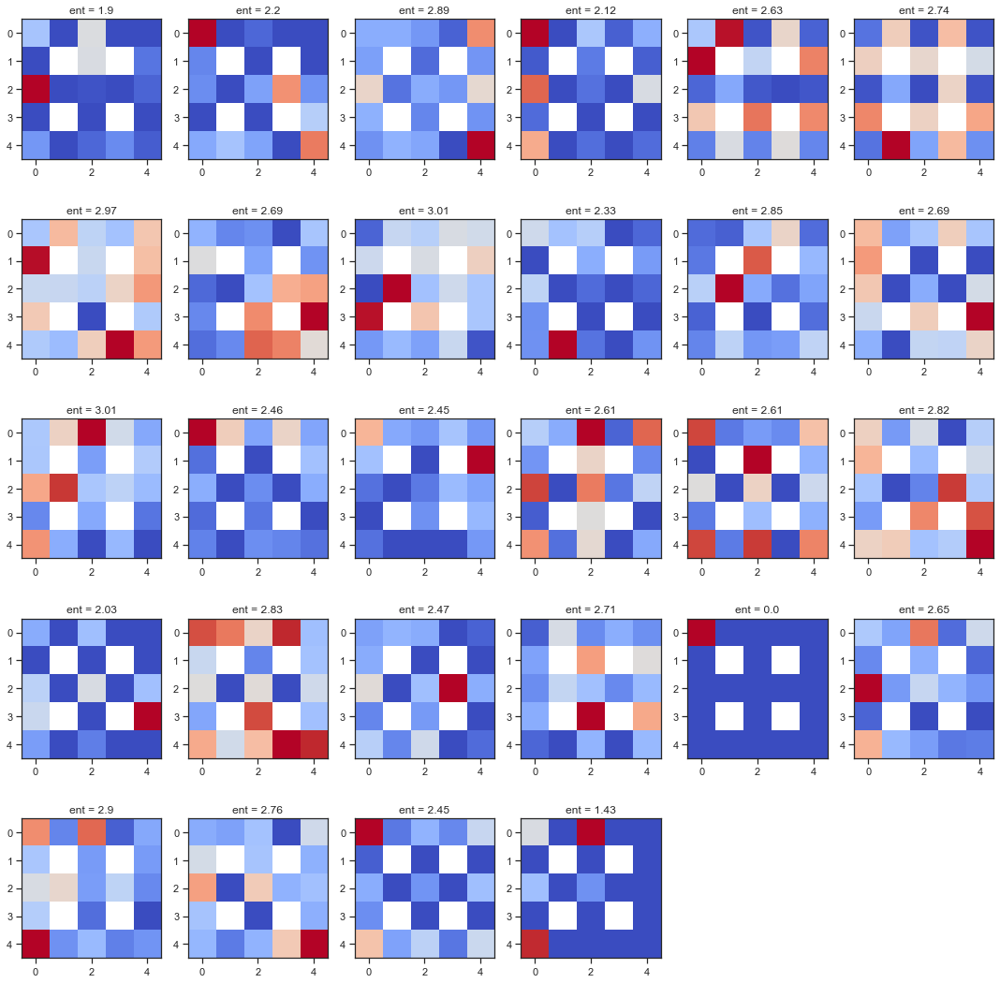

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


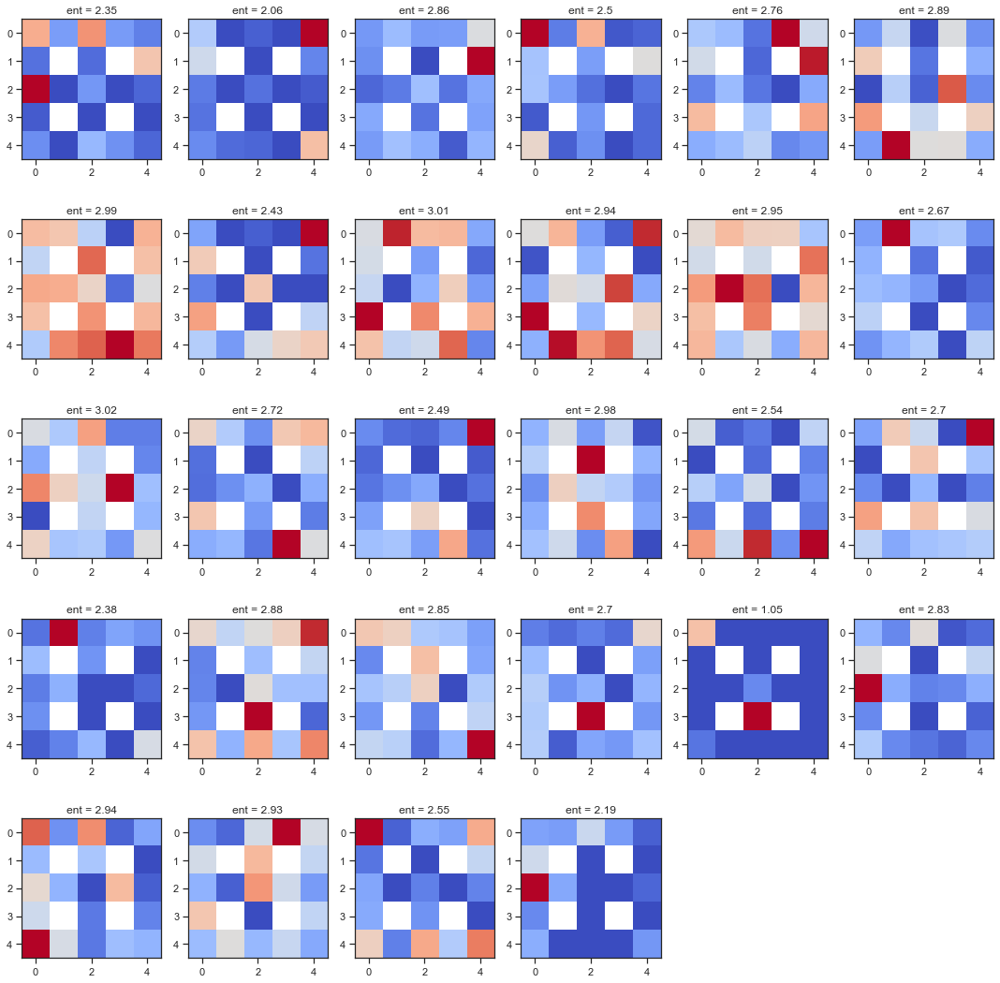

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


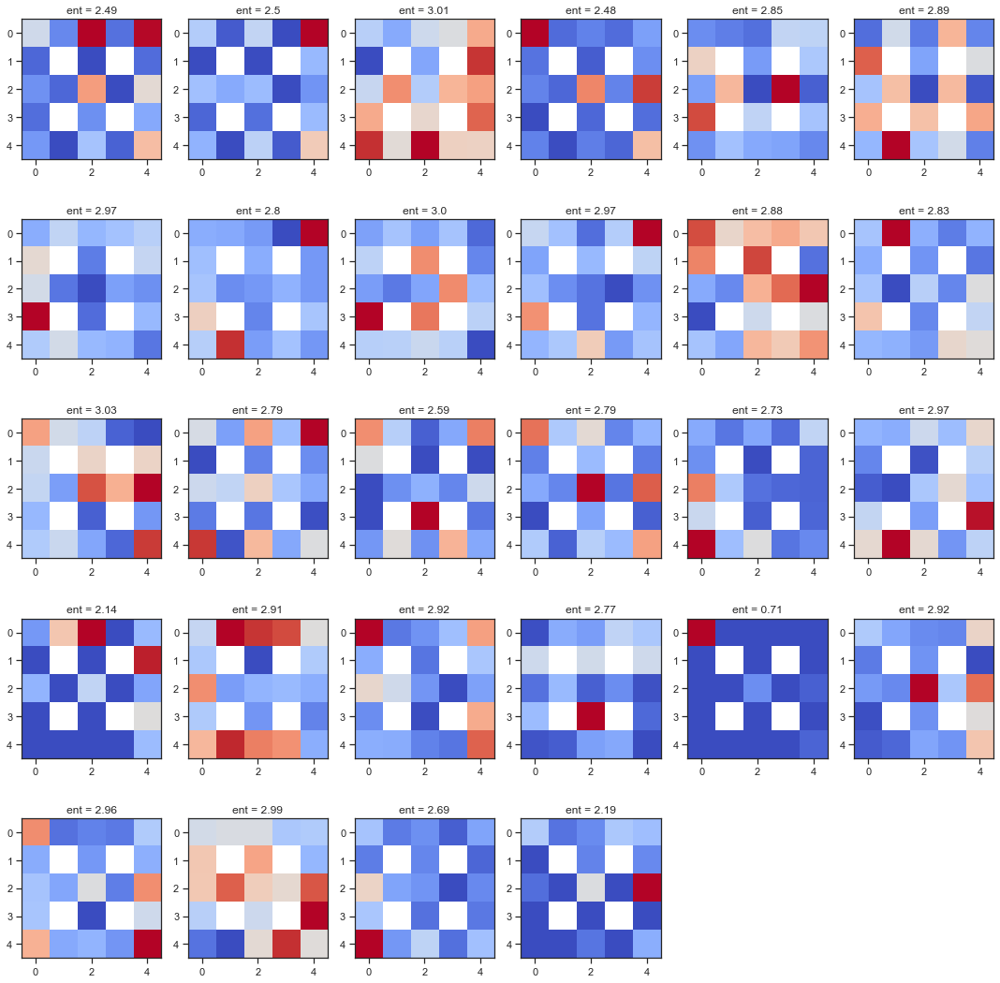

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


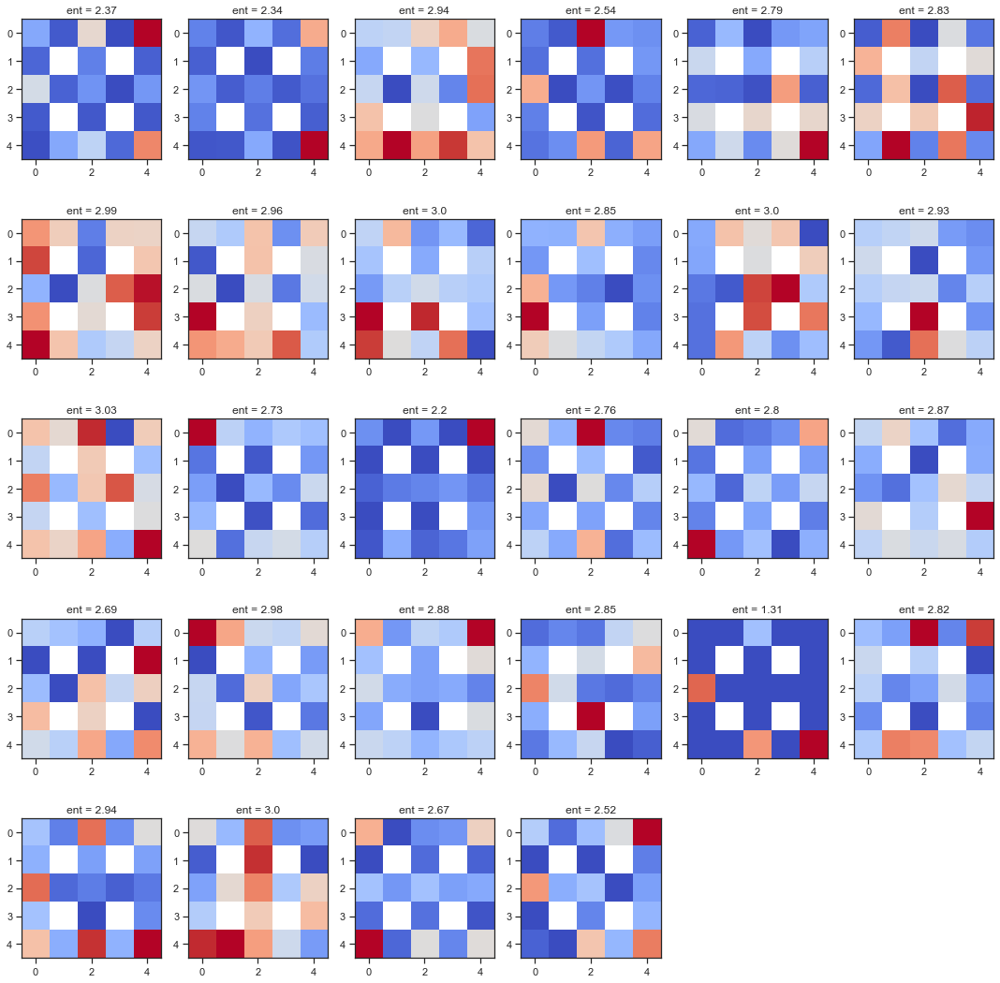

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


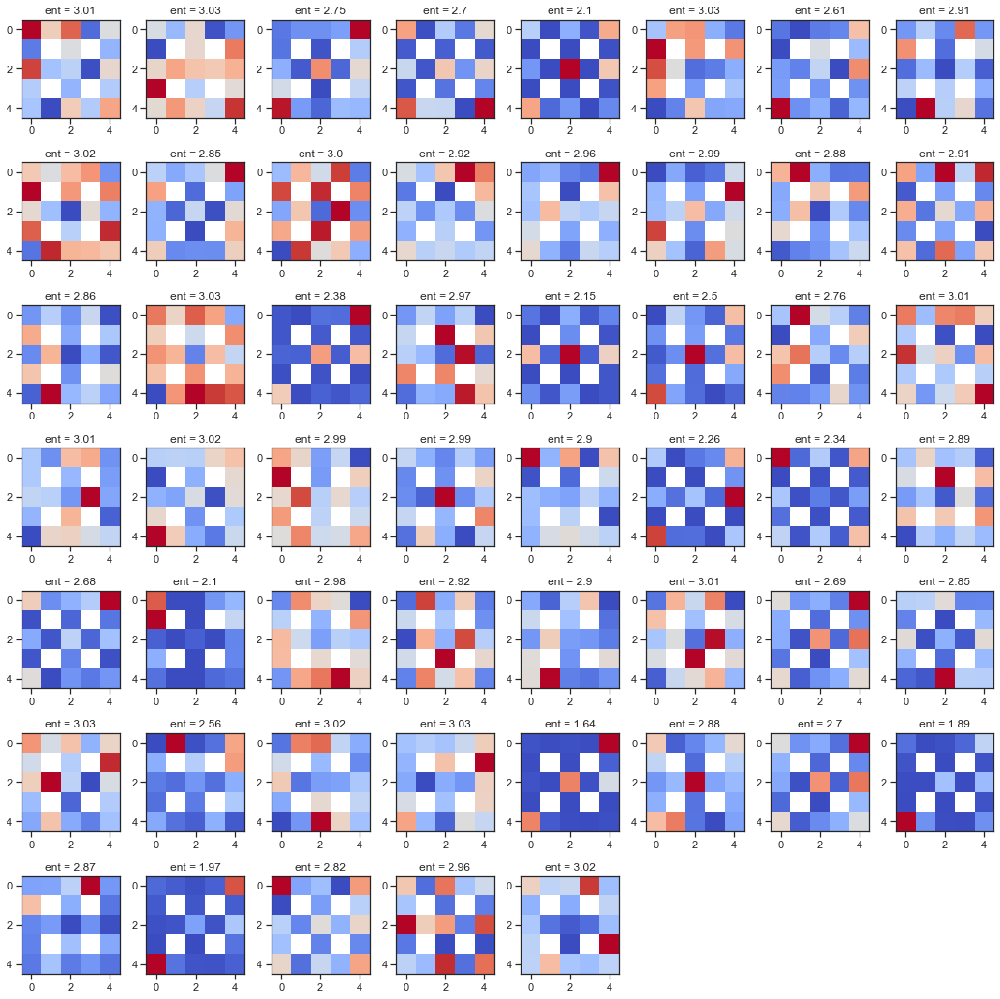

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


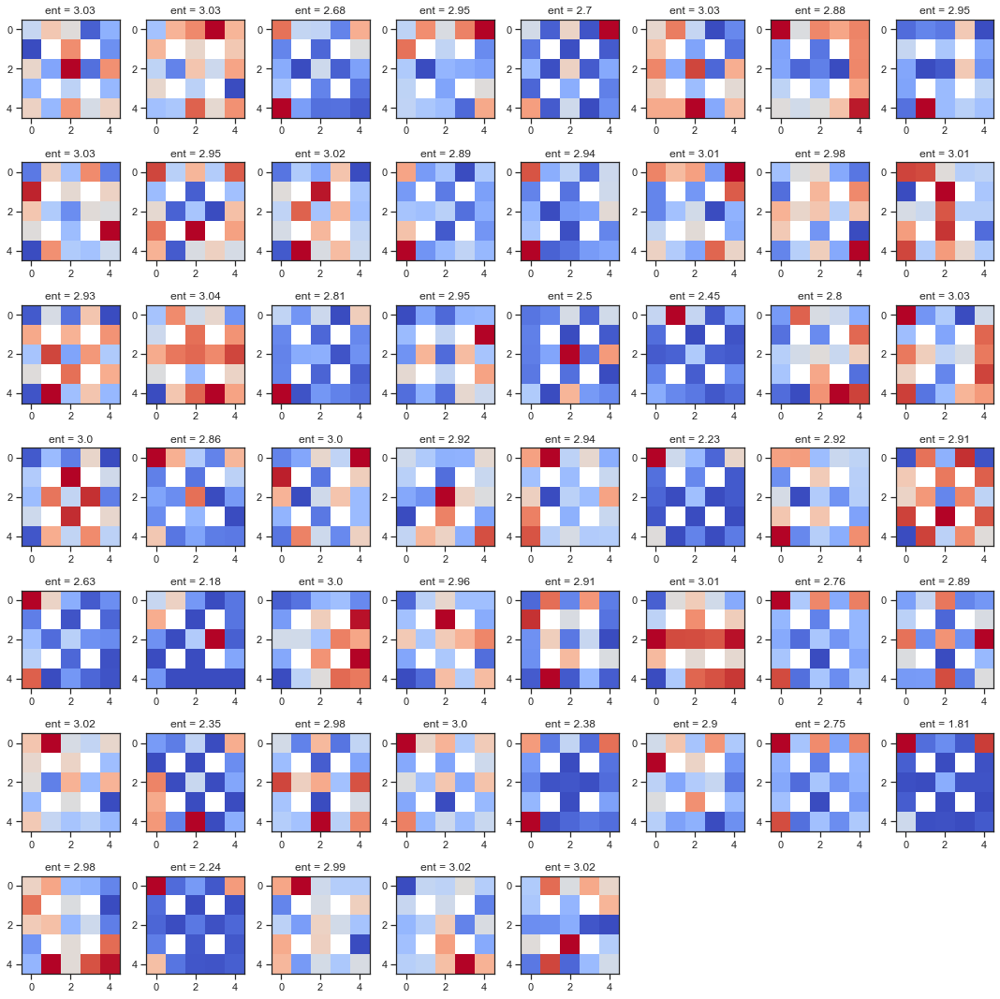

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


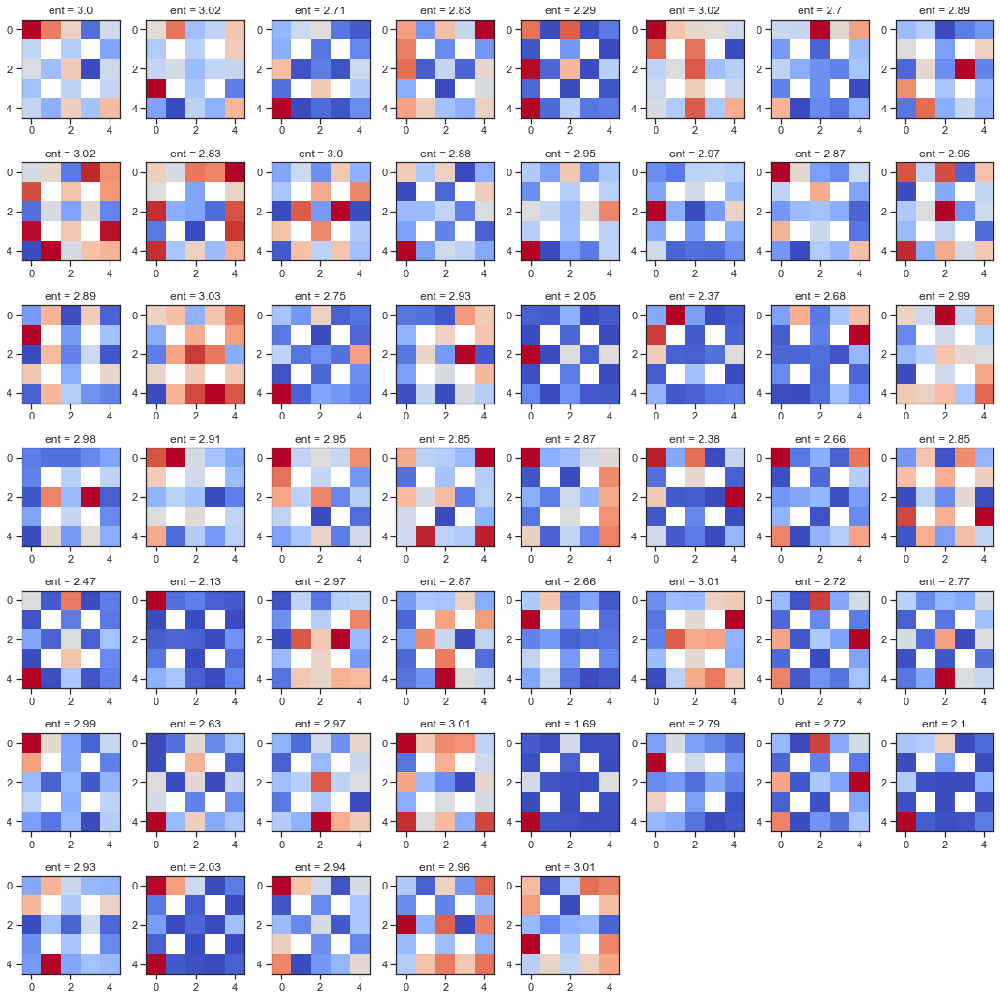

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


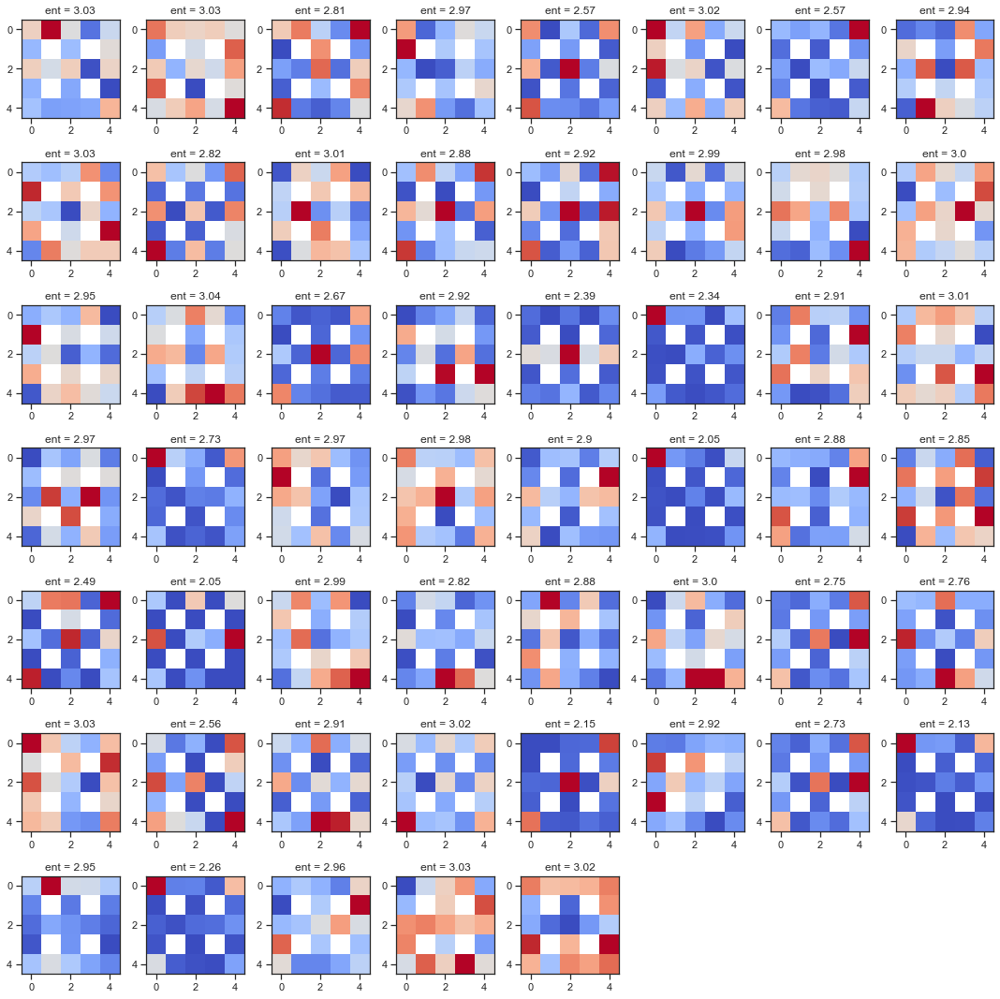

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


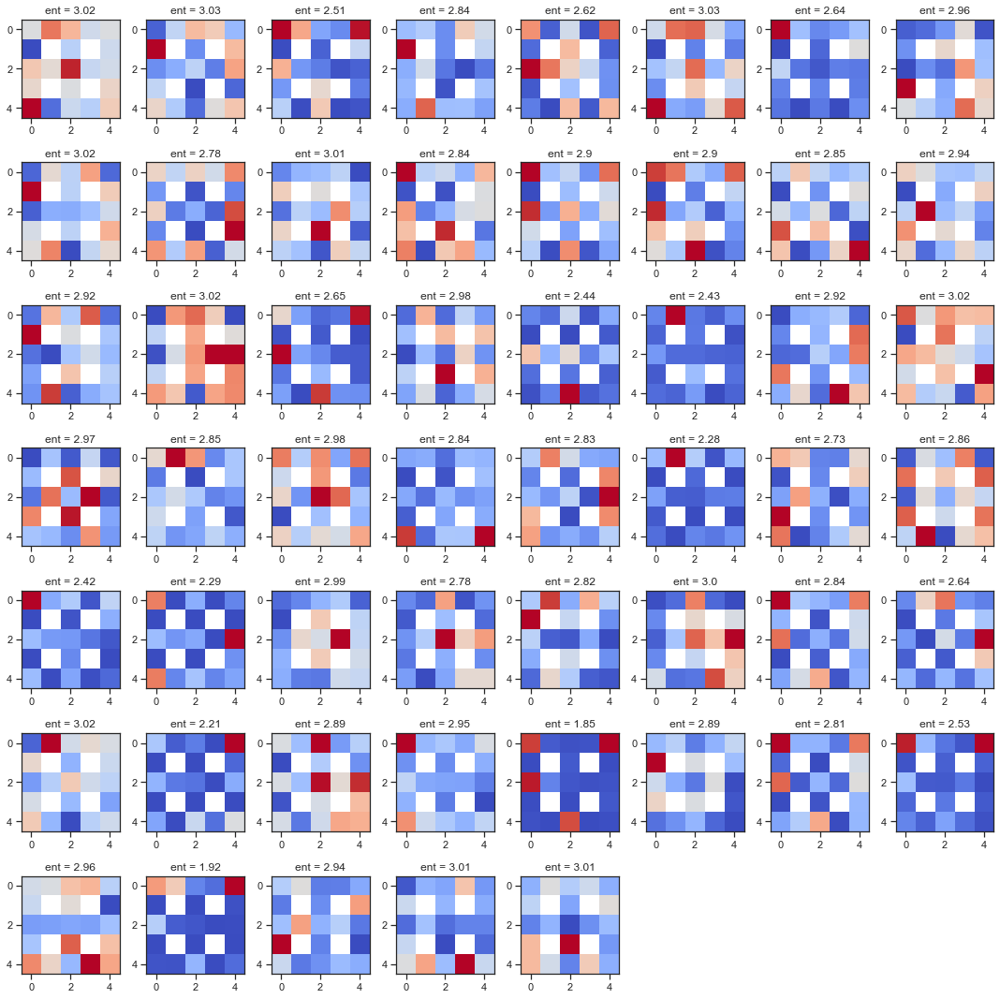

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


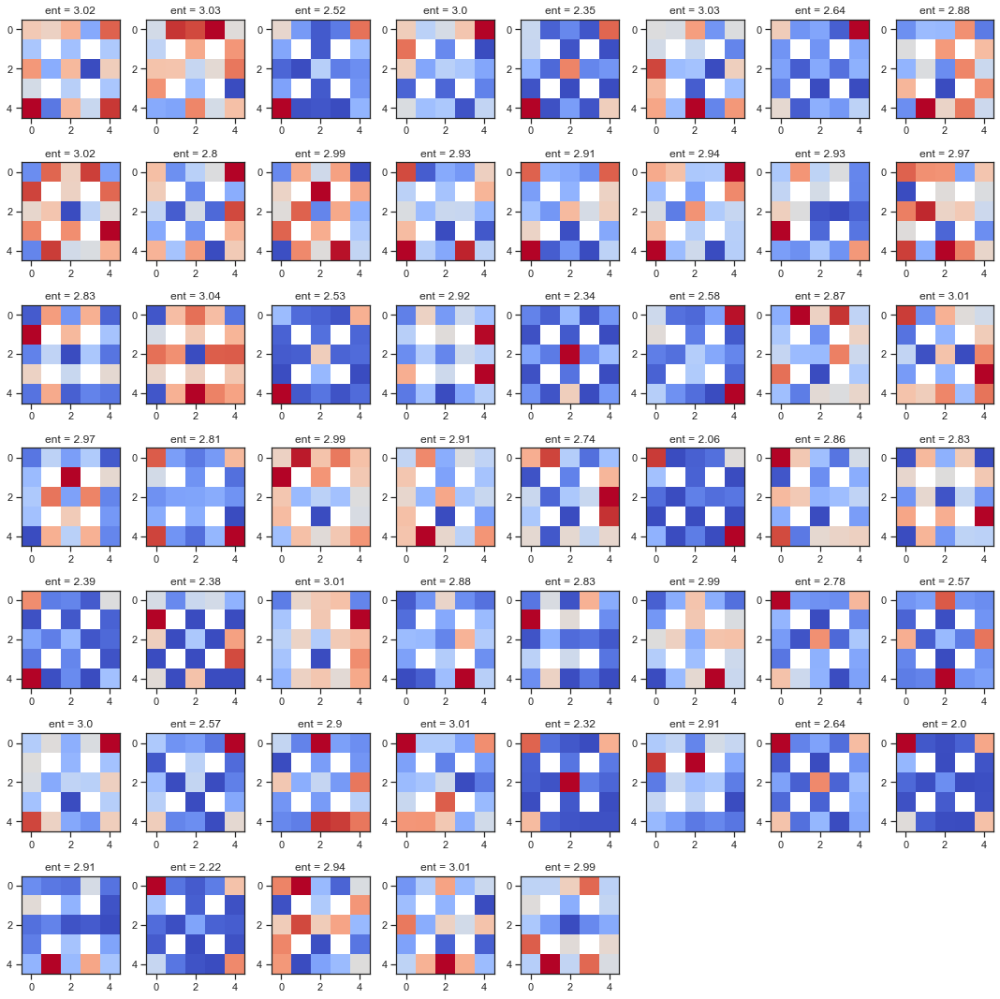

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


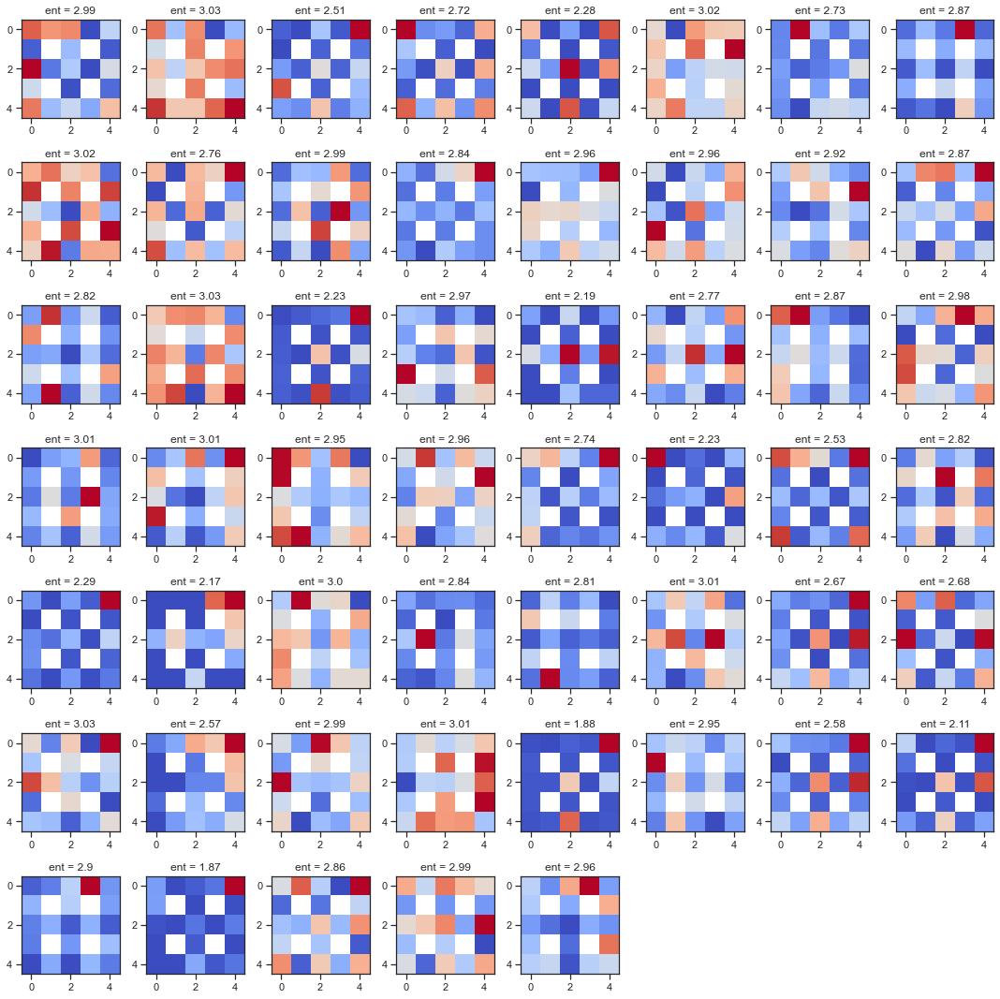

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


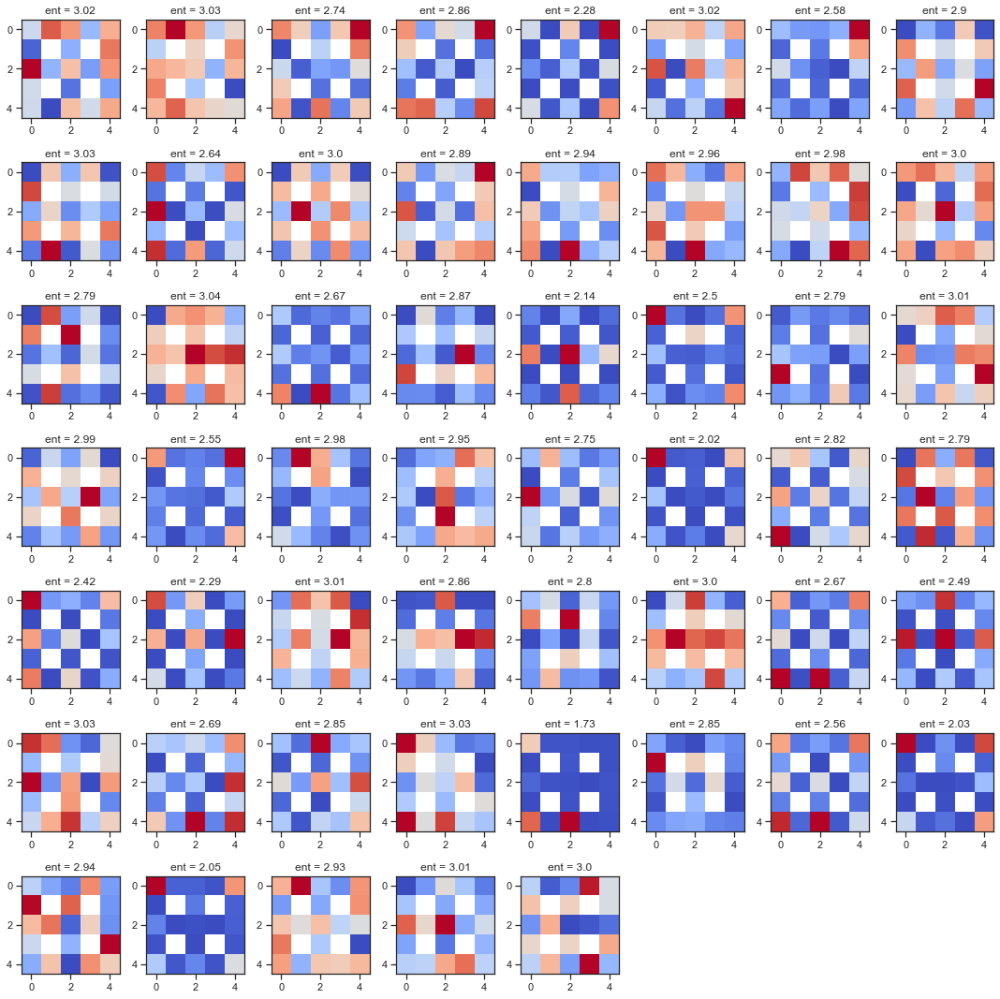

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


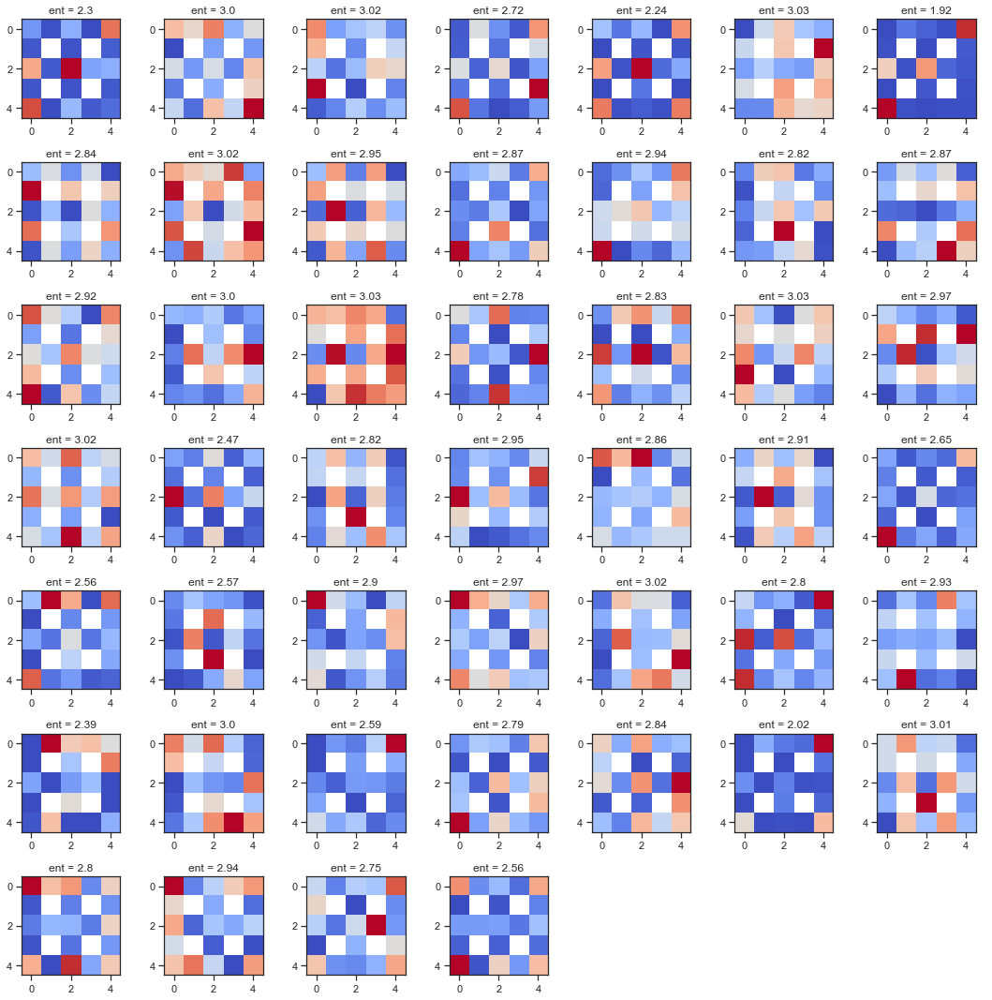

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


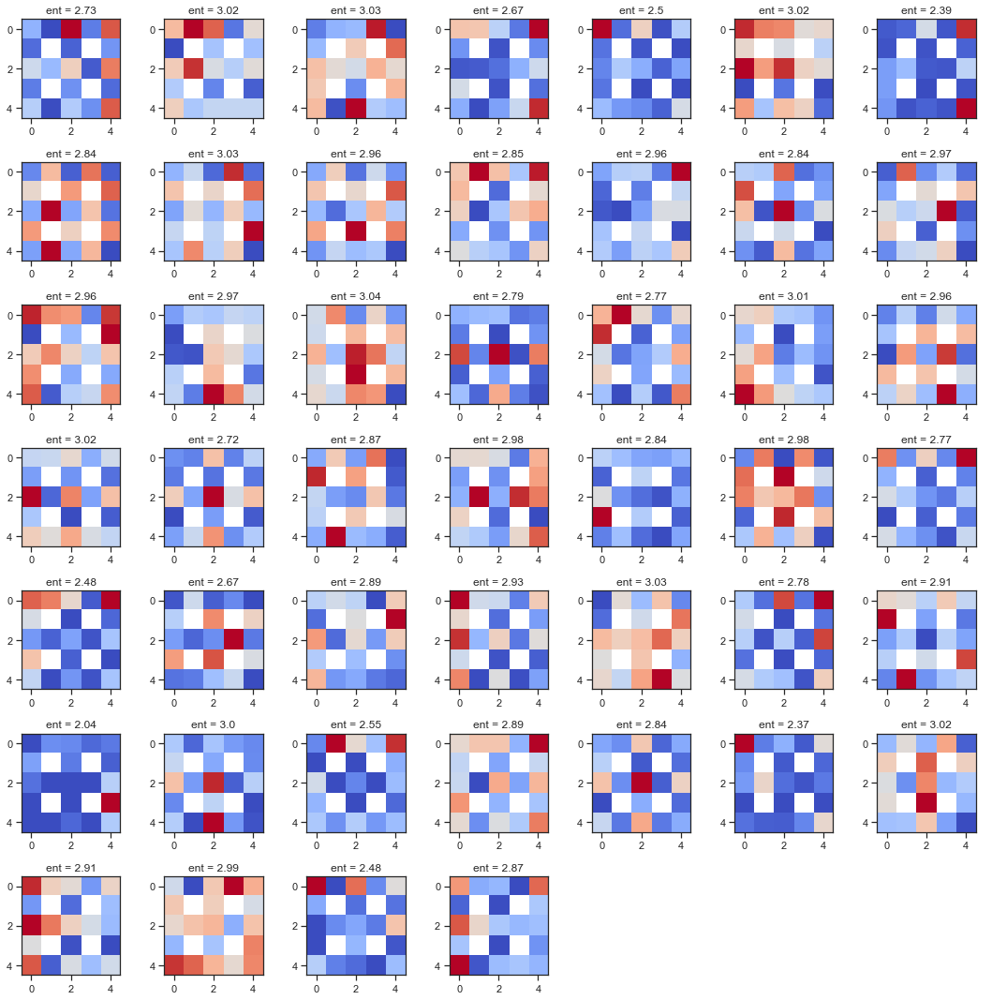

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


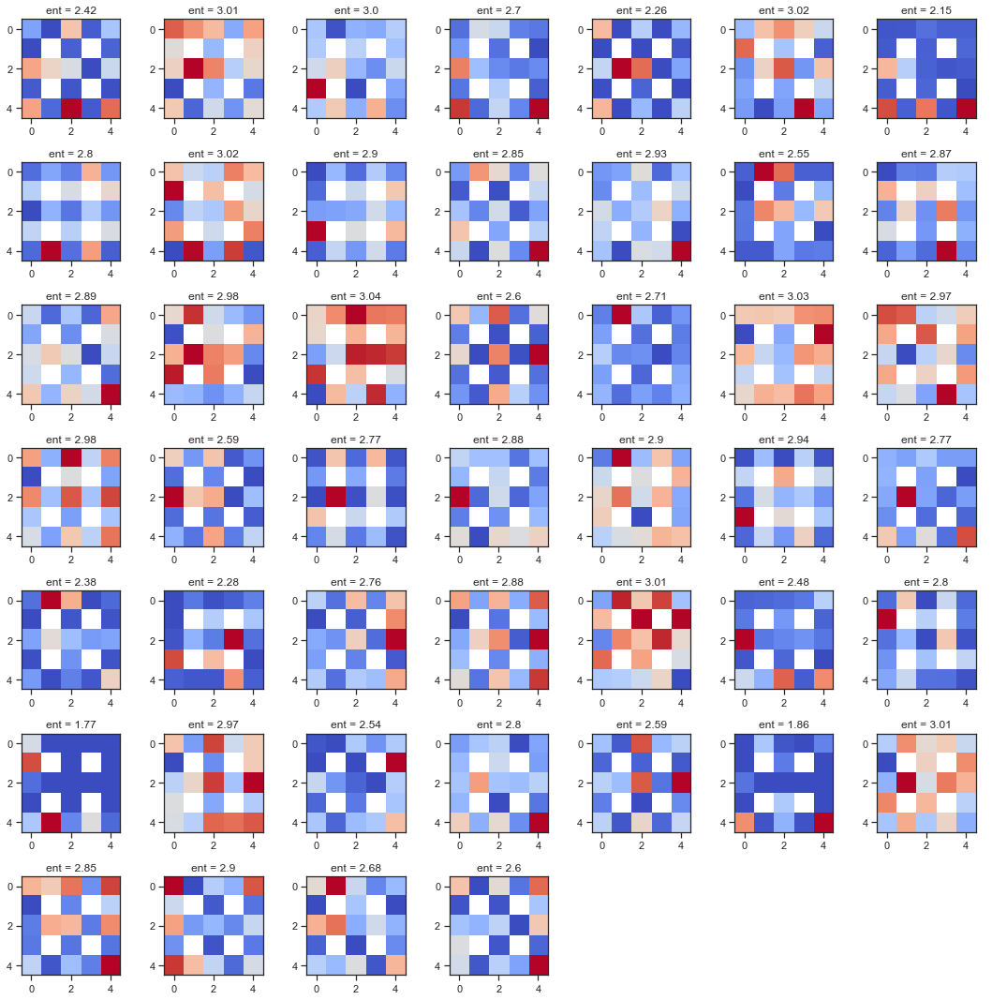

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


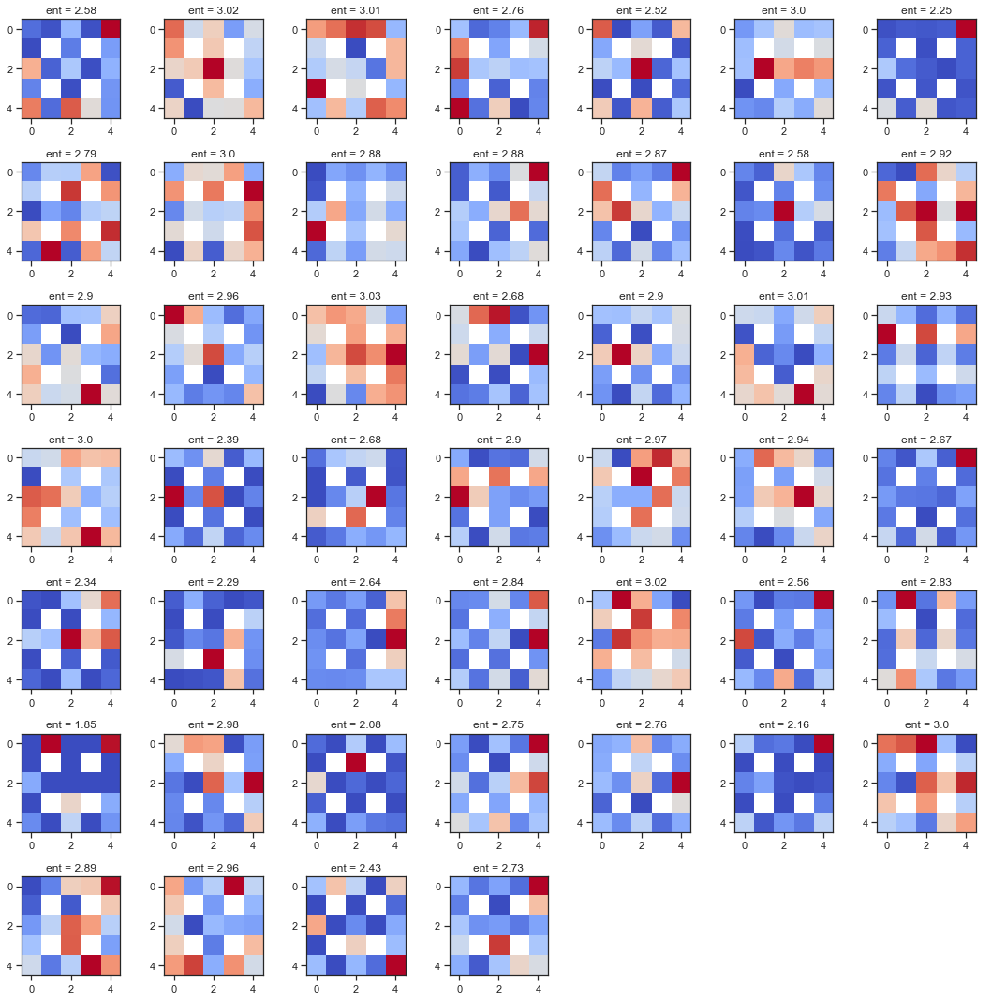

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


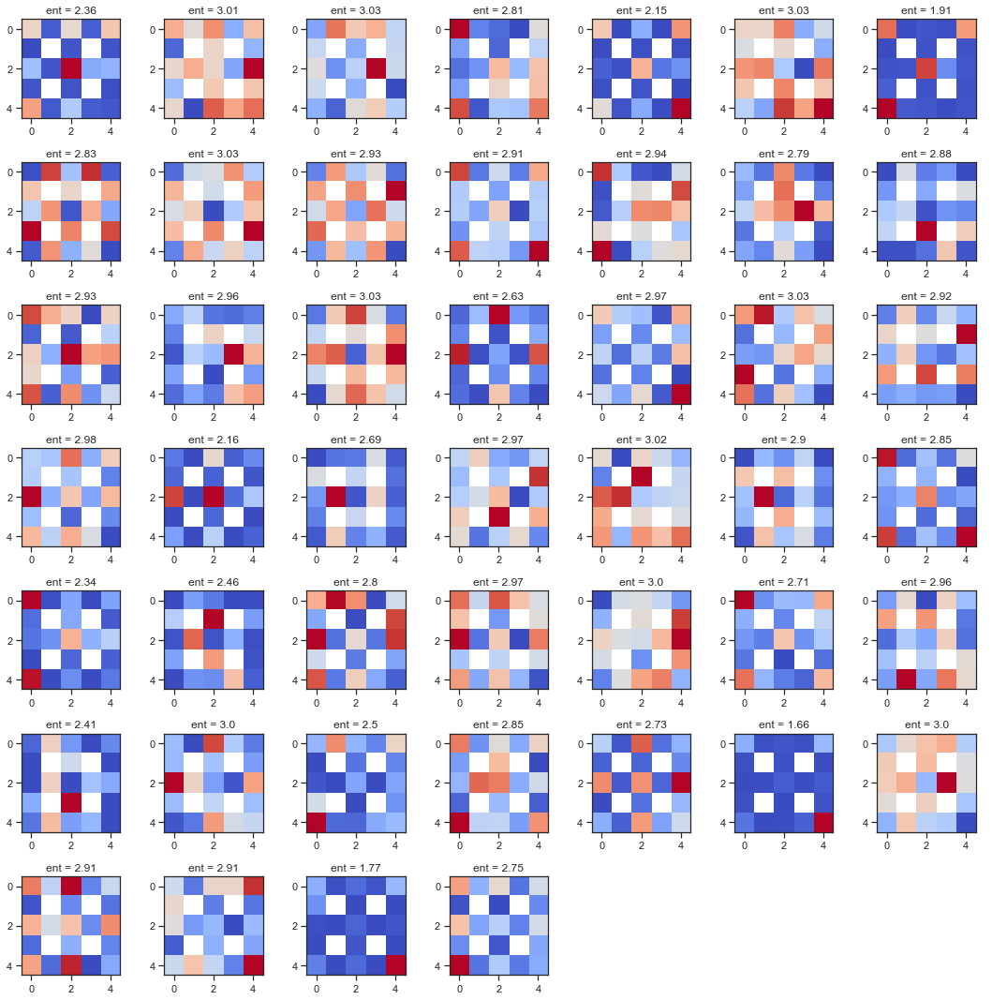

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


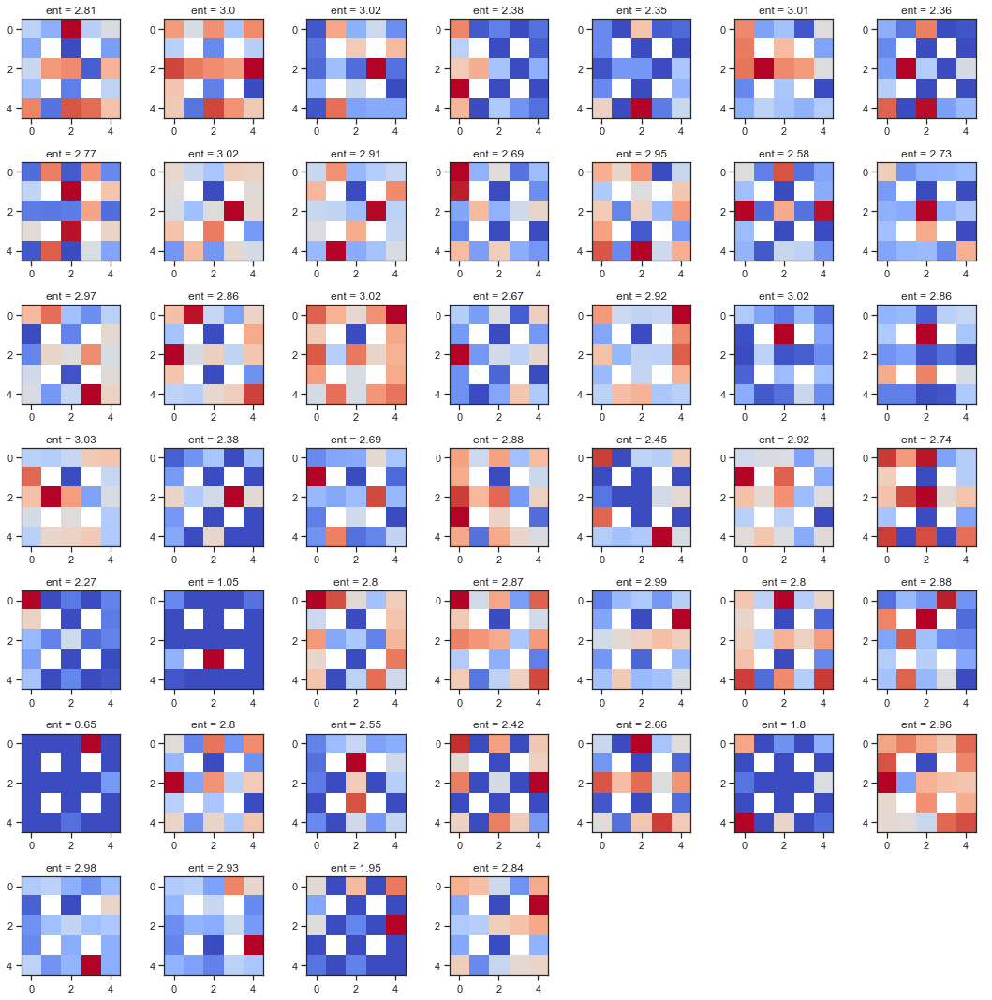

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


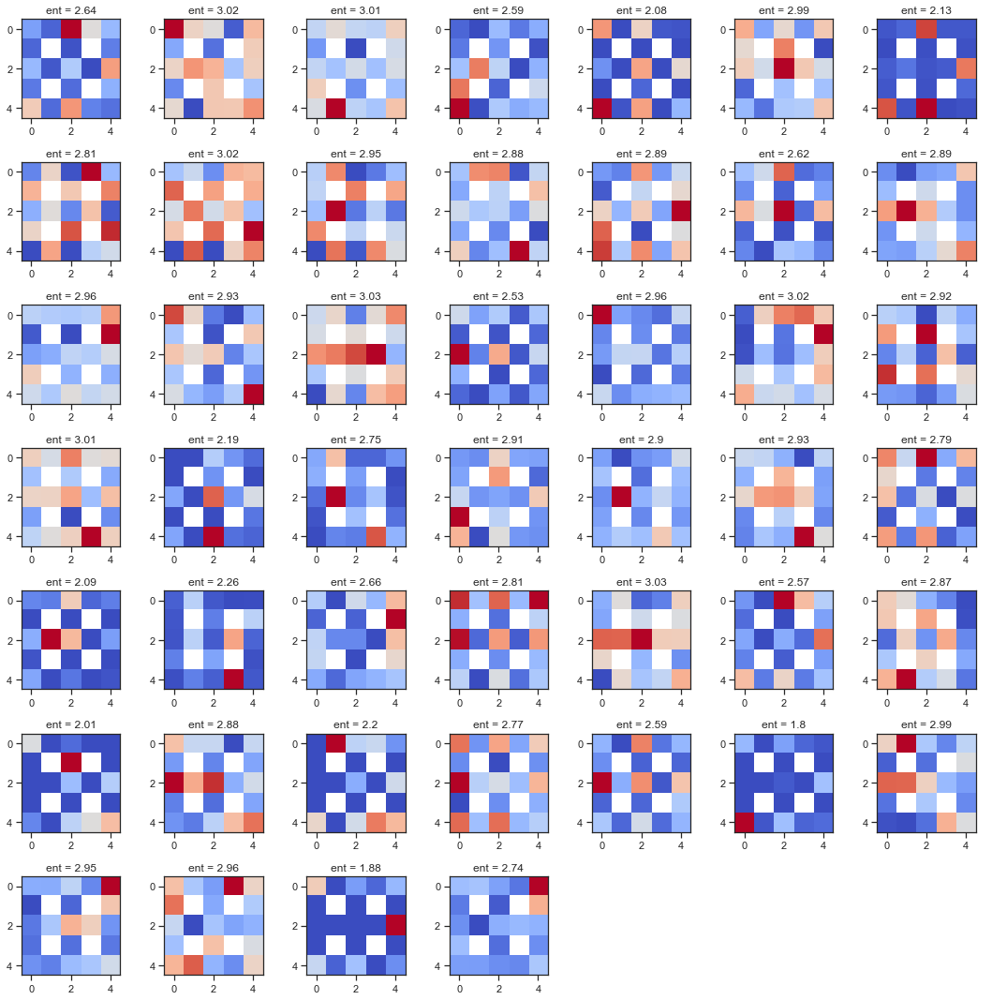

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


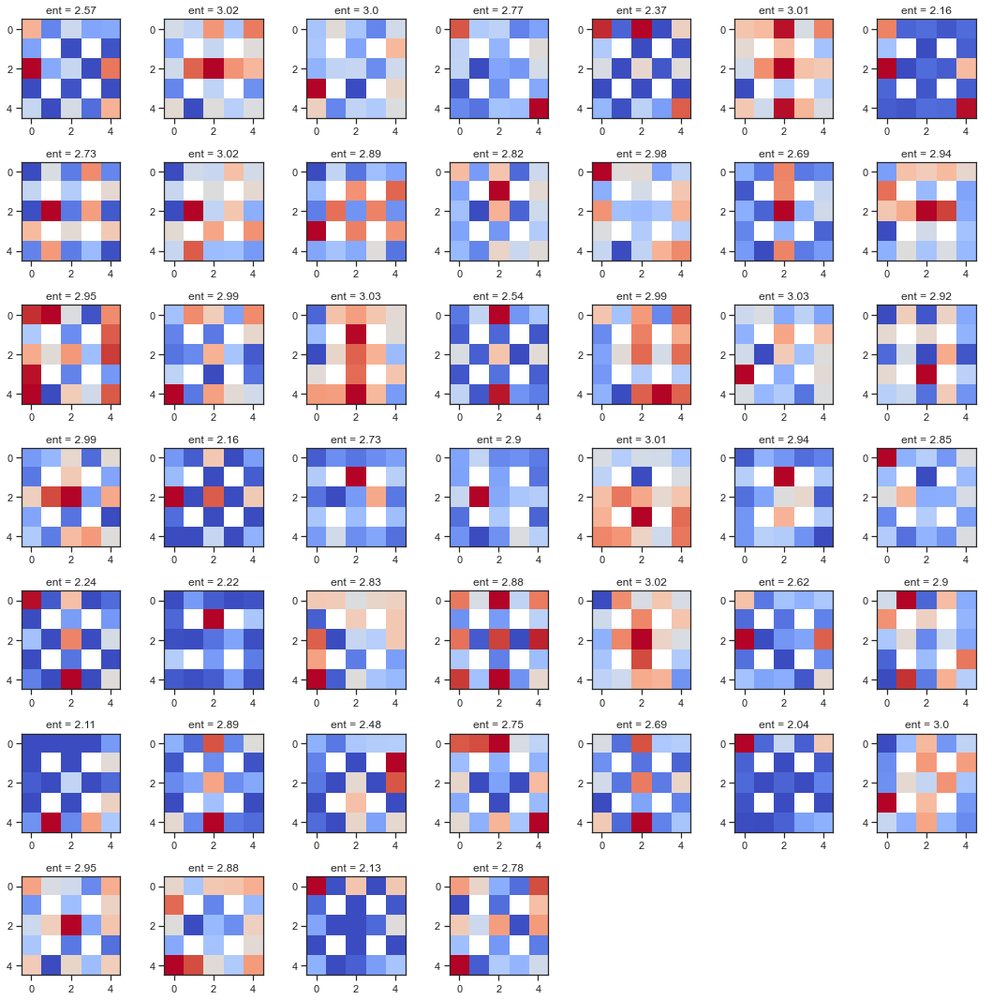

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


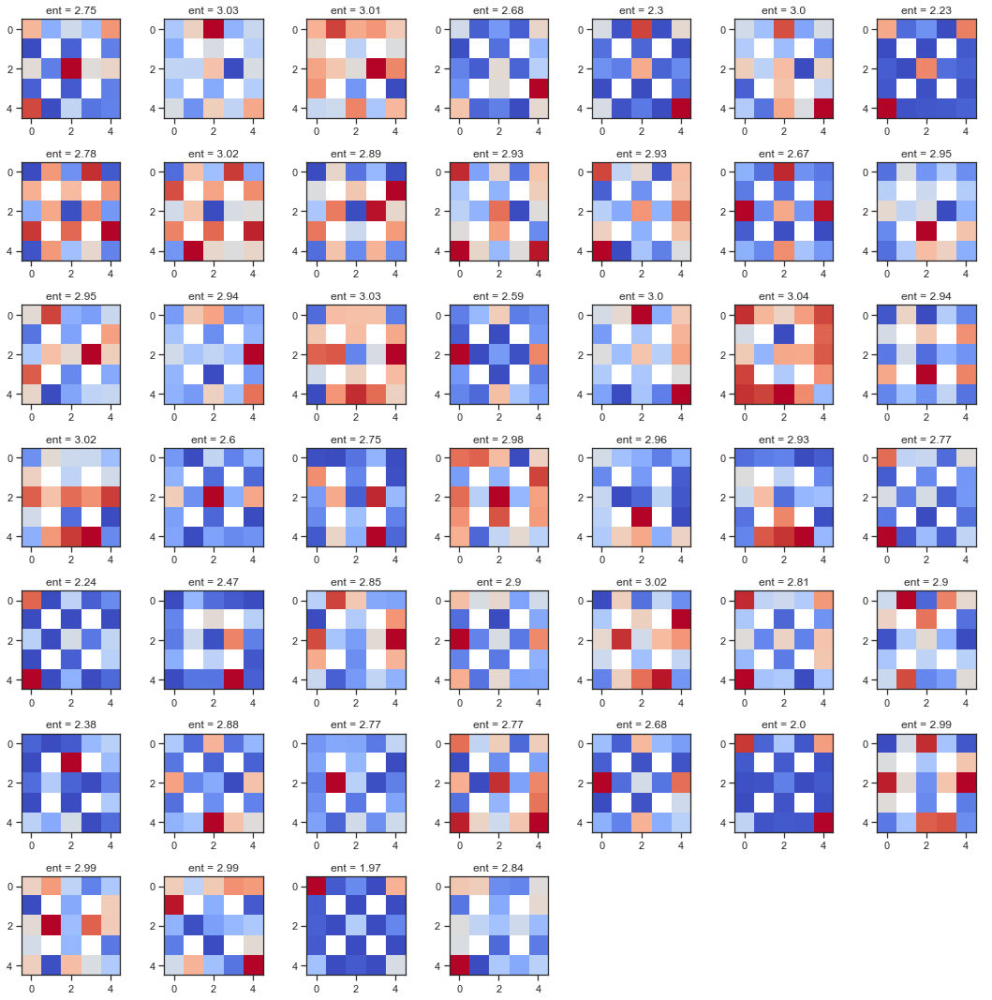

In [1182]:
for mouse_recday in Recording_days:
    sessions, Tasks = get_sessions(mouse_recday)

    for counter, session in enumerate(sessions):

        task = Tasks[session]
        Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
        Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')
        Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
        data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')

        num_neurons, num_trials = Neuron_raw.shape[0], Neuron_raw.shape[1]
        # Calculate the number of rows and columns for the subplot grid
        num_plots = num_neurons
        num_cols = int(np.ceil(np.sqrt(num_plots)))
        num_rows = int(np.ceil(num_plots / num_cols))

        # Create a subplot grid
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

        # Flatten the axes array if necessary (depends on the number of rows and columns)
        axes = np.array(axes).flatten()

        # Plot each heatmap
        for neuron, ax in enumerate(axes[:num_plots]):
            pmap = place_map(Neuron_raw[neuron,:], Location_raw, maze_mat, loc_mapping_for_plot) 
            ax.imshow(pmap, cmap='coolwarm', interpolation='nearest')
            entropy = st.entropy(pmap.flatten()[~np.isnan(pmap.flatten())])
            ax.set_title(f'ent = {round(entropy, 2)}')

        # Hide any empty subplots
        for j in range(num_plots, len(axes)):
            axes[j].axis('off')
        fig.savefig(f"/Users/AdamHarris/Desktop/NODEVSEDGE/placemaps{mouse_recday}_{session}.pdf")
        plt.tight_layout()
        plt.show()


In [10]:
mouse_recday

'ah04_05122021_06122021'

In [11]:
Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')
Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')

In [12]:
Location_raw

array([9., 9., 9., ..., 9., 9., 9.])

In [13]:
subsetting = f'/Users/AdamHarris/Documents/PFC Subspaces/Data/Phase_state_place_anchored_{mouse_recday}.npy'
subsetting_array = np.load(subsetting)

spatial_cells = subsetting_array[:,2]
phase_cells = subsetting_array[:,0]
nophase_cells = ~phase_cells
nophase_state=np.logical_and(spatial_cells==True, phase_cells==False )

In [14]:
subsetting_array[:,2]

array([ True,  True,  True,  True, False,  True,  True, False,  True,
       False, False,  True, False,  True,  True,  True, False,  True,
        True,  True,  True, False, False,  True, False,  True,  True,
        True,  True, False,  True,  True,  True,  True, False, False,
       False,  True,  True,  True, False,  True,  True,  True, False,
        True,  True, False, False,  True,  True, False, False,  True,
        True,  True, False,  True, False, False,  True,  True, False,
       False, False,  True, False, False,  True,  True, False,  True,
       False,  True,  True,  True,  True, False,  True,  True,  True,
       False,  True,  True,  True,  True,  True, False,  True,  True,
        True, False,  True, False, False,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True])

In [15]:
Location_raw

array([9., 9., 9., ..., 9., 9., 9.])

In [16]:

# def get_lagged_location(locations, phases, num_lags=12, max_node=9):
    
#     cum_phases, progress = cumulative_phase(phases)
    
#     lagged_locations_mat = np.zeros((num_lags, len(locations)))
    
#     for i, loc in enumerate(locations):
#         current_phase = cum_phases[i]
#         current_progress = progress[i]
#         for lag in range(num_lags):
#             if lag==0:
#                 lagged_locations_mat[lag, i]=loc
                
#             elif current_phase-lag < 0:
#                 pass
                
#             else:
#                 lagged_phase = current_phase-lag
#                 mask_ = np.array(cum_phases)==lagged_phase
#                 lagged_progress_arr = np.array(progress[mask_])
#                 lagged_locs = locations[mask_]
#                 lagged_progress_guess = closest_match(current_progress, lagged_progress_arr)
                

#                 lagged_location = lagged_locs[lagged_progress_arr==lagged_progress_guess]
#                 if lagged_location>max_node:
#                     lagged_location=0
#                 lagged_locations_mat[lag, i]=lagged_location

#     return lagged_locations_mat 

# def cumulative_phase(arr):
#     result = []
#     current_value = arr[0]
#     increment = 0
    
#     for num in arr:
#         if num == 2:
#             increment += 1
#             current_value = increment
#         else:
#             current_value = num + increment

#         result.append(current_value)
    
#     instance = 0
#     current_val=0
#     progress = []
    
#     for num in result:

#         if current_val == num:
#             instance += 1
#         else:
#             current_val=num
#             instance=1
        
#         frames_in_phase = np.sum(np.array(result)==num)
#         progress_through_phase =instance/frames_in_phase 
#         progress.append(progress_through_phase)
        
#     return result, np.array(progress)

In [220]:
Recording_days

array(['ah03_18082021_19082021', 'ah04_01122021_02122021',
       'ah04_05122021_06122021', 'ah04_09122021_10122021',
       'me08_10092021_11092021', 'me10_09122021_10122021',
       'me11_01122021_02122021', 'me11_05122021_06122021'], dtype='<U22')

In [311]:
maze_pallet = sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True)

In [1139]:
def cumulative_phase(arr):
    result = []
    current_value = 0
    #increment = 0
    
    for x, num in enumerate(arr):
        if x == 0:
            pass
        else:
            if num != arr[x-1]:
                current_value +=1
                #current_value += increment

        result.append(current_value)
    
    instance = 0
    current_val=0
    progress = []
    
    for num in result:

        if current_val == num:
            instance += 1
        else:
            current_val=num
            instance=1
        
        frames_in_phase = np.sum(np.array(result)==num)
        progress_through_phase =instance/frames_in_phase 
        progress.append(progress_through_phase)
        
    return result, np.array(progress)


def closest_match(input_float, float_array):
    closest_value = min(float_array, key=lambda x: abs(x - input_float))
    return closest_value


# def get_lagged_location(locations, phases, num_lags=12, max_node=9):
    
#     cum_phases, progress = cumulative_phase(phases)
    
#     lagged_locations_mat = np.zeros((num_lags, len(locations)))
    
#     for i, loc in enumerate(locations):
#         current_phase = cum_phases[i]
#         current_progress = progress[i]
#         for lag in range(num_lags):
#             if lag==0:
#                 lagged_locations_mat[lag, i]=loc
                
#             elif current_phase-lag < 0:
#                 pass
                
#             else:
#                 lagged_phase = current_phase-lag
#                 mask_ = np.array(cum_phases)==lagged_phase
#                 lagged_progress_arr = np.array(progress[mask_])
#                 lagged_locs = locations[mask_]
#                 lagged_progress_guess = closest_match(current_progress, lagged_progress_arr)
                

#                 lagged_location = lagged_locs[lagged_progress_arr==lagged_progress_guess]
#                 if lagged_location>max_node:
#                     lagged_location=0
#                 lagged_locations_mat[lag, i]=lagged_location

#     return lagged_locations_mat 


def get_lagged_location(locations, phases, num_lags=12, max_node=9):
    
    cum_phases, progress = cumulative_phase(phases)
    
    lagged_locations_mat = np.zeros((num_lags, len(locations)))
    
    for i, loc in enumerate(locations):
        current_phase = cum_phases[i]
        current_progress = progress[i]
        for lag in range(num_lags):
            if lag==0:
                lagged_locations_mat[lag, i]=loc
                
            elif current_phase-lag < 0:
                pass
                
            else:
                lagged_phase = current_phase-lag
                mask_ = np.array(cum_phases)==lagged_phase
                lagged_progress_arr = np.array(progress[mask_])
                lagged_locs = locations[mask_]
                lagged_progress_guess = closest_match(current_progress, lagged_progress_arr)
                

                lagged_location = lagged_locs[lagged_progress_arr==lagged_progress_guess]
                if lagged_location>max_node:
                    lagged_location=0
                lagged_locations_mat[lag, i]=lagged_location

    return lagged_locations_mat 

def downsample_data(data, original_frequency, target_frequency):
    # Calculate the ratio between original and target frequencies
    resample_ratio = target_frequency / original_frequency

    # Determine the number of samples in the downsampled data
    num_samples_downsampled = int(len(data) * resample_ratio)

    # Use scipy.signal.resample to perform downsampling
    downsampled_data = resample(data, num_samples_downsampled, axis=0)

    return downsampled_data

def find_pref_phases(data_neurons, phase_bins):

    """
    Parameters:
    - data_neurons: 360 bin normalised firing rate array for neuron 
                    OR
                    
    - phase_bins: number of partitions per state 
    
    Returns:
    - pref_phases: list of ints between 0:n-1 of phase bin with highes norm firing rate for that neuron
    
    """
    
    if len(data_neurons.shape)==3:
    
        pref_phases = []

        for neuron, array in enumerate(data_neurons):
            dneuron = data_neurons[neuron,:,:]

            # 1) Mean across n to get a 1x360 array
            step1_result = np.mean(dneuron, axis=0)

            # 2) Reshape it to 4x90 to aollapse across states
            step2_result = step1_result.reshape(4, 90)

            # 3) Mean across n to get a 1x90 array 
            step3_result = np.mean(step2_result, axis=0)

            # 4) Resample it into m bins (m=phase_bins)
            # step4_result = np.histogram(step3_result, bins=phase_bins)[0]
            step4_result = downsample_data(step3_result, 90, phase_bins)

            # 5)pref_phasesReturn the index of the bin with the maximum value
            pref_phase = np.argmax(step4_result)


            pref_phases.append(pref_phase)
            
#     elif len(data_neurons.shape)==2:
#         # for neuron array 
        
    else:
        raise Exception("dims error: array must have 2 or 3 dimensions")
        
    return pref_phases
def removeDuplicates(nums: list) -> int:
    nums = [x for i, x in enumerate(nums) if nums[i-2]!= x]
    print(nums)
    k = len(nums)
    return k

def stack_arrays_vertically(array_list):
    """
    Stack a list of numpy arrays vertically.

    Parameters:
    - array_list (list of numpy arrays): List of numpy arrays to be stacked.

    Returns:
    - stacked_array (numpy array): Vertically stacked numpy array.
    """
    try:
        stacked_array = np.vstack(array_list)
        return stacked_array
    except ValueError as e:
        print(f"Error: {e}")
        return None


In [1140]:
xxx=np.array([0,1,2,3,4,5,6,7,8])
xxx=np.tile(xxx,10)
yyy = np.repeat(np.array([0,1,2]), 30)
# yyy = np.tile(yyy, 10)

lg = get_lagged_location(xxx, yyy)


In [1141]:
lg

array([[0., 1., 2., ..., 6., 7., 8.],
       [0., 0., 0., ..., 3., 4., 5.],
       [0., 0., 0., ..., 0., 1., 2.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [1142]:
print(xxx)
print(yyy)

[0 1 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8 0
 1 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8 0 1
 2 3 4 5 6 7 8 0 1 2 3 4 5 6 7 8]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


In [1143]:
for i in range(90):
    print(lg[:,i])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[7. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[8. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[7. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[8. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[7. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[8. 0. 0. 0.

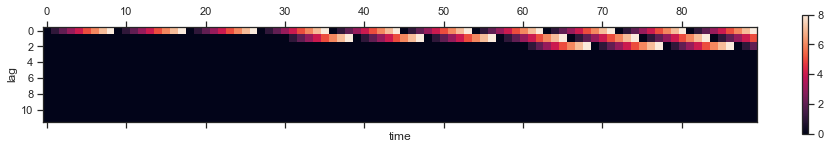

In [1144]:

plt.matshow(lg)
plt.xlabel('time')
plt.ylabel('lag')
plt.colorbar()

In [1145]:


# # Example usage:
# input_array = [0, 0,0,0,0,0, 1,1,1,1,1,1, 1, 2, 2, 2, 0,0,0, 0, 1,1,1,1, 1,2,2,2,2,0,0,0,1,1,1]
# output_array, x = convert_array(input_array)
# print(output_array)
# print(x)

In [1146]:
# sessions, Tasks = get_sessions(mouse_recday)
phase_partitions = 3
downsample_factor=10
speed_threshold = 5
acceleration_threshold = 0
phase_type = 'time'   #distance or time
conf_group='none'   # speed+ speed-  acceleration+  acceleraion -


betas_1_list = []
betas_2_list = []
pref_phase_all = []

for mouse_recday in Recording_days:

    sessions, Tasks = get_sessions(mouse_recday)
    for counter, session in enumerate(sessions):

        task = Tasks[session]

        Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
        #Neuron_raw = Neuron_raw[subsetting_array[:,2], :]
        Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')

        XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')
        XY_processed = smooth_and_calculate_scalar_derivatives(XY_raw, sigma=5)
        speed = XY_processed[:,2]
        acceleration = XY_processed[:,3]

        Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
        data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')

        # downsample neurons and locations
        Neuron_raw_downsampled=average_over_factor(Neuron_raw, downsample_factor)
        Location_raw_downsampled=sample_every_nth(Location_raw, downsample_factor)
        speed_downsampled = average_over_factor_1d(speed, downsample_factor)
        acceleration_downsampled = average_over_factor_1d(acceleration, downsample_factor)
        #use trial_times to get phase labels
        Trial_times_sr_adj = (Trial_times/25).astype(int)

        pref_phases = find_pref_phases(data_neurons, phase_partitions)

        for trial_num, trial in enumerate(Trial_times_sr_adj):
            for state, _ in enumerate(trial[:-1]):

                state_length = trial[state+1]-trial[state]

                if phase_type=='time':
                    phase_length = math.floor(state_length/phase_partitions)

                    if phase_partitions==3:
                        phase_state = np.hstack((np.repeat(0, phase_length), 
                                                np.repeat(1, phase_length),
                                                np.repeat(2, phase_length)))
                    if phase_partitions ==5:
                        phase_state = np.hstack((np.repeat(0, phase_length), 
                                                np.repeat(1, phase_length),
                                                np.repeat(2, phase_length),
                                                np.repeat(3, phase_length),
                                                np.repeat(4, phase_length)))

                    error=state_length-phase_partitions*phase_length
                    error_add_on = np.repeat(phase_partitions-1, error)
                    phase_state=np.hstack((phase_state, error_add_on))


                if phase_type=='distance':

                    movements_state = speed[trial[state]:trial[state+1]]
                    cumulative_distance = np.cumsum(movements_state)
                    max_distance = cumulative_distance[-1]
                    distance_proportion = cumulative_distance/max_distance
                    phase_dist_ = math.floor(1/phase_partitions)
                    phase_thresholds = np.linspace(0, 1, num=phase_partitions+1, endpoint=True)
                    phase_state = np.digitize(distance_proportion, phase_thresholds, right=True)
                    phase_state = phase_state-1


                if state==0:
                    phase_trial = phase_state
                else:
                    phase_trial = np.hstack((phase_trial, phase_state))

            if trial_num==0:
                phase_session = phase_trial
            else:
                phase_session = np.hstack((phase_session, phase_trial))        

    #             for phase_discrete in range(phase_partitions):
    #                 if phase_discrete+1==phase_partitions:
    #                     phase_arr_[-phase_length:]=phase_discrete #used this to catch any bins left out by rounding errors
    #                 else:
    #                     phase_arr_[phase_discrete*phase_length:phase_discrete+1*phase_length]

    #             if trial_num==0:
    #                 phase_array_full_sess=phase_arr_
    #             else:
    #                 phase_array_full_sess=np.hstack((phase_array_full_sess, phase_arr_))


        Phase_raw_downsampled=sample_every_nth(phase_session, downsample_factor)
        print('_____________________________________')
        print(f'Bin_counts: neurons {Neuron_raw_downsampled.shape[1]}, \n'
                f'loctions {len(Location_raw_downsampled)}, \n'
                f'phases {len(Phase_raw_downsampled)}')

        min_ind = min(Neuron_raw_downsampled.shape[1], 
                      len(Location_raw_downsampled), 
                      len(Phase_raw_downsampled),
                      len(speed_downsampled),
                      len(acceleration_downsampled))


        Neuron_raw_downsampled = Neuron_raw_downsampled[:,:min_ind]
        Location_raw_downsampled = Location_raw_downsampled[:min_ind]
        Phase_raw_downsampled = Phase_raw_downsampled[:min_ind]
        Speed_downsampled = zscore(speed_downsampled[:min_ind]) #/max(speed_downsampled)
        Acceleration_downsampled = zscore(acceleration_downsampled[:min_ind]) #[:min_ind]/max(acceleration_downsampled)

        lagged_locations = get_lagged_location(Location_raw_downsampled, Phase_raw_downsampled,num_lags=1)

        mask=Location_raw_downsampled<10


        Phase_downsampled_nodes_only = Phase_raw_downsampled[mask]
        Location_downsampled_nodes_only = Location_raw_downsampled[mask]
        Neuron_downsampled_nodes_only = Neuron_raw_downsampled[:,mask]
        Lagged_locations_nodes_only = lagged_locations[:,mask]
        Speed_downsampled_nodes_only = Speed_downsampled[mask]
        Acceleration_downsampled_nodes_only = Acceleration_downsampled[mask]

        print('-  -  -  -  -  -  -  -  -  -  -  -  - ')

        print('Removed bins where animal is on edge not node')

        print(f'Bin_counts: neurons {Neuron_downsampled_nodes_only.shape[1]}, \n'
                f'loctions {len(Location_downsampled_nodes_only)}, \n'
                f'phases {len(Phase_downsampled_nodes_only)}')
        print(f'lag dims  {Lagged_locations_nodes_only.shape[1]}')


        #initialise data arrays
        if counter == 0:
            Neuron_array = Neuron_downsampled_nodes_only
            Location_array = Location_downsampled_nodes_only
            Phase_array = Phase_downsampled_nodes_only
            Lags_array = Lagged_locations_nodes_only
            Speed_array = Speed_downsampled_nodes_only
            Acceleration_array = Acceleration_downsampled_nodes_only
        else:
            Neuron_array = np.hstack((Neuron_array, Neuron_downsampled_nodes_only))
            Location_array = np.hstack((Location_array, Location_downsampled_nodes_only)).astype(int)
            Phase_array = np.hstack((Phase_array, Phase_downsampled_nodes_only))
            Lags_array = np.hstack((Lags_array, Lagged_locations_nodes_only))
            Speed_array = np.hstack((Speed_array, Speed_downsampled_nodes_only))
            Acceleration_array = np.hstack((Acceleration_array, Acceleration_downsampled_nodes_only))





    one_hot_all = []

    for i in tqdm(range(Lags_array.shape[1])):

        timepoint_lags = Lags_array[:,i]
        one_hot = np.zeros((len(timepoint_lags), max(Lags_array[0,:].astype(int))))

        for lag, node in enumerate(timepoint_lags):
            node=node.astype(int)
            if node<1:
                pass
            else:
                one_hot[lag,node-1]=1

        one_hot = one_hot.flatten()
        one_hot = np.append(one_hot, [Speed_array[i], Acceleration_array[i]])
#             one_hot_phase = np.zeros((phase_partitions,))
#             one_hot_phase[Phase_array[i]]=1
#             one_hot = np.append(one_hot, one_hot_phase)
        one_hot_all.append(one_hot)

    one_hot_all = np.array(one_hot_all)

    NUM_ITERS = 10
    NUM_NEURONS = Neuron_array.shape[0]
    NUM_REGRESSORS = np.array(one_hot_all).shape[1]
    LASSO_PARAM = 0.001

    for iteration in tqdm(range(NUM_ITERS)):

        split_1_mask = np.random.choice([0, 1], size=(Lags_array.shape[1],), p=[0.5, 0.5]).astype(bool)
        split_2_mask = ~split_1_mask

        phases_split_1 = Phase_array[split_1_mask]
        phases_split_2 = Phase_array[split_2_mask]

        betas_array_1 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
        betas_array_2 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))

        for neuron, activity_array in enumerate(Neuron_array):



            activity_array_split_1 = activity_array[split_1_mask][phases_split_1==pref_phases[neuron]]
            activity_array_split_2 = activity_array[split_2_mask][phases_split_2==pref_phases[neuron]]

            one_hot_all_split_1 = one_hot_all[split_1_mask, :]
            one_hot_all_split_1 = one_hot_all_split_1[phases_split_1==pref_phases[neuron], :]
            one_hot_all_split_2 = one_hot_all[split_2_mask, :]
            one_hot_all_split_2 = one_hot_all_split_2[phases_split_2==pref_phases[neuron], :]

            lasso_1 = Lasso(alpha = LASSO_PARAM)
            lasso_1.fit(one_hot_all_split_1, activity_array_split_1)
            betas_1 = lasso_1.coef_

            lasso_2 = Lasso(alpha = LASSO_PARAM)
            lasso_2.fit(one_hot_all_split_2, activity_array_split_2)
            betas_2 = lasso_2.coef_

            betas_array_1[neuron,:]=betas_1
            betas_array_2[neuron,:]=betas_2


        if iteration==0:
            stacked_betas = np.stack((betas_array_1, betas_array_2))
        else:
            stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_1, axis=0)), axis=0)
            stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_2, axis=0)), axis=0)


    num_stacks_in_split = math.floor(stacked_betas.shape[0]/2)

    stack_split_1 = stacked_betas[:num_stacks_in_split,:,:]
    stack_split_2 = stacked_betas[num_stacks_in_split:,:,:]

    mean_betas_1 = np.nanmean(stack_split_1, axis=0)
    mean_betas_2 = np.nanmean(stack_split_2, axis=0)


    row_means_1 = np.mean(mean_betas_1, axis=1, keepdims=True)
    row_means_2 = np.mean(mean_betas_2, axis=1, keepdims=True)

    centred_betas_1 = mean_betas_1 - row_means_1
    centred_betas_2 = mean_betas_2 - row_means_2


    betas_1_list.append(centred_betas_1)
    betas_2_list.append(centred_betas_2)


_____________________________________
Bin_counts: neurons 4617, 
loctions 4617, 
phases 4617
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3765, 
loctions 3765, 
phases 3765
lag dims  3765
_____________________________________
Bin_counts: neurons 4535, 
loctions 4535, 
phases 4535
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3731, 
loctions 3731, 
phases 3731
lag dims  3731
_____________________________________
Bin_counts: neurons 4601, 
loctions 4601, 
phases 4601
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3824, 
loctions 3824, 
phases 3824
lag dims  3824
_____________________________________
Bin_counts: neurons 4341, 
loctions 4341, 
phases 4341
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3378, 
loctions 3378, 
phases 3378
lag dims  3378
________

  0%|          | 56/29171 [00:00<00:52, 559.56it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3748, 
loctions 3748, 
phases 3748
lag dims  3748


100%|██████████| 10/10 [00:00<00:00, 14.52it/s]


_____________________________________
Bin_counts: neurons 3445, 
loctions 3445, 
phases 3445
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 2903, 
loctions 2903, 
phases 2903
lag dims  2903
_____________________________________
Bin_counts: neurons 4611, 
loctions 4611, 
phases 4611
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3811, 
loctions 3811, 
phases 3811
lag dims  3811
_____________________________________
Bin_counts: neurons 4547, 
loctions 4547, 
phases 4546
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3812, 
loctions 3812, 
phases 3812
lag dims  3812
_____________________________________
Bin_counts: neurons 4578, 
loctions 4578, 
phases 4578
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3770, 
loctions 3770, 
phases 3770
lag dims  3770
________

  0%|          | 67/28555 [00:00<00:42, 669.81it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3575, 
loctions 3575, 
phases 3575
lag dims  3575


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Exception: ah04_05122021_06122021_3.npy  not found
_____________________________________
Bin_counts: neurons 4526, 
loctions 4526, 
phases 4525
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3781, 
loctions 3781, 
phases 3781
lag dims  3781
_____________________________________
Bin_counts: neurons 4226, 
loctions 4226, 
phases 4226
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3482, 
loctions 3482, 
phases 3482
lag dims  3482
_____________________________________
Bin_counts: neurons 3484, 
loctions 3484, 
phases 3484
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 2945, 
loctions 2945, 
phases 2945
lag dims  2945
_____________________________________
Bin_counts: neurons 4303, 
loctions 4303, 
phases 4303
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3629, 


  0%|          | 43/23137 [00:00<00:54, 425.66it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3391, 
loctions 3391, 
phases 3391
lag dims  3391


100%|██████████| 10/10 [00:03<00:00,  2.56it/s]


Exception: ah04_09122021_10122021_3.npy  not found
_____________________________________
Bin_counts: neurons 4438, 
loctions 4438, 
phases 4438
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3664, 
loctions 3664, 
phases 3664
lag dims  3664
_____________________________________
Bin_counts: neurons 4284, 
loctions 4284, 
phases 4283
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3510, 
loctions 3510, 
phases 3510
lag dims  3510
_____________________________________
Bin_counts: neurons 4030, 
loctions 4030, 
phases 4030
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3338, 
loctions 3338, 
phases 3338
lag dims  3338
_____________________________________
Bin_counts: neurons 4535, 
loctions 4535, 
phases 4535
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3674, 


  0%|          | 66/25173 [00:00<00:38, 651.52it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3744, 
loctions 3744, 
phases 3744
lag dims  3744


100%|██████████| 10/10 [00:03<00:00,  2.65it/s]


Exception: me08_10092021_11092021_6.npy  not found
_____________________________________
Bin_counts: neurons 4629, 
loctions 4629, 
phases 4629
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3958, 
loctions 3958, 
phases 3958
lag dims  3958
_____________________________________
Bin_counts: neurons 4343, 
loctions 4343, 
phases 4343
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3822, 
loctions 3822, 
phases 3822
lag dims  3822
_____________________________________
Bin_counts: neurons 4691, 
loctions 4690, 
phases 4690
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3891, 
loctions 3891, 
phases 3891
lag dims  3891
_____________________________________
Bin_counts: neurons 4591, 
loctions 4590, 
phases 4590
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3842, 


  0%|          | 75/22798 [00:00<00:30, 745.66it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3613, 
loctions 3613, 
phases 3613
lag dims  3613


100%|██████████| 10/10 [00:01<00:00,  8.65it/s]


Exception: me10_09122021_10122021_8.npy  not found
_____________________________________
Bin_counts: neurons 4506, 
loctions 4506, 
phases 4506
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3758, 
loctions 3758, 
phases 3758
lag dims  3758
_____________________________________
Bin_counts: neurons 4213, 
loctions 4213, 
phases 4213
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3497, 
loctions 3497, 
phases 3497
lag dims  3497
_____________________________________
Bin_counts: neurons 4585, 
loctions 4585, 
phases 4585
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3922, 
loctions 3922, 
phases 3922
lag dims  3922
_____________________________________
Bin_counts: neurons 4284, 
loctions 4284, 
phases 4283
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 4213, 


  0%|          | 70/25465 [00:00<00:36, 693.96it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3856, 
loctions 3856, 
phases 3856
lag dims  3856


100%|██████████| 10/10 [00:01<00:00,  7.16it/s]


_____________________________________
Bin_counts: neurons 4531, 
loctions 4530, 
phases 4530
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3770, 
loctions 3770, 
phases 3770
lag dims  3770
_____________________________________
Bin_counts: neurons 4144, 
loctions 4144, 
phases 4144
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3454, 
loctions 3454, 
phases 3454
lag dims  3454
_____________________________________
Bin_counts: neurons 5731, 
loctions 5731, 
phases 5731
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 4840, 
loctions 4840, 
phases 4840
lag dims  4840
_____________________________________
Bin_counts: neurons 4667, 
loctions 4667, 
phases 4667
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3908, 
loctions 3908, 
phases 3908
lag dims  3908
________

  0%|          | 54/31214 [00:00<00:58, 533.79it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3687, 
loctions 3687, 
phases 3687
lag dims  3687


100%|██████████| 10/10 [00:02<00:00,  3.63it/s]


_____________________________________
Bin_counts: neurons 4618, 
loctions 4618, 
phases 4618
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3973, 
loctions 3973, 
phases 3973
lag dims  3973
_____________________________________
Bin_counts: neurons 4636, 
loctions 4636, 
phases 4636
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3933, 
loctions 3933, 
phases 3933
lag dims  3933
_____________________________________
Bin_counts: neurons 4588, 
loctions 4588, 
phases 4587
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 4020, 
loctions 4020, 
phases 4020
lag dims  4020
_____________________________________
Bin_counts: neurons 4593, 
loctions 4593, 
phases 4593
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 4026, 
loctions 4026, 
phases 4026
lag dims  4026
________

  0%|          | 64/30193 [00:00<00:47, 632.76it/s]

-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 4026, 
loctions 4026, 
phases 4026
lag dims  4026


100%|██████████| 10/10 [00:02<00:00,  4.39it/s]


In [1147]:
Phase_array

array([0, 0, 0, ..., 2, 2, 2])

In [1148]:
Neuron_raw_downsampled.shape

(46, 4660)

In [1149]:
print(Neuron_array.shape)
print(Phase_array.shape)

(46, 30193)
(30193,)


In [1150]:
# pref_phases = find_pref_phases(Neuron_array, phase_partitions)


In [1151]:
stacked_betas.shape


(20, 46, 11)

In [1152]:
Neuron_array.shape

(46, 30193)

In [1153]:
Neuron_array.shape

(46, 30193)

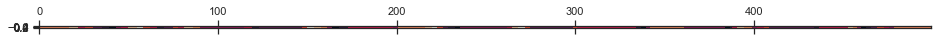

In [1154]:
plt.matshow(Lags_array[:,:500])

In [1155]:
# from tqdm import tqdm
# one_hot_all = []

# for i in tqdm(range(Lags_array.shape[1])):

#     timepoint_lags = Lags_array[:,i]
#     one_hot = np.zeros((len(timepoint_lags), max(Lags_array[0,:].astype(int))))
    
#     for lag, node in enumerate(timepoint_lags):
#         node=node.astype(int)
#         if node<1:
#             pass
#         else:
#             one_hot[lag,node-1]=1
#     one_hot_all.append(one_hot.flatten())
    
# one_hot_all = np.array(one_hot_all)

In [1156]:
Neuron_array.shape


(46, 30193)

In [1157]:
len(pref_phases)

46

In [1158]:
# NUM_ITERS = 10
# NUM_NEURONS = Neuron_array.shape[0]
# NUM_REGRESSORS = np.array(one_hot_all).shape[1]
# LASSO_PARAM = 0.0005

# for iteration in tqdm(range(NUM_ITERS)):
    
#     split_1_mask = np.random.choice([0, 1], size=(Lags_array.shape[1],), p=[0.5, 0.5]).astype(bool)
#     split_2_mask = ~split_1_mask
    
#     phases_split_1 = Phase_array[split_1_mask]
#     phases_split_2 = Phase_array[split_2_mask]
    
#     betas_array_1 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
#     betas_array_2 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    
#     for neuron, activity_array in enumerate(Neuron_array):
        

        
#         activity_array_split_1 = activity_array[split_1_mask][phases_split_1==pref_phases[neuron]]
#         activity_array_split_2 = activity_array[split_2_mask][phases_split_2==pref_phases[neuron]]
        
#         one_hot_all_split_1 = one_hot_all[split_1_mask, :]
#         one_hot_all_split_1 = one_hot_all_split_1[phases_split_1==pref_phases[neuron], :]
#         one_hot_all_split_2 = one_hot_all[split_2_mask, :]
#         one_hot_all_split_2 = one_hot_all_split_2[phases_split_2==pref_phases[neuron], :]
        
#         lasso_1 = Lasso(alpha = LASSO_PARAM)
#         lasso_1.fit(one_hot_all_split_1, activity_array_split_1)
#         betas_1 = lasso_1.coef_
        
#         lasso_2 = Lasso(alpha = LASSO_PARAM)
#         lasso_2.fit(one_hot_all_split_2, activity_array_split_2)
#         betas_2 = lasso_2.coef_
        
#         betas_array_1[neuron,:]=betas_1
#         betas_array_2[neuron,:]=betas_2
        
        
#     if iteration==0:
#         stacked_betas = np.stack((betas_array_1, betas_array_2))
#     else:
#         stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_1, axis=0)), axis=0)
#         stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_2, axis=0)), axis=0)
        
        
# num_stacks_in_split = math.floor(stacked_betas.shape[0]/2)

# stack_split_1 = stacked_betas[:num_stacks_in_split,:,:]
# stack_split_2 = stacked_betas[num_stacks_in_split:,:,:]

# mean_betas_1 = np.nanmean(stack_split_1, axis=0)
# mean_betas_2 = np.nanmean(stack_split_2, axis=0)


# row_means_1 = np.mean(mean_betas_1, axis=1, keepdims=True)
# row_means_2 = np.mean(mean_betas_2, axis=1, keepdims=True)

# centred_betas_1 = mean_betas_1 - row_means_1
# centred_betas_2 = mean_betas_2 - row_means_2
        

In [1159]:
stack_split_1[0]

array([[-1.62881307e-01,  0.00000000e+00,  1.16757840e-02,
        -1.26073372e-01,  8.44909235e-02, -6.42495723e-02,
         1.62223214e-04,  4.57209537e-02, -4.38136558e-02,
        -1.47434426e-01, -2.25147413e-01],
       [ 1.21368284e-02,  4.10576492e-02, -5.12427778e-03,
        -6.51760150e-03,  1.01924551e-01,  1.09181577e-01,
        -4.34600545e-02, -0.00000000e+00, -5.74707635e-03,
        -1.76221351e-01,  6.48495750e-02],
       [-0.00000000e+00,  9.44653910e-03,  0.00000000e+00,
        -0.00000000e+00, -6.50835222e-03,  9.79074095e-03,
        -1.03207446e-02, -7.35607409e-03,  1.04966304e-02,
         5.92198520e-03,  2.36936643e-02],
       [ 0.00000000e+00, -4.84741877e-02,  2.46885963e-03,
         0.00000000e+00, -2.50494115e-02, -5.35306278e-02,
         4.95343612e-02, -4.06946497e-02,  6.60705182e-02,
        -6.38904520e-02,  3.73994772e-02],
       [ 0.00000000e+00,  3.71099665e-02,  0.00000000e+00,
        -8.46766546e-03,  6.63344181e-02, -2.01604559e-02,
  

In [1160]:
centred_betas_1 = stack_arrays_vertically(betas_1_list)
centred_betas_2 = stack_arrays_vertically(betas_2_list)

AttributeError: 'AxesSubplot' object has no attribute 'colorbar'

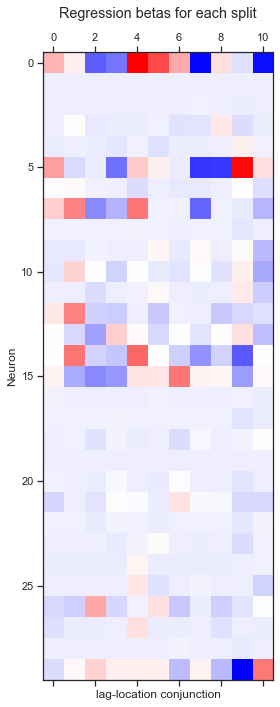

In [1181]:
fig, axs = plt.subplots(figsize = (10,10))
plt.suptitle('Regression betas for each split')
axs.matshow(centred_betas_1[:30,:], cmap='bwr')
axs.set_xlabel('lag-location conjunction')
axs.set_ylabel('Neuron')
for bound in range(1):
    
    axs.axvline(9*bound-0.5, color='b')
plt.tight_layout()
fig.savefig('/Users/AdamHarris/Desktop/betas_mat.svg')


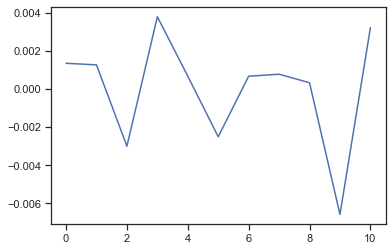

In [1162]:
for i in range(3):
    plt.plot(centred_betas_1[22,i*12:12+i*12])
plt.show()

In [1163]:
nums = [1,1,1,2,2,3]



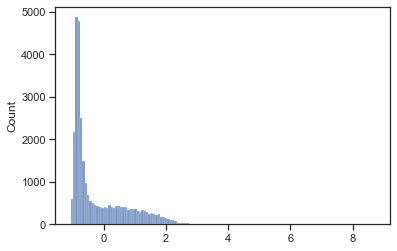

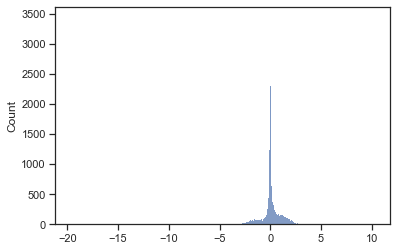

In [1164]:
%matplotlib inline
sns.histplot(Speed_array)
plt.show()
sns.histplot(Acceleration_array)
plt.show()

In [1165]:
removeDuplicates(nums)

[1, 1, 2, 2, 3]


5

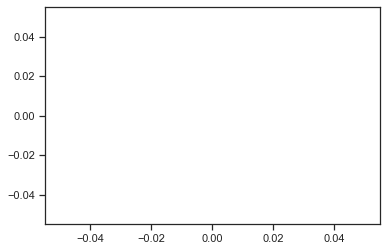

In [1166]:
plt.plot(centred_betas_1[23,36:48])

In [1167]:

rrr = [4, 6, 6, 2, 6, 6, 6, 6, 6, 6, 4, 4, 2, 2, 2, 2, 2, 2, 2]
len(rrr)

19

In [1168]:


# plt.matshow(centred_betas_1[:50,:27], cmap='bwr')
# plt.title('Regression betas for each split')
# plt.colorbar()
# plt.savefig('/Users/AdamHarris/Desktop/task_lag_betas_CB.svg')


In [1169]:
Edge_grid

array([[1, 2],
       [2, 3],
       [1, 4],
       [2, 5],
       [3, 6],
       [4, 5],
       [5, 6],
       [4, 7],
       [5, 8],
       [6, 9],
       [7, 8],
       [8, 9]], dtype=int32)

In [1170]:
degrees = [2,3,2,3,4,3,2,3,2] #, 0,0,0,0,0,0,0,0,0,0,0,0]
colors_for_annotation = ['black','black','black','black','white','black','black','black','black']
#colors_for_annotation.extend(['black']*12)

In [1171]:
x

(-0.18234882183384185, 0.41599257659805294)

check


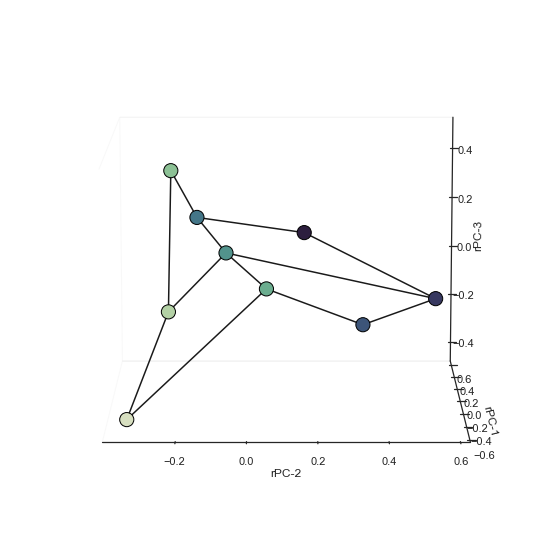

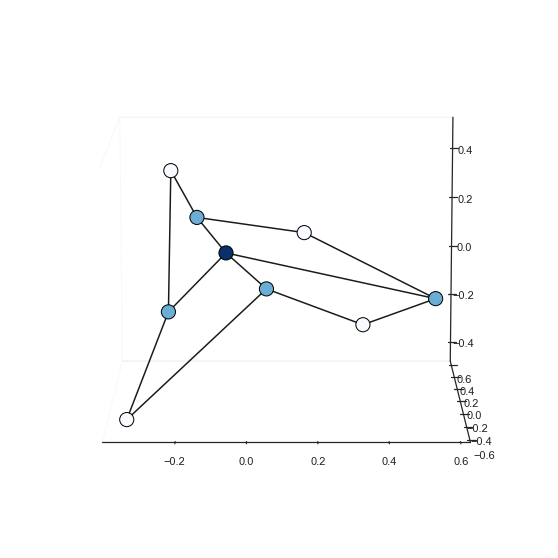

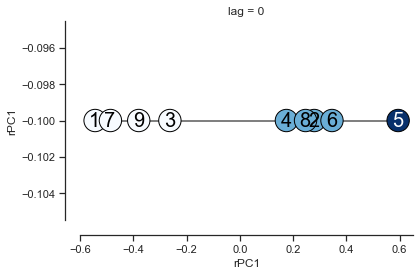

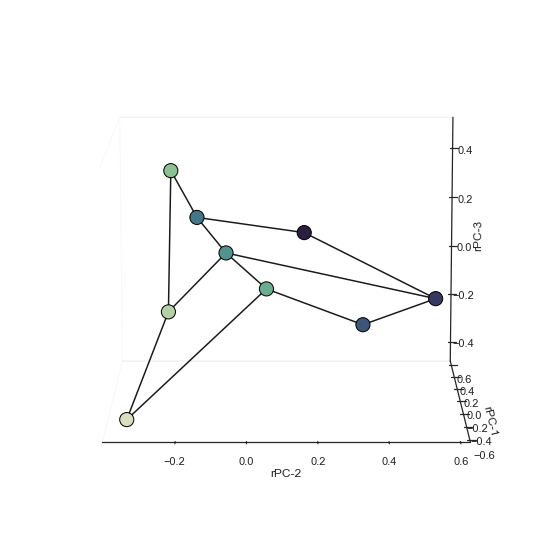

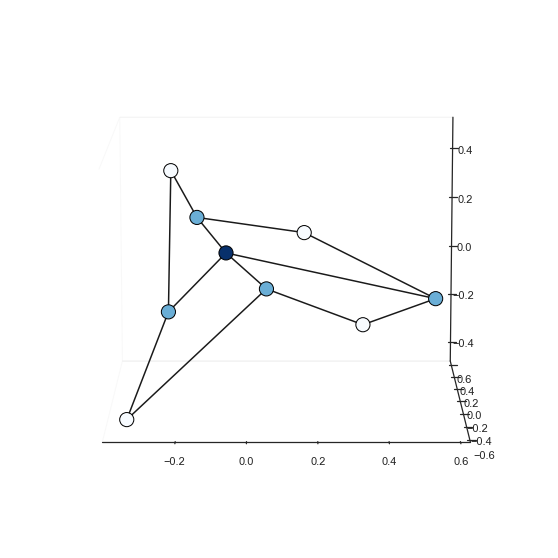

...

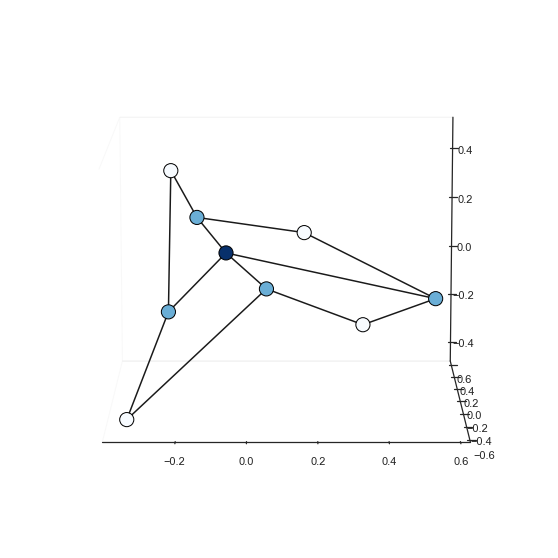

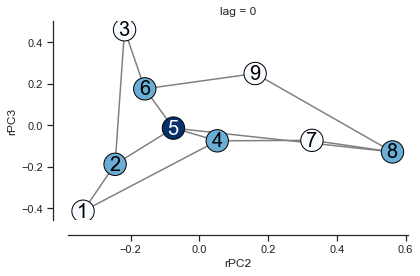

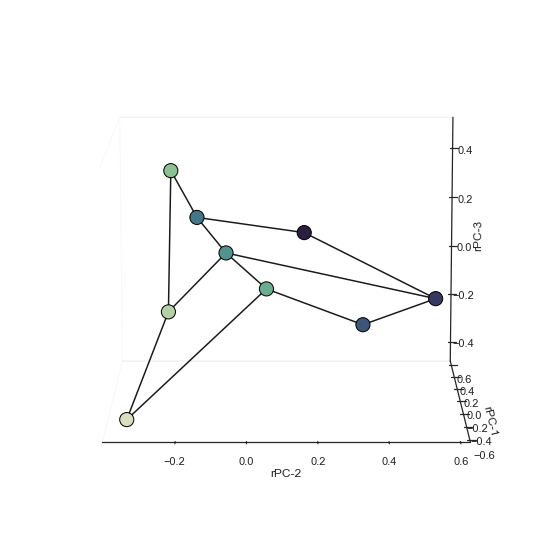

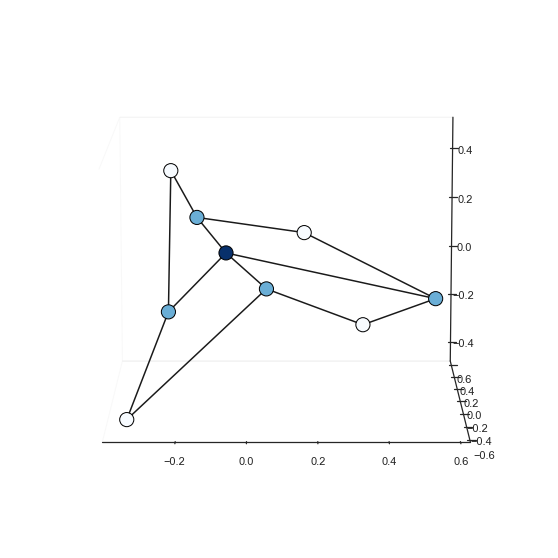

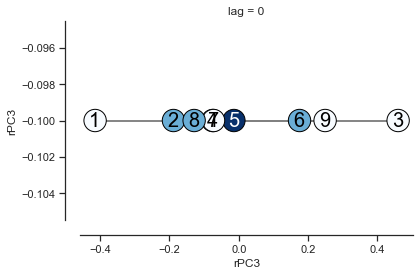

ValueError: n_components=9 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'

In [1226]:
num_locs = max(Lags_array[0,:])
%matplotlib inline
num_lags = 12
    
phase_planes_dic = {}
phase_specific_betas_dic = {}

centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_2
}

print('check')

for stack in range(1):
    for i in range(num_lags):
        for pc_i in range(3):
            for pc_j in range(pc_i,3):
                if i not in phase_planes_dic:
                    phase_planes_dic[i]=[]
                if i not in phase_specific_betas_dic:
                    phase_specific_betas_dic[i]=[]

                ind1 = (i * num_locs).astype(int)
                ind2 = (i*num_locs+num_locs).astype(int)
                
                phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
                phase_specific_betas_dic[i].append(phase_specific_betas)
                pca_phase = PCA(n_components=9)
                pca_phase.fit(phase_specific_betas)
                
#                 if pc_i ==0 and pc_j ==0:
#                     cumulative_variance = np.cumsum(pca_phase.explained_variance_ratio_)

#                     # Plotting
#                     plt.figure(figsize=(10, 6))
#                     plt.plot(range(1,10), cumulative_variance, marker='o', linestyle='-', color='b')
#                     plt.title('Cumulative Variance Explained by Principal Components')
#                     plt.xlabel('Number of Principal Components')
#                     plt.ylabel('Cumulative Variance Explained')
#                     plt.grid(True)
#                     plt.ylim(0, 1)
#                     plt.show()

                
                subspace_vectors = pca_phase.components_

                phase_planes_dic[i].append(subspace_vectors)

                projection = phase_specific_betas.dot(subspace_vectors.T)

                if stack==0:  #only plot for first partition
#                     for e in range(0,360,20):
#                         for a in range(0,360,20):
                    ax = plt.figure(figsize=(100,10)).add_subplot(projection='3d')
                    ax.view_init(elev=11, azim=270)
                    for connection in connections:
                        y = projection[connection[0],1], projection[connection[1],1]
                        x = projection[connection[0],0], projection[connection[1],0]
                        z = projection[connection[0],2], projection[connection[1],2]
                        ax.plot(y,x,z, zorder=1, color='k')

                    ax.scatter(projection[:,1], projection[:,0], projection[:,2],
                               c= [1,2,3,4,5,6,7,8,9], # degrees,
                               cmap=maze_pallet, #list(range(len(projection[:,1]))),
                               s=200, zorder=4, edgecolors='black', alpha=1.0)
                    plt.ylabel('rPC-1')
                    plt.xlabel('rPC-2')
                    ax.set_zlabel('rPC-3')
                    ax.xaxis.pane.fill = False
                    ax.yaxis.pane.fill = False
                    ax.zaxis.pane.fill = False
#                     plt.savefig(f'/Users/AdamHarris/Desktop/SUBSPACE_PC2_PC3_GREEN.pdf')
                    
                    # Turn off the grid
                    ax.grid(False)
                    plt.show()
                    
                    ax = plt.figure(figsize=(100,10)).add_subplot(projection='3d')
                    ax.view_init(elev=11, azim=270)
                    for connection in connections:
                        y = projection[connection[0],1], projection[connection[1],1]
                        x = projection[connection[0],0], projection[connection[1],0]
                        z = projection[connection[0],2], projection[connection[1],2]
                        ax.plot(y,x,z, zorder=1, color='k')

                    ax.scatter(projection[:,1], projection[:,0], projection[:,2],
                               c= degrees,#[1,2,3,4,5,6,7,8,9], # degrees,
                               cmap='Blues', #list(range(len(projection[:,1]))),
                               s=200, zorder=4, edgecolors='black', alpha=1.0)

                    ax.xaxis.pane.fill = False
                    ax.yaxis.pane.fill = False
                    ax.zaxis.pane.fill = False

                    # Turn off the grid
                    ax.grid(False)
                    plt.savefig(f'/Users/AdamHarris/Desktop/SUBSPACE_PC2_PC3.pdf')
                    plt.show()
                    
                    
                    fig, ax=plt.subplots()

                    sns.set_style('white')  # You can customize the style if needed
                    sns.set_theme(style="ticks")
                    sns.despine(bottom=False, left=False,offset=15)


            
                    if pc_i == pc_j:
                        for connection in connections:
                            x = [-0.1]*2
                            y = projection[connection[0],pc_j], projection[connection[1],pc_j]
                            ax.plot(y,x, color='gray')
                        
                        sc = ax.scatter(projection[:,pc_i], [-0.1]*len(projection[:,pc_i]),
                                   c=degrees,
                                   s=500, zorder=4, cmap='Blues', edgecolors='black')
                        node_labels = list(range(1,len(projection[:,1])+1))
                        xx=0
                        
                        for label, x_point, y_point in zip(node_labels, projection[:,pc_i], projection[:,pc_j]):
                            ax.annotate(label,
                                        xy=(x_point, -0.1),
                                        xytext=(-6,-6),
                                        textcoords='offset pixels',
                                        zorder=5,
                                        color=colors_for_annotation[xx],
                                        size=20)
                            xx+=1
                    else:
                        for connection in connections:
                            y = projection[connection[0],pc_i], projection[connection[1],pc_i]
                            x = projection[connection[0],pc_j], projection[connection[1],pc_j]
                            ax.plot(y,x, color='gray')
                        sc = ax.scatter(projection[:,pc_i], [projection[:,pc_j]],
                                   c=degrees,
                                   s=500, zorder=4, cmap='Blues', edgecolors='black')


                        node_labels = list(range(1,len(projection[:,1])+1))
                        xx=0
                        for label, x_point, y_point in zip(node_labels, projection[:,pc_i], projection[:,pc_j]):
                            ax.annotate(label,
                                        xy=(x_point, y_point),
                                        xytext=(-6,-6),
                                        textcoords='offset pixels',
                                        zorder=5,
                                        color=colors_for_annotation[xx],
                                        size=20)
                            xx+=1
                    ax.set_title(f'lag = {i}')
                    ax.set_xlabel(f'rPC{pc_i+1}')
                    ax.set_ylabel(f'rPC{pc_j+1}')
                    plt.tight_layout()
#                     fig.savefig(f'/Users/AdamHarris/Desktop/2D_SUBSPACE_PC{pc_i}_PC{pc_j}.pdf')
                
                    plt.show()
#                     fig.savefig(f'/Users/AdamHarris/Desktop/task_lag_subspace_lagupto13_{i}.svg',  dpi=300, bbox_inches = "tight")
#                     plt.close(fig)



In [ ]:
### phase_specific_betas = centred_betas_dic[stack][:,0:9].T
phase_specific_betas_dic[i].append(phase_specific_betas)
tsne = TSNE(n_components=2, perplexity=3, random_state=42)
tsne_result = tsne.fit_transform(phase_specific_betas)

%matplotlib inline
# Create a scatter plot for visualization

# Assuming 'labels' are your ground truth labels (if available)
# Replace 'labels' with your actual labels or color-coding mechanism.
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=degrees, cmap='Blues', s=300, edgecolor='black')

# RSA


In [621]:
def cos_sim(a,b):
    return dot(a, b)/(norm(a)*norm(b))

place_types = [0,1,0,1,2,1,0,1,0]
place_types_model = np.zeros((len(place_types), len(place_types)))
degree_model = np.zeros((len(place_types), len(place_types)))
for i , x in enumerate(place_types):
    for j, y in enumerate(place_types):
        degree_model[i,j]=abs(y-x)
        if x!=y:
            place_types_model[i,j]=1
        if i==j:
            place_types_model[i,j]=np.nan
            degree_model[i,j]=np.nan
maze_locs = np.array([
            [0,0],
            [0,1],
            [0,2],
            [1,0],
            [1,1],
            [1,2],
            [2,0],
            [2,1],
            [2,2]
            ])
dists = np.zeros((int(num_locs), int(num_locs)))

for i, x in enumerate(maze_locs):
    for j, y in enumerate(maze_locs):
        dists[i,j] = np.linalg.norm(x-y)
        if i==j:
            dists[i,j]=np.nan
            
# # Neuron_array
# # Location_array

# num_locs = max(Location_array)
# rdm = np.zeros((num_locs, num_locs))
# for i in range(1, num_locs+1):
#     for j in range(1, num_locs+1):
        
#         n1 = Neuron_array[:,Location_array==i]
#         n1_mean = np.mean(n1, axis=1)
        
#         n2 = Neuron_array[:,Location_array==j]
#         n2_mean = np.mean(n2, axis=1)

# #         corr = pearsonr(n1_mean, n2_mean)[1]
#         corr = np.linalg.norm(n1_mean-n2_mean)
#         rdm[i-1,j-1] = corr
#         if i==j:
#             rdm[i-1,j-1]=np.nan


In [837]:
# sessions, Tasks = get_sessions(mouse_recday)
rdms = []
downsample_factor=1

for mouse_recday in tqdm(Recording_days):

    sessions, Tasks = get_sessions(mouse_recday)
    for counter, session in enumerate(sessions):

        task = Tasks[session]
        
        Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
        subsetting = f'/Users/AdamHarris/Documents/PFC Subspaces/Data/Phase_state_place_anchored_{mouse_recday}.npy'
        subsetting_array = np.load(subsetting)

        Neuron_raw = Neuron_raw[subsetting_array[:,0], :]
        Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')

        XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')
        XY_processed = smooth_and_calculate_scalar_derivatives(XY_raw, sigma=5)
        speed = XY_processed[:,2]
        acceleration = XY_processed[:,3]

        Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
        data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')

        # downsample neurons and locations
        Neuron_raw_downsampled=average_over_factor(Neuron_raw, downsample_factor)
        Location_raw_downsampled=sample_every_nth(Location_raw, downsample_factor)
        num_locs = max(Location_array)
        rdm = np.zeros((num_locs, num_locs))
        
        for i in range(1, num_locs+1):
            for j in range(1, num_locs+1):

                n1 = Neuron_raw_downsampled[:,Location_raw_downsampled==i]
                n1_mean = np.mean(n1, axis=1)

                n2 = Neuron_raw_downsampled[:,Location_raw_downsampled==j]
                n2_mean = np.mean(n2, axis=1)

#                 corr = pearsonr(n1_mean, n2_mean)[0]
                corr = np.linalg.norm(n1_mean-n2_mean)
#                 cos_sim(n1_mean, n2_mean)
                rdm[i-1,j-1] = corr
                if i==j:
                    rdm[i-1,j-1]=np.nan
        rdms.append(rdm)

 25%|██▌       | 2/8 [00:03<00:07,  1.24s/it]

Exception: ah04_05122021_06122021_3.npy  not found


 38%|███▊      | 3/8 [00:05<00:07,  1.54s/it]

Exception: ah04_09122021_10122021_3.npy  not found


 50%|█████     | 4/8 [00:07<00:06,  1.73s/it]

Exception: me08_10092021_11092021_6.npy  not found


 62%|██████▎   | 5/8 [00:08<00:04,  1.38s/it]

Exception: me10_09122021_10122021_8.npy  not found


100%|██████████| 8/8 [00:11<00:00,  1.38s/it]


In [838]:
mean_rdm = np.mean(np.array(rdms), axis=0)

<AxesSubplot:>

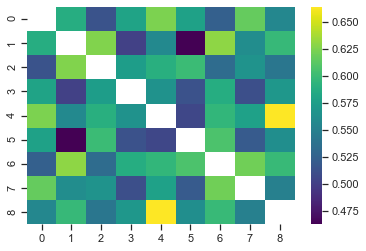

In [839]:
sns.heatmap(mean_rdm, cmap='viridis')

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/sklearn/manifold/_mds.py:441: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn("The MDS API has changed. ``fit`` now constructs an"


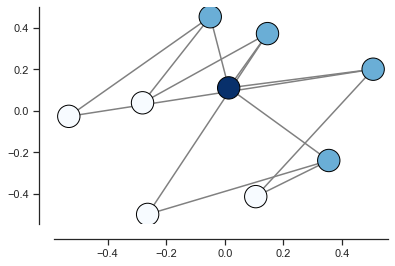

In [843]:
mean_rdm_copy = mean_rdm.copy()
for i in range(9):
    mean_rdm_copy[i,i]=0

mds_rdm = MDS(n_components=3)
yyy = mds_rdm.fit_transform(mean_rdm_copy)
fig, ax=plt.subplots()
       
sns.set_style('white')  # You can customize the style if needed
sns.set_theme(style="ticks")
sns.despine(bottom=False, left=False,offset=15)


for connection in connections:
    y = yyy[connection[0],1], yyy[connection[1],1]
    x = yyy[connection[0],0], yyy[connection[1],0]
    ax.plot(y,x, color='gray')

sc = ax.scatter(yyy[:,1], yyy[:,0],
           c=degrees,
           s=500, zorder=4, cmap='Blues', edgecolors='black')

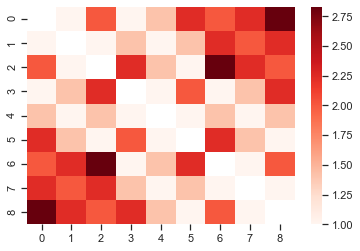

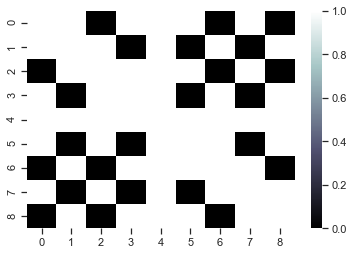

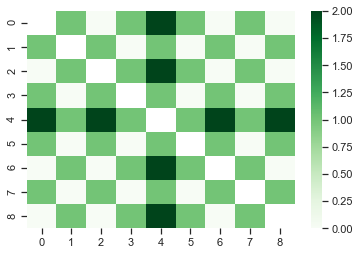

In [844]:
sns.heatmap(dists, cmap='Reds')
plt.show()
sns.heatmap(place_types_model, cmap='bone')
plt.show()
sns.heatmap(degree_model, cmap='Greens')
plt.show()

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


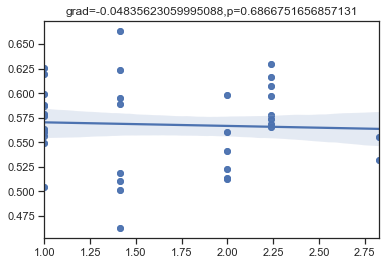

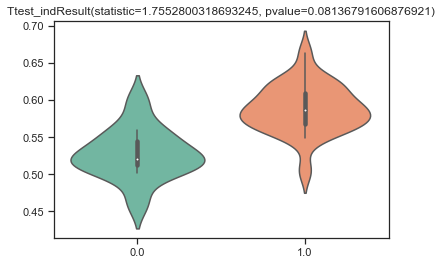

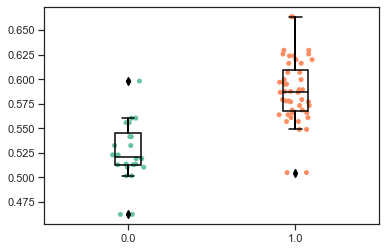

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


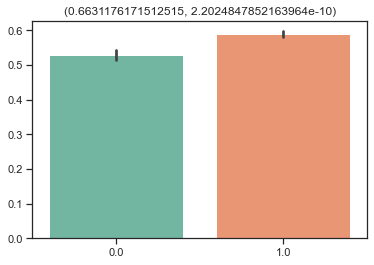

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


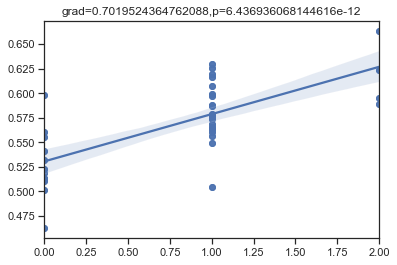

In [845]:
dists_proc = dists.flatten()[~np.isnan(dists.flatten())]
place_types_proc = place_types_model.flatten()[~np.isnan(place_types_model.flatten())]

degree_proc = degree_model.flatten()[~np.isnan(degree_model.flatten())]
mean_rdm_proc = mean_rdm.flatten()[~np.isnan(mean_rdm.flatten())]

rho_1, p_value_1 = pearsonr(dists_proc, mean_rdm_proc)
sns.regplot(dists_proc, mean_rdm_proc)
plt.title(f'grad={rho_1},p={p_value_1}')
plt.show()


p_value_2 = ttest_ind(place_types_proc, mean_rdm_proc)
sns.violinplot(place_types_proc, mean_rdm_proc, palette="Set2")
plt.title(f'{p_value_2}')
plt.show()
pal = "Set2"
df = {'place_types': place_types_proc,
     'norm': mean_rdm_proc}

ax=sns.stripplot(x = 'place_types', y ='norm', data = df, palette = pal, edgecolor = "white",
                 size = 5, jitter = 1, zorder = 0, orient = 'v')
ax=sns.boxplot(x = 'place_types', y = 'norm', data = df, color = "black", width = .15, zorder = 10,\
            showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
            showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
               saturation = 1, orient = 'v')
plt.show()

p_value_2 = pearsonr(place_types_proc, mean_rdm_proc, )
sns.barplot(place_types_proc, mean_rdm_proc,  palette="Set2")
plt.title(f'{p_value_2}')
plt.show()


rho_3, p_value_3 = pearsonr(degree_proc, mean_rdm_proc)
sns.regplot(degree_proc, mean_rdm_proc)
plt.title(f'grad={rho_3},p={p_value_3}')
plt.show()

100%|██████████| 1000/1000 [00:00<00:00, 2671.25it/s]
/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to us

Text(0.5, 1.0, 'degree; p=0.006')

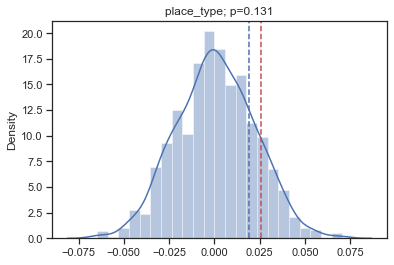

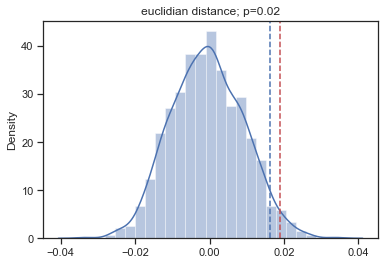

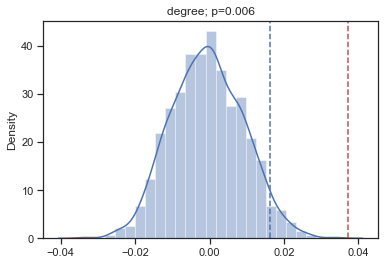

In [980]:
dists_proc = dists.flatten()[~np.isnan(dists.flatten())]
place_types_proc = place_types_model.flatten()[~np.isnan(place_types_model.flatten())]
degree_proc = degree_model.flatten()[~np.isnan(degree_model.flatten())]
mean_rdm_proc = mean_rdm.flatten()[~np.isnan(mean_rdm.flatten())]

regressors = np.array([dists_proc, place_types_proc, degree_proc]).T
reg = LinearRegression().fit(regressors, mean_rdm_proc)
betas = reg.coef_

null_betas = []
for i in tqdm(range(1000)):
    shuffle_rdm = mean_rdm_proc.copy()
    np.random.shuffle(shuffle_rdm)
    reg_shuffle = LinearRegression().fit(regressors, shuffle_rdm, )
    null_betas.append(reg_shuffle.coef_)
    
type_null_betas = np.sort(np.array(null_betas)[:,1])
eucl_null_betas = np.sort(np.array(null_betas)[:,0])
deg_null_betas = np.sort(np.array(null_betas)[:,2])


f, ax = plt.subplots()
ax = sns.distplot(type_null_betas)
ax.axvline(x=betas[1], color='r', linestyle='--', label='observed_beta')
ax.axvline(x=type_null_95_percentile, color='b', linestyle='--', label='95th percentile')
plt.title(f'place_type; p={calculate_p_value(betas[1],type_null_betas)}')



f, ax = plt.subplots()
ax = sns.distplot(eucl_null_betas)
ax.axvline(x=betas[0], color='r', linestyle='--', label='observed beta')
ax.axvline(x=eucl_null_95_percentile, color='b', linestyle='--', label='95th percentile')
plt.title(f'euclidian distance; p={calculate_p_value(betas[0],eucl_null_betas)}')


f, ax = plt.subplots()
ax = sns.distplot(eucl_null_betas)
ax.axvline(x=betas[2], color='r', linestyle='--', label='observed beta')
ax.axvline(x=eucl_null_95_percentile, color='b', linestyle='--', label='95th percentile')
plt.title(f'degree; p={calculate_p_value(betas[2],deg_null_betas)}')



In [981]:
dists_proc = dists.flatten()[~np.isnan(dists.flatten())]
place_types_proc = place_types_model.flatten()[~np.isnan(place_types_model.flatten())]
degree_proc = degree_model.flatten()[~np.isnan(degree_model.flatten())]
mean_rdm_proc = mean_rdm.flatten()[~np.isnan(mean_rdm.flatten())]

regressors = np.array([dists_proc, place_types_proc]).T
reg = LinearRegression().fit(regressors, mean_rdm_proc)
betas = reg.coef_

null_betas = []
for i in tqdm(range(1000)):
    shuffle_rdm = mean_rdm_proc.copy()
    np.random.shuffle(shuffle_rdm)
    reg_shuffle = LinearRegression().fit(regressors, shuffle_rdm, )
    null_betas.append(reg_shuffle.coef_)
    
type_null_betas = np.sort(np.array(null_betas)[:,1])
eucl_null_betas = np.sort(np.array(null_betas)[:,0])


type_null_95_percentile = get_percentile(type_null_betas)
eucl_null_95_percentile = get_percentile(eucl_null_betas)


100%|██████████| 1000/1000 [00:00<00:00, 2743.33it/s]


100%|██████████| 1000/1000 [00:00<00:00, 2567.12it/s]
/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to us

Text(0.5, 1.0, 'degree; p=0.011')

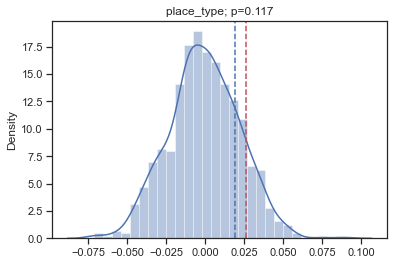

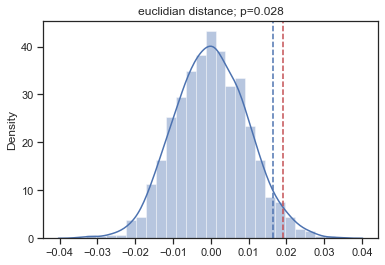

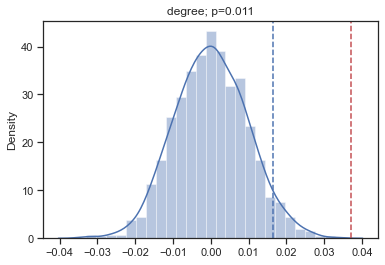

In [982]:
def get_percentile(data, percentile = 0.95):
    sorted_data = np.sort(data)
    # Calculate the index for the 95th percentile
    percentile_index = int(percentile * len(sorted_data))

    # Get the value at the 95th percentile
    percentile_value = sorted_data[percentile_index]
    
    return percentile_value

def calculate_p_value(observed_value, null_distribution):
    """
    Calculate the p-value based on an observed value and a null distribution.

    Parameters:
    - observed_value: The actual value observed in your data.
    - null_distribution: An array or list representing the null distribution.

    Returns:
    - p_value: The calculated p-value.
    """

    # Count how many values in the null distribution are equal to or more extreme than the observed value
    extreme_count = np.sum(null_distribution >= observed_value)

    # Calculate the proportion of values in the null distribution that are equal to or more extreme
    p_value = extreme_count / len(null_distribution)

    return p_value

In [983]:
type_null_95_percentile = get_percentile(type_null_betas)
eucl_null_95_percentile = get_percentile(eucl_null_betas)

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'place_type; p=0.0')

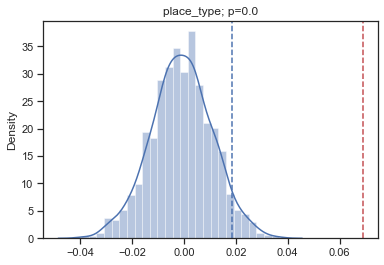

In [984]:
f, ax = plt.subplots()
ax = sns.distplot(type_null_betas)
ax.axvline(x=betas[1], color='r', linestyle='--', label='observed_beta')
ax.axvline(x=type_null_95_percentile, color='b', linestyle='--', label='95th percentile')
plt.title(f'place_type; p={calculate_p_value(betas[1],type_null_betas)}')

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'euclidian distance; p=0.03')

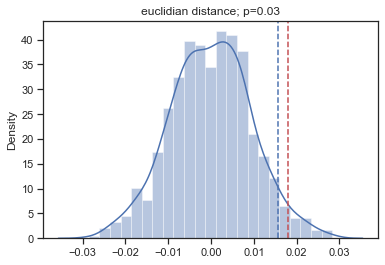

In [985]:
f, ax = plt.subplots()
ax = sns.distplot(eucl_null_betas)
ax.axvline(x=betas[0], color='r', linestyle='--', label='observed beta')
ax.axvline(x=eucl_null_95_percentile, color='b', linestyle='--', label='95th percentile')
plt.title(f'euclidian distance; p={calculate_p_value(betas[0],eucl_null_betas)}')

### PCA  of all place maps

In [967]:
# sessions, Tasks = get_sessions(mouse_recday)
place_maps = []
downsample_factor=2
place_map_all = []
for mouse_recday in tqdm(Recording_days):

    sessions, Tasks = get_sessions(mouse_recday)
    
    place_map_agg = []
    for counter, session in enumerate(sessions):

        task = Tasks[session]
        
        Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
        subsetting = f'/Users/AdamHarris/Documents/PFC Subspaces/Data/Phase_state_place_anchored_{mouse_recday}.npy'
        subsetting_array = np.load(subsetting)

        Neuron_raw = Neuron_raw[subsetting_array[:,2], :]
        Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')

        XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')
        XY_processed = smooth_and_calculate_scalar_derivatives(XY_raw, sigma=5)
        speed = XY_processed[:,2]
        acceleration = XY_processed[:,3]

        Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
        data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')

        # downsample neurons and locations
        Neuron_raw_downsampled=average_over_factor(Neuron_raw, downsample_factor)
        Location_raw_downsampled=sample_every_nth(Location_raw, downsample_factor)
        min_ind = min(Neuron_raw_downsampled.shape[1], 
                      len(Location_raw_downsampled))
        Neuron_raw_downsampled = Neuron_raw_downsampled[:,:min_ind]
        Location_raw_downsampled  = Location_raw_downsampled[:min_ind]
        num_neurons = Neuron_raw.shape[0]
        
        num_locs = max(Location_array)
        place_map = np.zeros((num_neurons, num_locs))
        
        for i in range(1, num_locs+1):
            neurons_in_place = Neuron_raw_downsampled[:, Location_raw_downsampled==i]
            nip_mean = np.mean(neurons_in_place, axis=1)
            place_map[:,i-1] = nip_mean
    
        place_map_agg.append(place_map)
        
    place_map_recday = np.mean(np.array(place_map_agg), axis=0)
    place_map_all.append(place_map_recday)

 25%|██▌       | 2/8 [00:00<00:02,  2.99it/s]

Exception: ah04_05122021_06122021_3.npy  not found


 38%|███▊      | 3/8 [00:01<00:02,  2.39it/s]

Exception: ah04_09122021_10122021_3.npy  not found


 50%|█████     | 4/8 [00:02<00:01,  2.23it/s]

Exception: me08_10092021_11092021_6.npy  not found


 75%|███████▌  | 6/8 [00:02<00:00,  3.03it/s]

Exception: me10_09122021_10122021_8.npy  not found


100%|██████████| 8/8 [00:03<00:00,  2.52it/s]


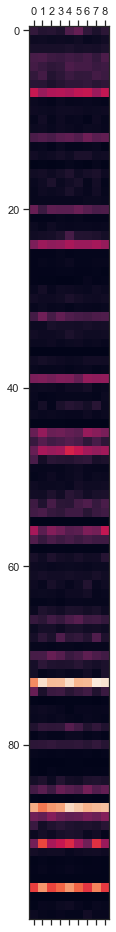

In [968]:
plt.matshow(stacked_array[:100,:])

In [973]:
stacked_array = np.vstack(place_map_all)
pca_place_maps = PCA()
pca_place_maps.fit(stacked_array.T)
principal_modes = pca_place_maps.components_
pca_place_maps.explained_variance_ratio_

array([4.59265460e-01, 1.35832197e-01, 1.22858275e-01, 9.09971381e-02,
       6.27653864e-02, 5.26405773e-02, 4.22403186e-02, 3.34006472e-02,
       2.62913731e-31])

In [974]:
principal_modes

array([[-0.03448857, -0.02772064,  0.0399255 , ..., -0.08549759,
         0.09618729,  0.05304792],
       [-0.05271219,  0.04898842,  0.0830456 , ...,  0.00464498,
         0.019569  , -0.03589792],
       [-0.05012338, -0.03389333, -0.0490356 , ...,  0.05827883,
         0.04561035,  0.01884617],
       ...,
       [ 0.01209973, -0.02589661,  0.03193627, ...,  0.04738344,
        -0.06003301, -0.02621427],
       [ 0.10270431,  0.05599834,  0.01785441, ...,  0.05023861,
        -0.03738606,  0.00125046],
       [ 0.14327185, -0.0864176 ,  0.09259373, ..., -0.04155678,
         0.03557364,  0.03416943]])

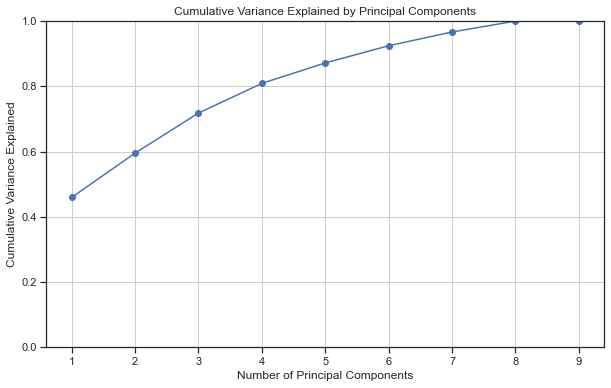

In [975]:
cumulative_variance = np.cumsum(pca_place_maps.explained_variance_ratio_)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(range(1,10), cumulative_variance, marker='o', linestyle='-', color='b')
plt.title('Cumulative Variance Explained by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.grid(True)
plt.ylim(0, 1)
plt.show()

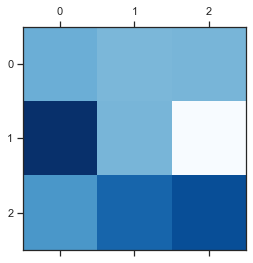

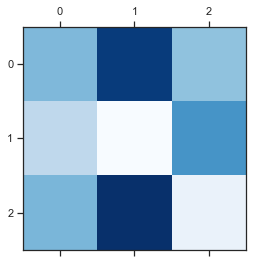

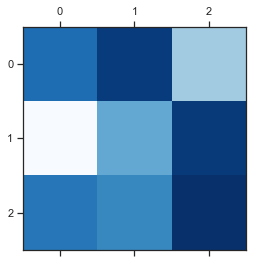

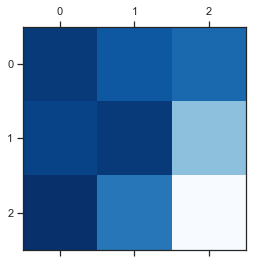

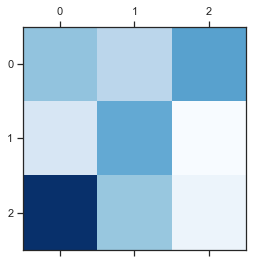

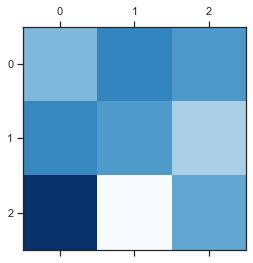

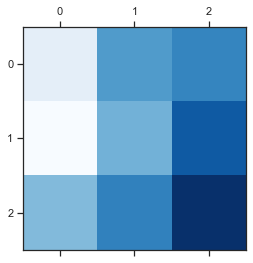

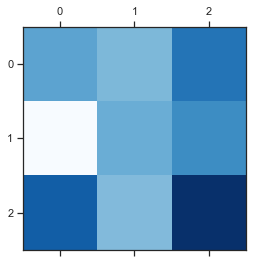

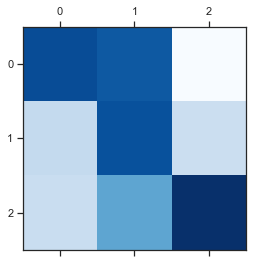

In [977]:
for i in range(9):
    model_cell_1 = principal_modes[:,i]
    model_cell_1 = model_cell_1.reshape(3,3)
    plt.matshow(model_cell_1, cmap='Blues')
    plt.show()

(3801, 9)

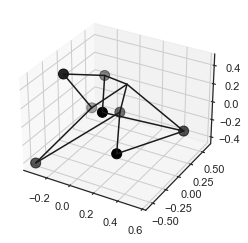

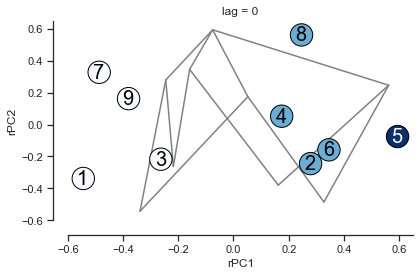

In [1199]:
num_locs = max(Lags_array[0,:])
%matplotlib inline
num_lags = 1
    
phase_planes_dic = {}
phase_specific_betas_dic = {}

centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_2
}
for stack in range(2):
    for i in range(num_lags):
        
        if i not in phase_planes_dic:
            phase_planes_dic[i]=[]
        if i not in phase_specific_betas_dic:
            phase_specific_betas_dic[i]=[]
            
        ind1 = (i * num_locs).astype(int)
        ind2 = (i*num_locs+num_locs).astype(int)

        phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
        phase_specific_betas_dic[i].append(phase_specific_betas)
        pca_phase = PCA(n_components=3)
        pca_phase.fit(phase_specific_betas)
        subspace_vectors = pca_phase.components_
        
        phase_planes_dic[i].append(subspace_vectors)
    
        projection = phase_specific_betas.dot(subspace_vectors.T)
        
        if stack==0:  #only plot for first partition
            ax = plt.figure().add_subplot(projection='3d')
            for connection in connections:
                y = projection[connection[0],1], projection[connection[1],1]
                x = projection[connection[0],0], projection[connection[1],0]
                z = projection[connection[0],2], projection[connection[1],2]
                ax.plot(y,x,z, color='k')

            ax.scatter(projection[:,1], projection[:,0], projection[:,2], 
                       c=colors_for_annotation, #list(range(len(projection[:,1]))),
                       s=100, zorder=4)
    
            fig, ax=plt.subplots()
       
            sns.set_style('white')  # You can customize the style if needed
            sns.set_theme(style="ticks")
            sns.despine(bottom=False, left=False,offset=15)


            for connection in connections:
                y = projection[connection[0],1], projection[connection[1],1]
                x = projection[connection[0],0], projection[connection[1],0]
                ax.plot(y,x, color='gray')

            sc = ax.scatter(projection[:,0], projection[:,1],
                       c=degrees,
                       s=500, zorder=4, cmap='Blues', edgecolors='black')


            node_labels = list(range(1,len(projection[:,1])+1))
            xx=0
            for label, x_point, y_point in zip(node_labels, projection[:,0], projection[:,1]):
                ax.annotate(label,
                            xy=(x_point, y_point),
                            xytext=(-6,-6),
                            textcoords='offset pixels',
                            zorder=5,
                            color=colors_for_annotation[xx],
                            size=20)
                xx+=1
            ax.set_title(f'lag = {i}')
            ax.set_xlabel('rPC1')
            ax.set_ylabel('rPC2')
            plt.tight_layout()
#             fig.savefig(f'/Users/AdamHarris/Desktop/task_lag_subspace_lagupto13_{i}.svg',  dpi=300, bbox_inches = "tight")
#             plt.close(fig)
        
    

(9, 9)


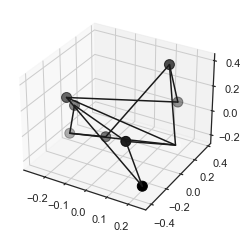

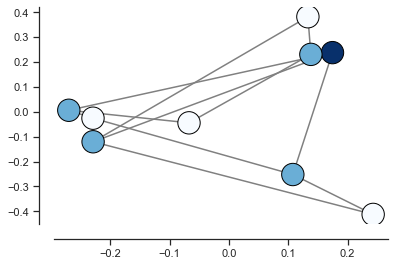

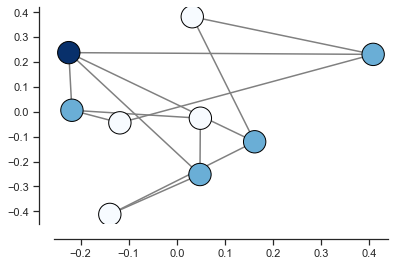

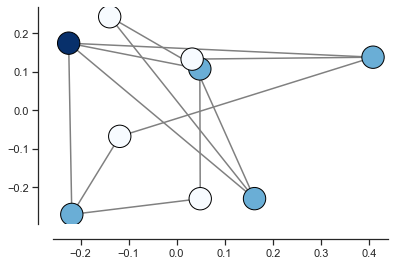

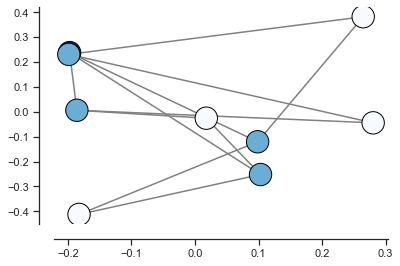

...

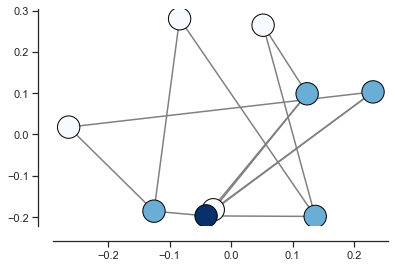

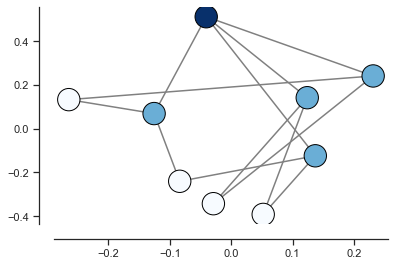

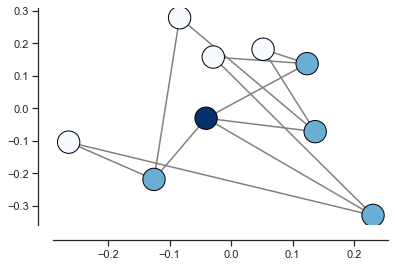

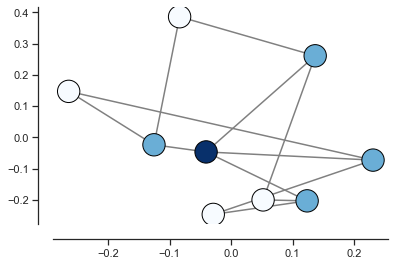

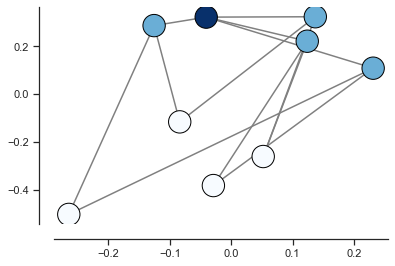

In [1223]:


num_locs = max(Lags_array[0,:])
%matplotlib inline
num_lags = 1
    
phase_planes_dic = {}
phase_specific_betas_dic = {}

centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_2
}


for stack in range(1):
    for i in range(num_lags):
        
        if i not in phase_planes_dic:
            phase_planes_dic[i]=[]
        if i not in phase_specific_betas_dic:
            phase_specific_betas_dic[i]=[]
            
        ind1 = (i * num_locs).astype(int)
        ind2 = (i*num_locs+num_locs).astype(int)

        phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
        phase_specific_betas_dic[i].append(phase_specific_betas)
        pca_phase = MDS(n_components=9, n_init=10, max_iter=600)
        xxx = pca_phase.fit_transform(phase_specific_betas)
        print(xxx.shape)
#         subspace_vectors = pca_phase.embedding_
        
#         phase_planes_dic[i].append(subspace_vectors)
    
#         projection = phase_specific_betas.dot(subspace_vectors.T)
        
        if stack==0:  #only plot for first partition
            ax = plt.figure().add_subplot(projection='3d')
            for connection in connections:
                y = xxx[connection[0],1], xxx[connection[1],1]
                x = xxx[connection[0],0], xxx[connection[1],0]
                z = xxx[connection[0],2], xxx[connection[1],2]
                ax.plot(y,x,z, color='k')

            ax.scatter(xxx[:,1], xxx[:,0], xxx[:,2], 
                       c=colors_for_annotation, #list(range(len(projection[:,1]))),
                       s=100, zorder=4)
    
            

            for ii in range(9):
                for jj in range(9):
                    if ii>jj:
                        fig, ax=plt.subplots()
       
                        sns.set_style('white')  # You can customize the style if needed
                        sns.set_theme(style="ticks")
                        sns.despine(bottom=False, left=False,offset=15)
                        for connection in connections:

                            y = xxx[connection[0],ii], xxx[connection[1],ii]
                            x = xxx[connection[0],jj], xxx[connection[1],jj]
                            ax.plot(y,x, color='gray')

                        sc = ax.scatter(xxx[:,ii], xxx[:,jj],
                                   c=degrees,
                                   s=500, zorder=4, cmap='Blues', edgecolors='black')

                        plt.show()
#             node_labels = list(range(1,len(projection[:,1])+1))
#             xx=0
#             for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
#                 ax.annotate(label,
#                             xy=(x_point, y_point),
#                             xytext=(-6,-6),
#                             textcoords='offset pixels',
#                             zorder=5,
#                             color=colors_for_annotation[xx],
#                             size=20)
#                 xx+=1
#             ax.set_title(f'lag = {i}')
#             ax.set_xlabel('rPC1')
#             ax.set_ylabel('rPC2')
#             plt.tight_layout()
#             fig.savefig(f'/Users/AdamHarris/Desktop/task_lag_subspace_lagupto13_{i}.svg',  dpi=300, bbox_inches = "tight")
#             plt.close(fig)
        
    

In [1207]:
xxx

array([[ 0.18325883, -0.08082992,  0.24710139,  0.30373822, -0.33205047,
        -0.17128077,  0.08829372,  0.1318844 ,  0.10480041],
       [-0.18325883,  0.08082992, -0.24710139, -0.30373822,  0.33205047,
         0.17128077, -0.08829372, -0.1318844 , -0.10480041]])

In [38]:
# for i in range(0,5):
    
#     proj_congruent = phase_specific_betas_dic[0][1]
#     proj_incongruent = phase_specific_betas_dic[i][1]
#     subspace_vectors = phase_planes_dic[0][1]
#     if i==0:
#         proj_incongruent = phase_specific_betas_dic[i][0] 
#     proj_1 = proj_congruent.dot(subspace_vectors.T)
#     proj_2 = proj_incongruent.dot(subspace_vectors.T)

#     ax = plt.figure(figsize=(7,7)).add_subplot(projection='3d')
#     ax.set_title(f'lag_0 vs lag_{i}')
#     for connection in connections:
#         y = proj_1[connection[0],1], proj_1[connection[1],1]
#         x = proj_1[connection[0],0], proj_1[connection[1],0]
#         z = proj_1[connection[0],2], proj_1[connection[1],2]
#         ax.plot(y,x,z, color='k')

#         y2 = proj_2[connection[0],1], proj_2[connection[1],1]
#         x2 = proj_2[connection[0],0], proj_2[connection[1],0]
#         z2 = proj_2[connection[0],2], proj_2[connection[1],2]
#         ax.plot(y2,x2,z2, color='gray')

#     ax.scatter(proj_1[:,1], proj_1[:,0], proj_1[:,2], 
#                c=list(range(len(proj_1[:,1]))),
#                s=100, zorder=4, cmap = 'viridis')

#     ax.scatter(proj_2[:,1], proj_2[:,0], proj_2[:,2], 
#                c=list(range(len(proj_2[:,1]))),
#                s=100, zorder=4, cmap = 'inferno')
#     plt.show()


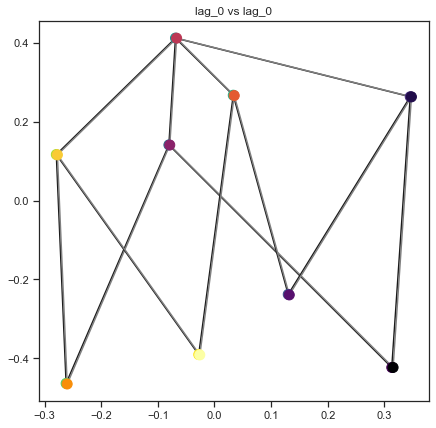

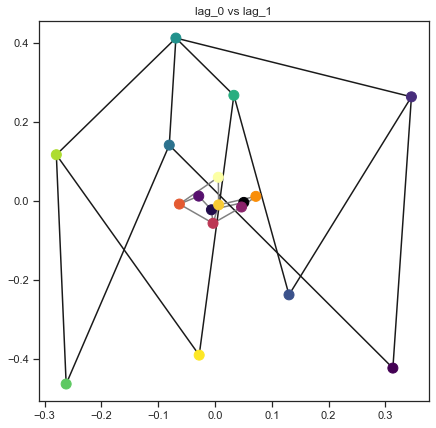

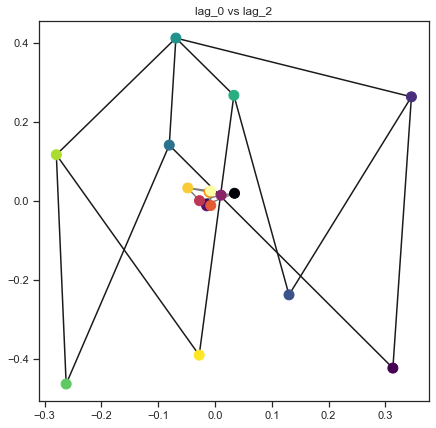

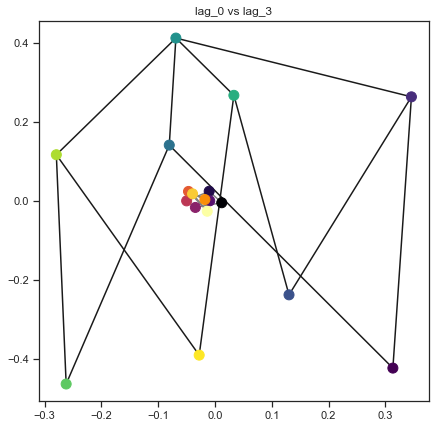

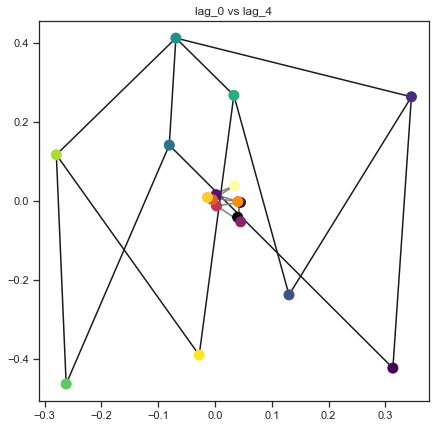

...

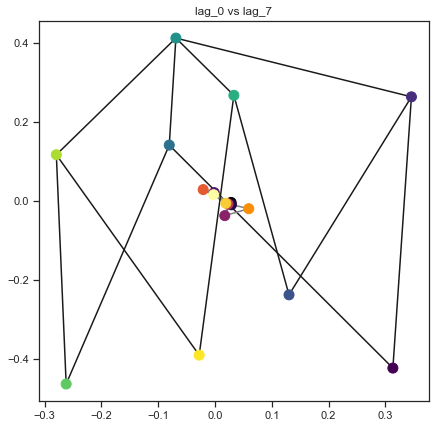

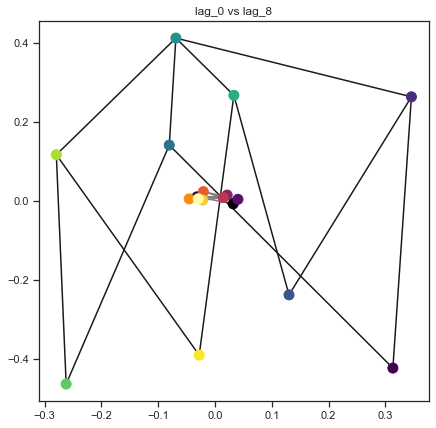

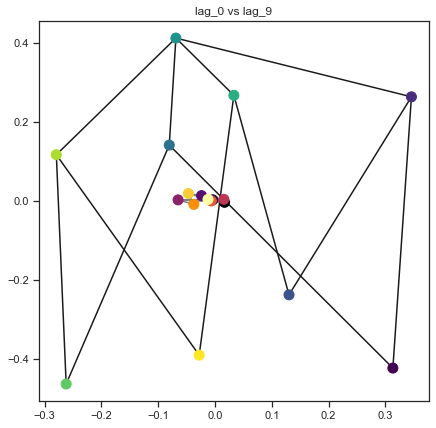

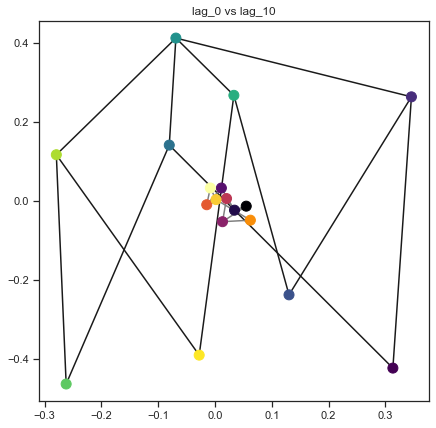

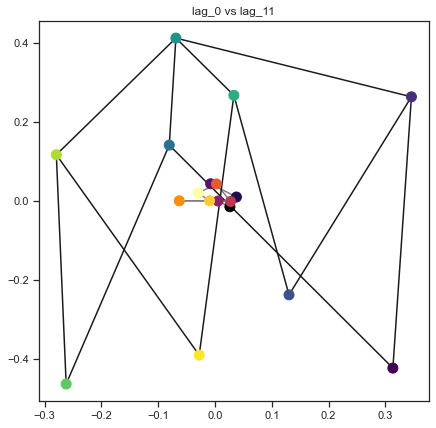

In [125]:
for i in range(0,12):
    
    proj_congruent = phase_specific_betas_dic[0][1]
    proj_incongruent = phase_specific_betas_dic[i][1]
    subspace_vectors = phase_planes_dic[0][1][:2,:]
    if i==0:
        proj_incongruent = phase_specific_betas_dic[i][0] 
    proj_1 = proj_congruent.dot(subspace_vectors.T)
    proj_2 = proj_incongruent.dot(subspace_vectors.T)

    ax = plt.figure(figsize=(7,7)).add_subplot()
    ax.set_title(f'lag_0 vs lag_{i}')
    for connection in connections:
        y = proj_1[connection[0],1], proj_1[connection[1],1]
        x = proj_1[connection[0],0], proj_1[connection[1],0]
      
        ax.plot(y,x, color='k')

        y2 = proj_2[connection[0],1], proj_2[connection[1],1]
        x2 = proj_2[connection[0],0], proj_2[connection[1],0]
       
        ax.plot(y2,x2, color='gray')

    ax.scatter(proj_1[:,1], proj_1[:,0], 
               c=list(range(len(proj_1[:,1]))),
               s=100, zorder=4, cmap = 'viridis')

    ax.scatter(proj_2[:,1], proj_2[:,0], 
               c=list(range(len(proj_2[:,1]))),
               s=100, zorder=4, cmap = 'inferno')
    plt.show()

In [126]:
import math

def cos_to_degrees(cos_theta):
    """
    Convert cosine value to degrees.

    Parameters:
    - cos_theta (float): Cosine value.

    Returns:
    - float: Angle in degrees.
    """
    if -1 <= cos_theta <= 1:
        # Using arccos to get the angle in radians
        angle_radians = math.acos(cos_theta)

        # Converting radians to degrees
        angle_degrees = math.degrees(angle_radians)

        return angle_degrees
    else:
        raise ValueError("Input must be within the range of -1 to 1 for a valid cosine value.")


In [127]:
#### self_comps  
angles_self = []
for i in phase_planes_dic:
    plane1 = phase_planes_dic[i][0]
    plane2 = phase_planes_dic[i][1]
    outer_product = plane1.dot(plane2.T)
    U, S, Vt = np.linalg.svd(outer_product, full_matrices=True)
    principal_angle = S[0]
    angles_self.append(principal_angle) 
    
angles_across = []
dist = []
# if phase_partitions ==3:
#     comps =[[0,1],
#             [0,2],
#             [1,2]]

# if phase_partitions ==5:
#     comps =[[0,1],
#             [0,2],
#             [0,3],
#             [0,4],
#             [2,4]]

comps = []
for i,_ in enumerate(phase_planes_dic):
    for j,_ in enumerate(phase_planes_dic):
#         if i<=j:
        comps.append([i,j])
    

for comp in comps:
    plane1 = phase_planes_dic[comp[0]][0]
    plane2 = phase_planes_dic[comp[1]][1]
    outer_product = plane1.dot(plane2.T)
    U, S, Vt = np.linalg.svd(outer_product, full_matrices=True)
    principal_angle = S[0]
    angles_across.append(cos_to_degrees(min(1,principal_angle)))
    #angles_across.append(principal_angle)
    dist.append((comp[1]-comp[0])%12)

In [128]:
principal_angle

0.9996852740324793

In [129]:
plane1.dot(plane2.T)


array([[ 9.99659464e-01,  5.06858123e-03, -7.87553201e-04],
       [ 5.01367500e-03, -9.99209259e-01,  1.95535020e-02],
       [ 6.01780249e-04,  1.95165263e-02,  9.99243366e-01]])

In [130]:
outer_product

array([[ 9.99659464e-01,  5.06858123e-03, -7.87553201e-04],
       [ 5.01367500e-03, -9.99209259e-01,  1.95535020e-02],
       [ 6.01780249e-04,  1.95165263e-02,  9.99243366e-01]])

(-0.3783892054605766, 2.9229313748653705e-06)


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


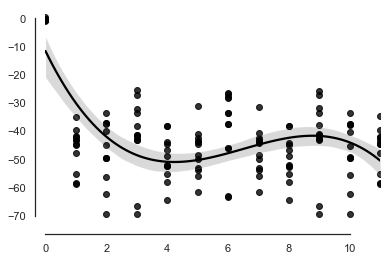

In [131]:
from scipy.stats import pearsonr
print(pearsonr(dist, 1-np.array(angles_across)))
sns.set_style('white')
sns.regplot(dist, 1-np.array(angles_across), color='black', order=3)
sns.despine(offset=10, trim=True);

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 58.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


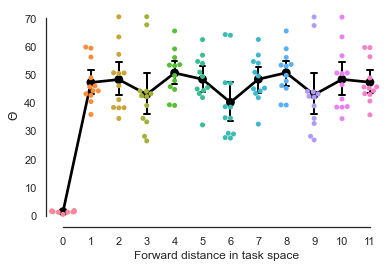

In [132]:
plot_dict = {
    'forward_dist': dist,
    'subspace_angle': np.array(angles_across)
}


fig, ax=plt.subplots()
sns.set_style('white', {'axes.linewidth': 20, 'axes.edgecolor':'black'})  # You can customize the style if needed


ax = sns.swarmplot(x="forward_dist", y="subspace_angle", data=plot_dict)
sns.set_theme(style="ticks")

# Add mean and standard error bars using sns.barplot
sns.pointplot(x="forward_dist", y="subspace_angle", data=plot_dict, ax=ax,  errorbar='se', capsize=0.2, errwidth=2, color="black")

# Set labels and title
ax.set_xlabel("Forward distance in task space")
ax.set_ylabel("$\Theta$")

sns.despine(bottom=False, left=False,offset=3, trim=True)


# Show the plot
plt.show()
# fig.savefig("/Users/AdamHarris/Desktop/Task lag angles.svg", dpi=300, bbox_inches = "tight")

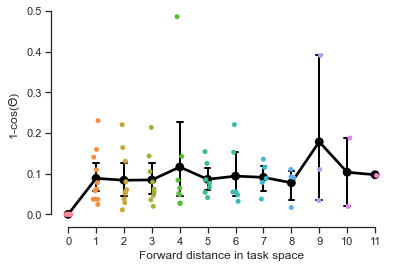

In [251]:
plot_dict = {
    'forward_dist': dist,
    'subspace_angle': 1-np.array(angles_across)
}


fig, ax=plt.subplots()
sns.set_style('white', {'axes.linewidth': 20, 'axes.edgecolor':'black'})  # You can customize the style if needed


ax = sns.stripplot(x="forward_dist", y="subspace_angle", data=plot_dict)
sns.set_theme(style="ticks")

# Add mean and standard error bars using sns.barplot
sns.pointplot(x="forward_dist", y="subspace_angle", data=plot_dict, ax=ax,  errorbar='se', capsize=0.2, errwidth=2, color="black")

# Set labels and title
ax.set_xlabel("Forward distance in task space")
ax.set_ylabel("1-cos($\Theta$)")

sns.despine(bottom=False, left=False,offset=3, trim=True)


# Show the plot
plt.show()
# fig.savefig("/Users/AdamHarris/Desktop/Task lag angles.svg", dpi=300, bbox_inches = "tight")

In [152]:
# Neuron_array
# Location_array
num_locs = max(Location_array)
rdm = np.zeros((num_locs, num_locs))
for i in range(1, num_locs+1):
    for j in range(1, num_locs+1):
        
        n1 = Neuron_array[:,Location_array==i]
        n1_mean = np.mean(n1, axis=1)
        
        n2 = Neuron_array[:,Location_array==j]
        n2_mean = np.mean(n2, axis=1)

#         corr = pearsonr(n1_mean, n2_mean)[1]
        corr = np.linalg.norm(n1_mean-n2_mean)
        rdm[i-1,j-1] = corr
        if i==j:
            rdm[i-1,j-1]=np.nan


In [153]:
place_types_model

array([[0., 1., 0., 1., 1., 1., 0., 1., 0.],
       [1., 0., 1., 0., 1., 0., 1., 0., 1.],
       [0., 1., 0., 1., 1., 1., 0., 1., 0.],
       [1., 0., 1., 0., 1., 0., 1., 0., 1.],
       [1., 1., 1., 1., 0., 1., 1., 1., 1.],
       [1., 0., 1., 0., 1., 0., 1., 0., 1.],
       [0., 1., 0., 1., 1., 1., 0., 1., 0.],
       [1., 0., 1., 0., 1., 0., 1., 0., 1.],
       [0., 1., 0., 1., 1., 1., 0., 1., 0.]])

In [162]:
place_types = [0,1,0,1,2,1,0,1,0]
place_types_model = np.zeros((len(place_types), len(place_types)))
degree_model = np.zeros((len(place_types), len(place_types)))
for i , x in enumerate(place_types):
    for j, y in enumerate(place_types):
        degree_model[i,j]=abs(y-x)
        if x!=y:
            place_types_model[i,j]=1
        if i==j:
            place_types_model[i,j]=np.nan
            degree_model[i,j]=np.nan
maze_locs = np.array([
            [0,0],
            [0,1],
            [0,2],
            [1,0],
            [1,1],
            [1,2],
            [2,0],
            [2,1],
            [2,2]
            ])
dists = np.zeros((num_locs, num_locs))

for i, x in enumerate(maze_locs):
    for j, y in enumerate(maze_locs):
        dists[i,j] = np.linalg.norm(x-y)
        if i==j:
            dists[i,j]=np.nan
            
# Neuron_array
# Location_array

num_locs = max(Location_array)
rdm = np.zeros((num_locs, num_locs))
for i in range(1, num_locs+1):
    for j in range(1, num_locs+1):
        
        n1 = Neuron_array[:,Location_array==i]
        n1_mean = np.mean(n1, axis=1)
        
        n2 = Neuron_array[:,Location_array==j]
        n2_mean = np.mean(n2, axis=1)

#         corr = pearsonr(n1_mean, n2_mean)[1]
        corr = np.linalg.norm(n1_mean-n2_mean)
        rdm[i-1,j-1] = corr
        if i==j:
            rdm[i-1,j-1]=np.nan



In [163]:
maze_locs = np.array([
    [0,0],
    [0,1],
    [0,2],
    [1,0],
    [1,1],
    [1,2],
    [2,0],
    [2,1],
    [2,2]
        ])
dists = np.zeros((num_locs, num_locs))

for i, x in enumerate(maze_locs):
    for j, y in enumerate(maze_locs):
        dists[i,j] = np.linalg.norm(x-y)
        if i==j:
            dists[i,j]=np.nan

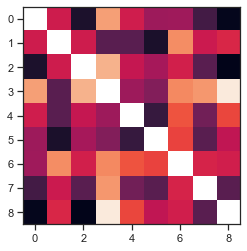

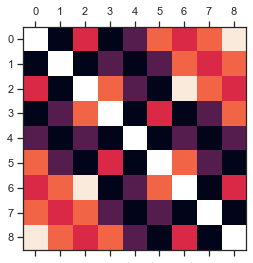

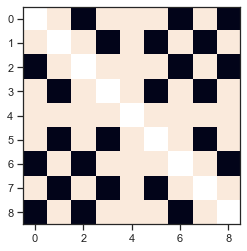

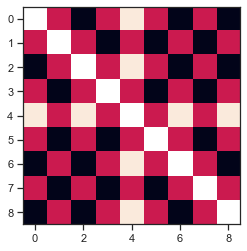

In [164]:
plt.imshow(rdm)
plt.show()
plt.matshow(dists)
plt.show()
plt.imshow(place_types_model)
plt.show()
plt.imshow(degree_model)
plt.show()

(0.3818653580081705, 0.0009332424390430731)


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


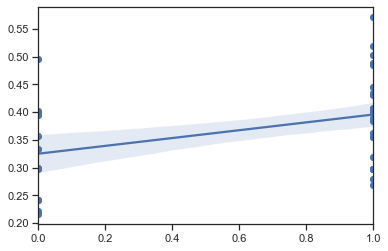

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(0.3769817904653808, 0.00109797543772478)


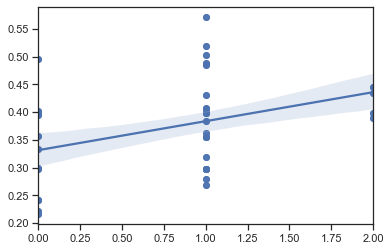

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(-0.019951102948974588, 0.8678859199331292)


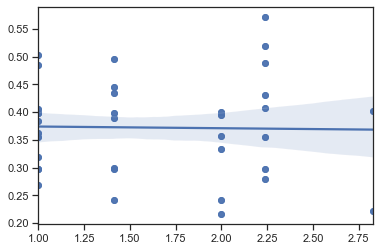

In [170]:
sns.regplot(place_types_model.flatten(), rdm.flatten())
print(pearsonr(place_types_model.flatten()[~np.isnan(place_types_model.flatten())], 
               rdm.flatten()[~np.isnan(rdm.flatten())]))
plt.show()
sns.regplot(degree_model.flatten(), rdm.flatten())
print(pearsonr(degree_model.flatten()[~np.isnan(degree_model.flatten())], 
               rdm.flatten()[~np.isnan(rdm.flatten())]))
plt.show()
sns.regplot(dists.flatten(), rdm.flatten())
print(pearsonr(dists.flatten()[~np.isnan(dists.flatten())], rdm.flatten()[~np.isnan(rdm.flatten())]))
plt.show()

In [141]:
maze_locs = np.array([
    [0,0],
    [0,1],
    [0,2],
    [1,0],
    [1,1],
    [1,2],
    [2,0],
    [2,1],
    [2,2]
        ])
dists = np.zeros((num_locs, num_locs))

for i, x in enumerate(maze_locs):
    for j, y in enumerate(maze_locs):
        dists[i,j] = np.linalg.norm(x-y)
        if i==j:
            dists[i,j]=np.nan

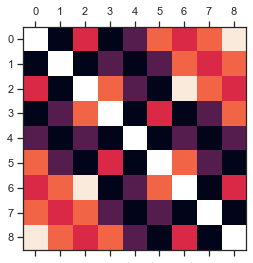

In [161]:
plt.matshow(dists)

In [92]:
1import numpy as np
from scipy.spatial.distance import squareform

def compute_location_rdm(neural_activity, locations):
    """
    Compute the Representational Dissimilarity Matrix (RDM) based on neural activity and discrete locations.

    Parameters:
    - neural_activity (numpy array): Array of neural activity across time for n neurons (shape: n x t).
    - locations (numpy array): Array of discrete locations (1-9) of length t.

    Returns:
    - rdm (numpy array): Representational Dissimilarity Matrix.
    """

    # Ensure the input arrays have compatible shapes
    assert neural_activity.shape[1] == len(locations), "Dimension mismatch between neural activity and locations."

    # Create an empty matrix to store dissimilarities
    rdm = np.zeros((neural_activity.shape[0], neural_activity.shape[0]))

    # Iterate over timepoints to compute dissimilarities
    for t in range(neural_activity.shape[1]):
        # Extract neural activity at the current timepoint
        activity_t = neural_activity[:, t]

        # Find indices corresponding to the current location
        indices_location_t = np.where(locations == locations[t])[0]

        # Calculate pairwise dissimilarities based on neural activity
        for i in range(len(indices_location_t)):
            for j in range(i + 1, len(indices_location_t)):
                rdm[:, :] += np.abs(np.subtract.outer(activity_t, activity_t))
    
    # Normalize the RDM by dividing by the number of comparisons
    rdm /= len(indices_location_t)

    return squareform(rdm)


In [93]:
compute_location_rdm(Neuron_array, Location_array)

KeyboardInterrupt: 

In [425]:
cohort_dic = {
    2: ['me03', 'me04', 'me05', 'me06'],
    3: ['me08', 'me09', 'ah02', 'ah03'],
    4: ['me10', 'me11', 'ah04', 'ah05'],
    5: ['me12', 'me13'],
    6: ['ah06', 'ah07', 'ab03', 'ab04']
}

In [426]:
mouse = 'ah04'
for c in cohort_dic:
    if mouse in cohort_dic[c]:
        cohort = c
cohort

4

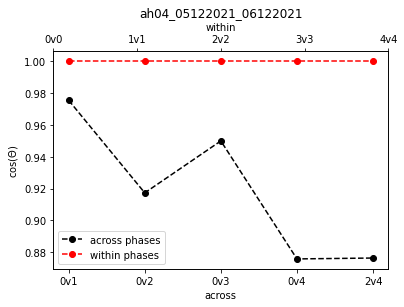

In [556]:
if phase_partitions==5:
    fig, ax = plt.subplots()

    ax.plot(angles_across, linestyle='--', marker='o', color='k', label='across phases')
    ax.plot(angles_self, linestyle='--', marker='o', color='r', label='within phases')
    plt.ylabel(r"$\cos({\Theta})$")
    plt.xlabel('across')
    plt.legend()

    plt.xticks(ticks = [0,1,2, 3, 4], labels=['0v1','0v2','0v3','0v4','2v4'])
    plt.title(mouse_recday)
    ax2 = ax.twiny()

    # Define the positions and labels for the second set of x-ticks
    new_xticks_positions = [0, 1, 2, 3, 4]
    new_xticks_labels = ['0v0', '1v1', '2v2', '3v3', '4v4']

    # Set the positions of the second x-axis ticks
    ax2.set_xticks(new_xticks_positions)

    # Set the labels for the second x-axis ticks
    ax2.set_xticklabels(new_xticks_labels)

    # Set the label for the second x-axis
    ax2.set_xlabel('within')


if phase_partitions ==3:
    fig, ax = plt.subplots()

    ax.plot(angles_across, linestyle='--', marker='o', color='k', label='across phases')
    ax.plot(angles_self, linestyle='--', marker='o', color='r', label='within phases')
    plt.ylabel(r"$\cos({\Theta})$")
    plt.xlabel('across')
    plt.legend()

    plt.xticks(ticks = [0,1,2], labels=['0v1',  '0v2', '1 v 2'])
    plt.title(mouse_recday)
    ax2 = ax.twiny()

    # Define the positions and labels for the second set of x-ticks
    new_xticks_positions = [0, 1, 2]
    new_xticks_labels = ['0v0', '1v1', '2v2']

    # Set the positions of the second x-axis ticks
    ax2.set_xticks(new_xticks_positions)

    # Set the labels for the second x-axis ticks
    ax2.set_xticklabels(new_xticks_labels)

    # Set the label for the second x-axis
    ax2.set_xlabel('within')


In [571]:
XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')

In [583]:
def smooth_and_calculate_scalar_derivatives(data_matrix, sigma=3, dt=1.0):
    # Assuming data_matrix is an nx2 array with x and y positions

    # Separate x and y columns
    x_positions = data_matrix[:, 0]
    y_positions = data_matrix[:, 1]

    # Smooth the data using 1D Gaussian filter
    x_smoothed = gaussian_filter1d(x_positions, sigma=sigma)
    y_smoothed = gaussian_filter1d(y_positions, sigma=sigma)

    
    # Calculate speeds (first derivative) and magnitudes
    vx = np.gradient(x_smoothed, dt)
    vy = np.gradient(y_smoothed, dt)
    speed = np.sqrt(vx**2 + vy**2)

    # calculate acceleration
    acceleration = np.gradient(speed, dt)
    # Combine results into a single array
    smoothed_data = np.column_stack((x_smoothed, y_smoothed, speed, acceleration, distance))

    return smoothed_data

XY_processed = smooth_and_calculate_scalar_derivatives(XY_raw, sigma=5
                                                      )

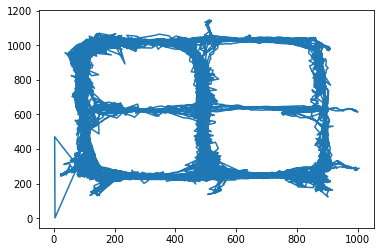

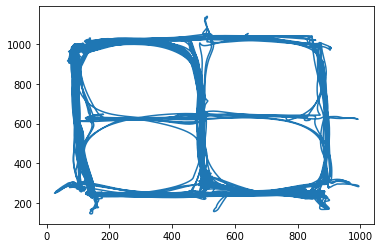

In [584]:
plt.plot(XY_raw[:,1], XY_raw[:,0])
plt.show()
plt.plot(XY_processed[:,1],XY_processed[:,0])
plt.show()


/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


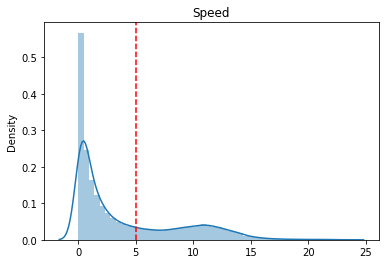

/Users/AdamHarris/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


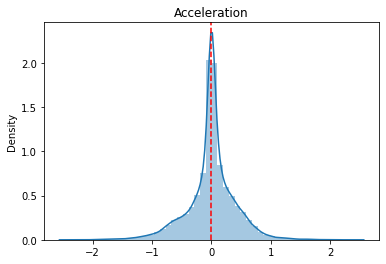

In [642]:
speed = XY_processed[:,2]
acceleration = XY_processed[:,3]
sns.distplot(speed)
plt.axvline(x=5, color='red', linestyle='--', label='thresh')
plt.title('Speed')
plt.show()
sns.distplot(acceleration)
plt.title('Acceleration')
plt.axvline(x=0, color='red', linestyle='--', label='thresh')
plt.show()

In [720]:
# sessions, Tasks = get_sessions(mouse_recday)
phase_partitions = 5
downsample_factor=5
speed_threshold = 5
acceleration_threshold = 0
phase_type = 'distance'   #distance or time
conf_group='acceleration+'   # speed+ speed-  acceleration+  acceleraion -

for counter, session in enumerate(sessions):
    
    task = Tasks[session]
    
    Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
    Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')
    
    XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')
    XY_processed = smooth_and_calculate_scalar_derivatives(XY_raw, sigma=5)
    speed = XY_processed[:,2]
    acceleration = XY_processed[:,3]

    Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
    #data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')
    
    # downsample neurons and locations
    Neuron_raw_downsampled=average_over_factor(Neuron_raw, downsample_factor)
    Location_raw_downsampled=sample_every_nth(Location_raw, downsample_factor)
    speed_downsampled = average_over_factor_1d(speed, downsample_factor)
    acceleration_downsampled = average_over_factor_1d(acceleration, downsample_factor)
    #use trial_times to get phase labels
    Trial_times_sr_adj = (Trial_times/25).astype(int)
    
    
    for trial_num, trial in enumerate(Trial_times_sr_adj):
        for state, _ in enumerate(trial[:-1]):
            
            state_length = trial[state+1]-trial[state]
            
            if phase_type=='time':
                phase_length = math.floor(state_length/phase_partitions)

                if phase_partitions==3:
                    phase_state = np.hstack((np.repeat(0, phase_length), 
                                            np.repeat(1, phase_length),
                                            np.repeat(2, phase_length)))
                if phase_partitions ==5:
                    phase_state = np.hstack((np.repeat(0, phase_length), 
                                            np.repeat(1, phase_length),
                                            np.repeat(2, phase_length),
                                            np.repeat(3, phase_length),
                                            np.repeat(4, phase_length)))
                
                error=state_length-phase_partitions*phase_length
                error_add_on = np.repeat(phase_partitions-1, error)
                phase_state=np.hstack((phase_state, error_add_on))
                
                
            if phase_type=='distance':
                
                movements_state = speed[trial[state]:trial[state+1]]
                cumulative_distance = np.cumsum(movements_state)
                max_distance = cumulative_distance[-1]
                distance_proportion = cumulative_distance/max_distance
                phase_dist_ = math.floor(1/phase_partitions)
                phase_thresholds = np.linspace(0, 1, num=phase_partitions+1, endpoint=True)
                phase_state = np.digitize(distance_proportion, phase_thresholds, right=True)
                phase_state = phase_state-1

            
            if state==0:
                phase_trial = phase_state
            else:
                phase_trial = np.hstack((phase_trial, phase_state))
                
        if trial_num==0:
            phase_session = phase_trial
        else:
            phase_session = np.hstack((phase_session, phase_trial))
            

    
    Phase_raw_downsampled=sample_every_nth(phase_session, downsample_factor)
    print('_____________________________________')
    print(f'Bin_counts: neurons {Neuron_raw_downsampled.shape[1]}, \n'
            f'loctions {len(Location_raw_downsampled)}, \n'
            f'phases {len(Phase_raw_downsampled)}')
            
    min_ind = min(Neuron_raw_downsampled.shape[1], 
                  len(Location_raw_downsampled), 
                  len(Phase_raw_downsampled),
                  len(speed_downsampled),
                  len(acceleration_downsampled))
    
    
    #make sure all the arrays are the same length
    
    Neuron_raw_downsampled = Neuron_raw_downsampled[:,:min_ind]
    Location_raw_downsampled = Location_raw_downsampled[:min_ind]
    Phase_raw_downsampled = Phase_raw_downsampled[:min_ind]
    speed_downsampled = speed_downsampled[:min_ind]
    acceleration_downsampled = acceleration_downsampled[:min_ind]
    
    
    
    # remove bins where the mouse is on an edge not a node
    mask=Location_raw_downsampled<10
    
    Phase_downsampled_nodes_only = Phase_raw_downsampled[mask]
    Location_downsampled_nodes_only = Location_raw_downsampled[mask]
    Neuron_downsampled_nodes_only = Neuron_raw_downsampled[:,mask]
    speed_downsampled_nodes_only = speed_downsampled[mask]
    acceleration_downsampled_nodes_only = acceleration_downsampled[mask]
    
    if conf_group!=[]:
        if conf_group not in ['speed+', 'speed-', 'acceleration+', 'acceleration-']:
            raise ValueError('not a valid confound group')
        else:
            if conf_group=='speed+':
                mask2 = speed_downsampled_nodes_only>speed_threshold
            if conf_group=='speed-':
                mask2 = speed_downsampled_nodes_only<speed_threshold
            if conf_group=='acceleration+':
                mask2 = acceleration_downsampled_nodes_only>acceleration_threshold
            if conf_group=='acceleration-':
                mask2 = acceleration_downsampled_nodes_only<acceleration_threshold
        
            Phase_downsampled_nodes_only = Phase_downsampled_nodes_only[mask2]
            Location_downsampled_nodes_only = Location_downsampled_nodes_only[mask2]
            Neuron_downsampled_nodes_only = Neuron_downsampled_nodes_only[:,mask2]
            speed_downsampled_nodes_only = speed_downsampled_nodes_only[mask2]
            acceleration_downsampled_nodes_only = acceleration_downsampled_nodes_only[mask2]
    
    print('-  -  -  -  -  -  -  -  -  -  -  -  - ')
    
    print('Removed bins where animal is on edge not node')
    
    print(f'Bin_counts: neurons {Neuron_downsampled_nodes_only.shape[1]}, \n'
            f'loctions {len(Location_downsampled_nodes_only)}, \n'
            f'phases {len(Phase_downsampled_nodes_only)}')
    
   
    
    #initialise data arrays
    if counter == 0:
        Neuron_array = Neuron_downsampled_nodes_only
        Location_array = Location_downsampled_nodes_only
        Phase_array = Phase_downsampled_nodes_only
    else:
        Neuron_array = np.hstack((Neuron_array, Neuron_downsampled_nodes_only))
        Location_array = np.hstack((Location_array, Location_downsampled_nodes_only)).astype(int)
        Phase_array = np.hstack((Phase_array, Phase_downsampled_nodes_only))

_____________________________________
Bin_counts: neurons 9051, 
loctions 9051, 
phases 9050
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 4104, 
loctions 4104, 
phases 4104
_____________________________________
Bin_counts: neurons 8452, 
loctions 8452, 
phases 8452
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3891, 
loctions 3891, 
phases 3891
_____________________________________
Bin_counts: neurons 6968, 
loctions 6968, 
phases 6967
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3167, 
loctions 3167, 
phases 3167
_____________________________________
Bin_counts: neurons 8606, 
loctions 8606, 
phases 8605
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3881, 
loctions 3881, 
phases 3881
_____________________________________
Bin_counts: neurons 5336, 
loc

In [96]:
Neuron_array

array([[0. , 0. , 0.1, ..., 0.8, 0.1, 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       ...,
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0.2, 0.2, 0. , ..., 0. , 0.1, 0. ]])

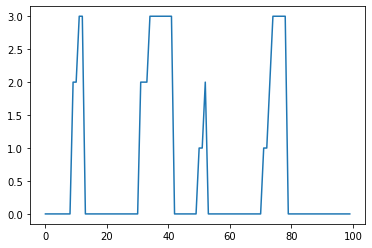

In [721]:
plt.plot(Phase_array[:100])

In [722]:
Location_array.shape

(25064,)

In [723]:
Phase_array.shape

(25064,)

In [724]:
from tqdm import tqdm
one_hot_all = []
for i,j in tqdm(zip(Location_array, Phase_array)):
    one_hot = np.zeros((phase_partitions, max(Location_array.astype(int))))
    one_hot[j,i-1]=1
#     one_hot = np.zeros((max(Location_array.astype(int)),))
#     one_hot[i-1]=1
    one_hot_all.append(one_hot.flatten())
    
one_hot_all = np.array(one_hot_all)

25064it [00:34, 728.42it/s]


In [725]:
one_hot_all.shape

(25064, 45)

In [726]:
NUM_ITERS = 50
NUM_NEURONS = Neuron_array.shape[0]
NUM_REGRESSORS = np.array(one_hot_all).shape[1]
LASSO_PARAM = 0.00005

for iteration in tqdm(range(NUM_ITERS)):
    
    split_1_mask = np.random.choice([0, 1], size=(len(Location_array),), p=[0.5, 0.5]).astype(bool)
    split_2_mask = ~split_1_mask
    
    betas_array_1 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    betas_array_2 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    
    for neuron, activity_array in enumerate(Neuron_array):
        
        activity_array_split_1 = activity_array[split_1_mask]
        activity_array_split_2 = activity_array[split_2_mask]
        
        one_hot_all_split_1 = one_hot_all[split_1_mask, :]
        one_hot_all_split_2 = one_hot_all[split_2_mask, :]
        
        lasso_1 = Lasso(alpha = LASSO_PARAM)
        lasso_1.fit(one_hot_all_split_1, activity_array_split_1)
        betas_1 = lasso_1.coef_
        
        lasso_2 = Lasso(alpha = LASSO_PARAM)
        lasso_2.fit(one_hot_all_split_2, activity_array_split_2)
        betas_2 = lasso_2.coef_
        
        betas_array_1[neuron,:]=betas_1
        betas_array_2[neuron,:]=betas_2
        
        
    if iteration==0:
        stacked_betas = np.stack((betas_array_1, betas_array_2))
    else:
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_1, axis=0)), axis=0)
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_2, axis=0)), axis=0)
        
        
num_stacks_in_split = math.floor(stacked_betas.shape[0]/2)

stack_split_1 = stacked_betas[:num_stacks_in_split,:,:]
stack_split_2 = stacked_betas[num_stacks_in_split:,:,:]

mean_betas_1 = np.nanmean(stack_split_1, axis=0)
mean_betas_2 = np.nanmean(stack_split_2, axis=0)


row_means_1 = np.mean(mean_betas_1, axis=1, keepdims=True)
row_means_2 = np.mean(mean_betas_2, axis=1, keepdims=True)

centred_betas_1 = mean_betas_1 - row_means_1
centred_betas_2 = mean_betas_2 - row_means_2
        

100%|██████████| 50/50 [02:25<00:00,  2.92s/it]


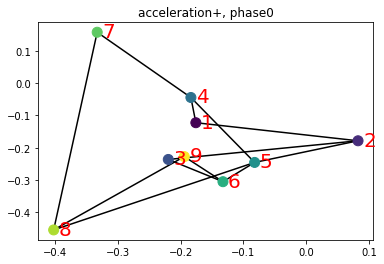

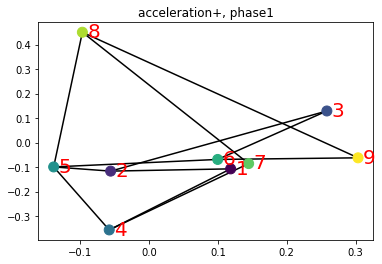

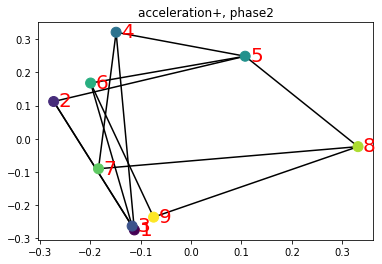

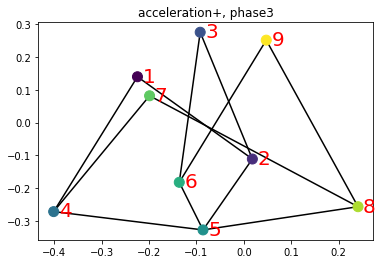

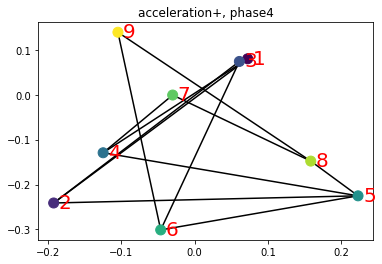

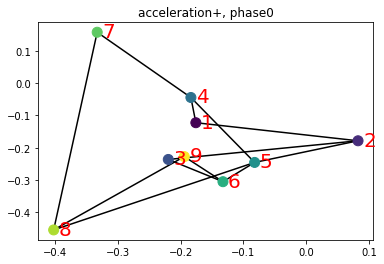

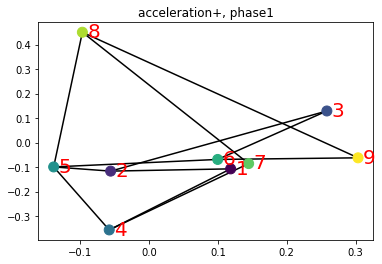

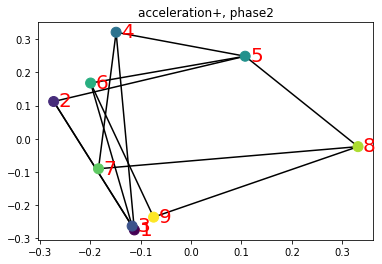

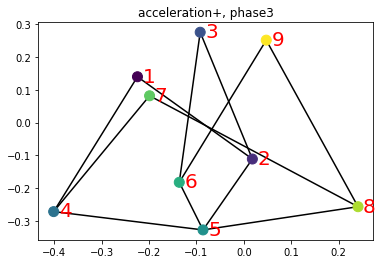

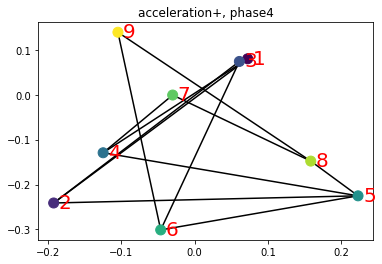

In [727]:
num_locs = max(Location_array)


if phase_partitions==5:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }

if phase_partitions==3:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
    }


centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_1
}
for stack in range(2):
    for i in range(phase_partitions):
        ind1 = i * num_locs
        ind2 = i*num_locs+num_locs
        phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
        phase_specific_betas_dic[i].append(phase_specific_betas)
        pca_phase = PCA(n_components=3)
        pca_phase.fit(phase_specific_betas)
        subspace_vectors = pca_phase.components_
        
        phase_planes_dic[i].append(subspace_vectors)
    
        projection = phase_specific_betas.dot(subspace_vectors.T)
#         ax = plt.figure().add_subplot(projection='3d')
#         for connection in connections:
#             y = projection[connection[0],1], projection[connection[1],1]
#             x = projection[connection[0],0], projection[connection[1],0]
#             z = projection[connection[0],2], projection[connection[1],2]
#             ax.plot(y,x,z, color='k')
        
#         ax.scatter(projection[:,1], projection[:,0], projection[:,2], 
#                    c=list(range(len(projection[:,1]))),
#                    s=100, zorder=4)
        
#         node_labels = list(range(1,len(projection[:,1])+1))
                           
# #         for label, x_point, y_point, z_point in zip(node_labels, projection[:,1], projection[:,0]):
# #             ax.annotate(label,
# #                         xy=(x_point, y_point),
# #                         xytext=(5, -5),
# #                         textcoords='offset points',
# #                        zorder=5,
# #                        color='r',
# #                        size=20)

#         ax.set_title(f'phase = {i}')
    
        ax = plt.figure().add_subplot()
        for connection in connections:
            y = projection[connection[0],1], projection[connection[1],1]
            x = projection[connection[0],0], projection[connection[1],0]
           
            ax.plot(y,x, color='k')
        
        ax.scatter(projection[:,1], projection[:,0],
                   c=list(range(len(projection[:,1]))),
                   s=100, zorder=4)
        
        node_labels = list(range(1,len(projection[:,1])+1))
                           
        for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
            ax.annotate(label,
                        xy=(x_point, y_point),
                        xytext=(5, -5),
                        textcoords='offset points',
                       zorder=5,
                       color='r',
                       size=20)

        ax.set_title(f'{conf_group}, phase{i}')
        
        
        
    

In [684]:
NUM_ITERS = 50
NUM_NEURONS = Neuron_array.shape[0]
NUM_REGRESSORS = np.array(one_hot_all).shape[1]
LASSO_PARAM = 0.00005

for iteration in tqdm(range(NUM_ITERS)):
    
    split_1_mask = np.random.choice([0, 1], size=(len(Location_array),), p=[0.5, 0.5]).astype(bool)
    split_2_mask = ~split_1_mask
    
    betas_array_1 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    betas_array_2 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    
    for neuron, activity_array in enumerate(Neuron_array):
        
        activity_array_split_1 = activity_array[split_1_mask]
        activity_array_split_2 = activity_array[split_2_mask]
        
        one_hot_all_split_1 = one_hot_all[split_1_mask, :]
        one_hot_all_split_2 = one_hot_all[split_2_mask, :]
        
        lasso_1 = Lasso(alpha = LASSO_PARAM)
        lasso_1.fit(one_hot_all_split_1, activity_array_split_1)
        betas_1 = lasso_1.coef_
        
        lasso_2 = Lasso(alpha = LASSO_PARAM)
        lasso_2.fit(one_hot_all_split_2, activity_array_split_2)
        betas_2 = lasso_2.coef_
        
        betas_array_1[neuron,:]=betas_1
        betas_array_2[neuron,:]=betas_2
        
        
    if iteration==0:
        stacked_betas = np.stack((betas_array_1, betas_array_2))
    else:
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_1, axis=0)), axis=0)
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_2, axis=0)), axis=0)
        
        
num_stacks_in_split = math.floor(stacked_betas.shape[0]/2)

stack_split_1 = stacked_betas[:num_stacks_in_split,:,:]
stack_split_2 = stacked_betas[num_stacks_in_split:,:,:]

mean_betas_1 = np.nanmean(stack_split_1, axis=0)
mean_betas_2 = np.nanmean(stack_split_2, axis=0)


row_means_1 = np.mean(mean_betas_1, axis=1, keepdims=True)
row_means_2 = np.mean(mean_betas_2, axis=1, keepdims=True)

centred_betas_1 = mean_betas_1 - row_means_1
centred_betas_2 = mean_betas_2 - row_means_2
        

100%|██████████| 50/50 [03:30<00:00,  4.21s/it]


In [685]:
centred_betas_1.shape

(114, 45)

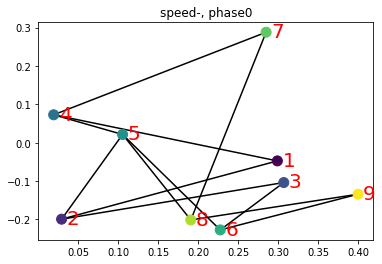

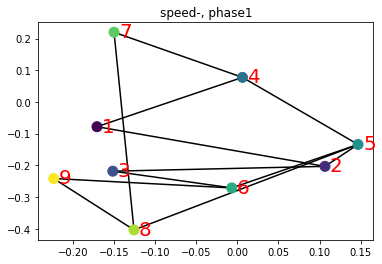

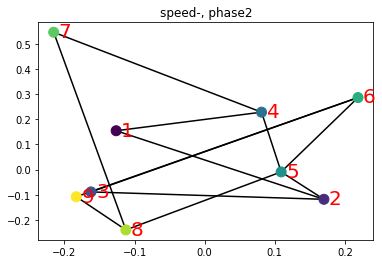

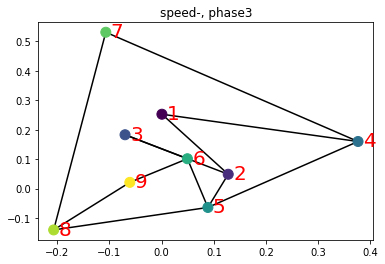

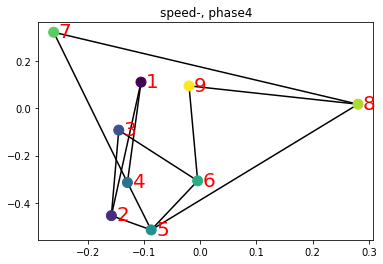

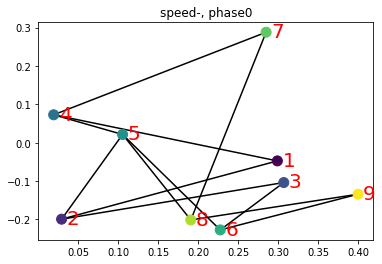

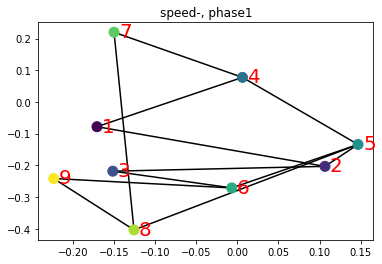

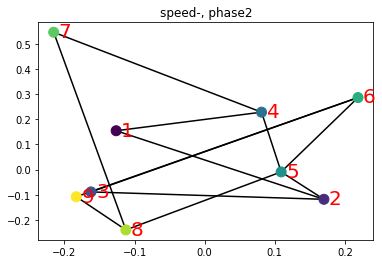

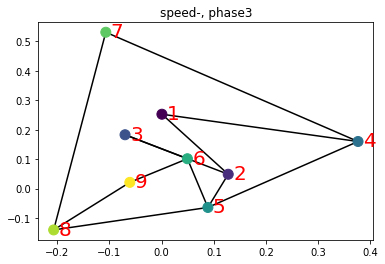

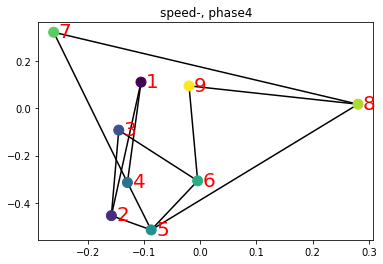

In [686]:
num_locs = max(Location_array)


if phase_partitions==5:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }

if phase_partitions==3:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
    }


centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_1
}
for stack in range(2):
    for i in range(phase_partitions):
        ind1 = i * num_locs
        ind2 = i*num_locs+num_locs
        phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
        phase_specific_betas_dic[i].append(phase_specific_betas)
        pca_phase = PCA(n_components=3)
        pca_phase.fit(phase_specific_betas)
        subspace_vectors = pca_phase.components_
        
        phase_planes_dic[i].append(subspace_vectors)
    
        projection = phase_specific_betas.dot(subspace_vectors.T)
#         ax = plt.figure().add_subplot(projection='3d')
#         for connection in connections:
#             y = projection[connection[0],1], projection[connection[1],1]
#             x = projection[connection[0],0], projection[connection[1],0]
#             z = projection[connection[0],2], projection[connection[1],2]
#             ax.plot(y,x,z, color='k')
        
#         ax.scatter(projection[:,1], projection[:,0], projection[:,2], 
#                    c=list(range(len(projection[:,1]))),
#                    s=100, zorder=4)
        
#         node_labels = list(range(1,len(projection[:,1])+1))
                           
# #         for label, x_point, y_point, z_point in zip(node_labels, projection[:,1], projection[:,0]):
# #             ax.annotate(label,
# #                         xy=(x_point, y_point),
# #                         xytext=(5, -5),
# #                         textcoords='offset points',
# #                        zorder=5,
# #                        color='r',
# #                        size=20)

#         ax.set_title(f'phase = {i}')
    
        ax = plt.figure().add_subplot()
        for connection in connections:
            y = projection[connection[0],1], projection[connection[1],1]
            x = projection[connection[0],0], projection[connection[1],0]
           
            ax.plot(y,x, color='k')
        
        ax.scatter(projection[:,1], projection[:,0],
                   c=list(range(len(projection[:,1]))),
                   s=100, zorder=4)
        
        node_labels = list(range(1,len(projection[:,1])+1))
                           
        for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
            ax.annotate(label,
                        xy=(x_point, y_point),
                        xytext=(5, -5),
                        textcoords='offset points',
                       zorder=5,
                       color='r',
                       size=20)

        ax.set_title(f'{conf_group}, phase{i}')
        
        
        
    

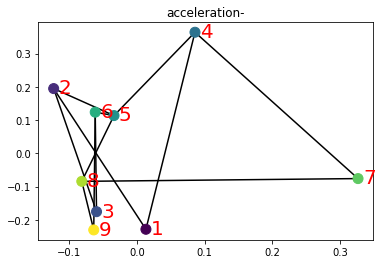

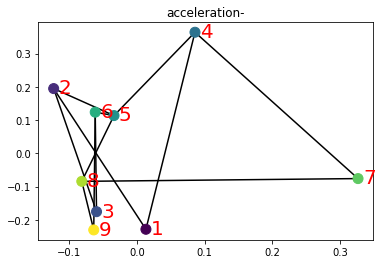

In [640]:
num_locs = max(Location_array)

centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_1
}
for stack in range(2):
    
    ind1 = i * num_locs
    ind2 = i*num_locs+num_locs
    phase_specific_betas = centred_betas_dic[stack]
    pca_phase = PCA(n_components=2)
    pca_phase.fit(phase_specific_betas.T)
    subspace_vectors = pca_phase.components_



    projection = phase_specific_betas.T.dot(subspace_vectors.T)

    ax = plt.figure().add_subplot()
    for connection in connections:
        y = projection[connection[0],1], projection[connection[1],1]
        x = projection[connection[0],0], projection[connection[1],0]

        ax.plot(y,x, color='k')

    ax.scatter(projection[:,1], projection[:,0],
               c=list(range(len(projection[:,1]))),
               s=100, zorder=4)

    node_labels = list(range(1,len(projection[:,1])+1))

    for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
        ax.annotate(label,
                    xy=(x_point, y_point),
                    xytext=(5, -5),
                    textcoords='offset points',
                   zorder=5,
                   color='r',
                   size=20)

    ax.set_title(conf_group)





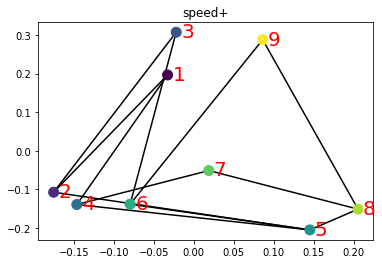

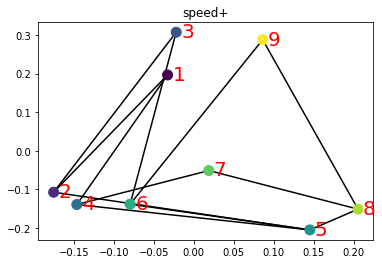

In [619]:
num_locs = max(Location_array)

centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_1
}
for stack in range(2):
    
    ind1 = i * num_locs
    ind2 = i*num_locs+num_locs
    phase_specific_betas = centred_betas_dic[stack]
    pca_phase = PCA(n_components=2)
    pca_phase.fit(phase_specific_betas.T)
    subspace_vectors = pca_phase.components_



    projection = phase_specific_betas.T.dot(subspace_vectors.T)

    ax = plt.figure().add_subplot()
    for connection in connections:
        y = projection[connection[0],1], projection[connection[1],1]
        x = projection[connection[0],0], projection[connection[1],0]

        ax.plot(y,x, color='k')

    ax.scatter(projection[:,1], projection[:,0],
               c=list(range(len(projection[:,1]))),
               s=100, zorder=4)

    node_labels = list(range(1,len(projection[:,1])+1))

    for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
        ax.annotate(label,
                    xy=(x_point, y_point),
                    xytext=(5, -5),
                    textcoords='offset points',
                   zorder=5,
                   color='r',
                   size=20)

    ax.set_title(conf_group)





In [615]:
phase_specific_betas.shape

(114, 9)

In [731]:
# sessions, Tasks = get_sessions(mouse_recday)
phase_partitions = 5
downsample_factor=5
speed_threshold = 5
acceleration_threshold = 0
phase_type = 'distance'   #distance or time
conf_group='none'   # speed+ speed-  acceleration+  acceleraion-  none

for counter, session in enumerate(sessions):
    
    task = Tasks[session]
    
    Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
    Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')
    
    XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')
    XY_processed = smooth_and_calculate_scalar_derivatives(XY_raw, sigma=5)
    speed = XY_processed[:,2]
    acceleration = XY_processed[:,3]

    Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
    #data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')
    
    # downsample neurons and locations
    Neuron_raw_downsampled=average_over_factor(Neuron_raw, downsample_factor)
    Location_raw_downsampled=sample_every_nth(Location_raw, downsample_factor)
    speed_downsampled = average_over_factor_1d(speed, downsample_factor)
    acceleration_downsampled = average_over_factor_1d(acceleration, downsample_factor)
    #use trial_times to get phase labels
    Trial_times_sr_adj = (Trial_times/25).astype(int)
    
    
    for trial_num, trial in enumerate(Trial_times_sr_adj):
        for state, _ in enumerate(trial[:-1]):
            
            state_length = trial[state+1]-trial[state]
            
            if phase_type=='time':
                phase_length = math.floor(state_length/phase_partitions)

                if phase_partitions==3:
                    phase_state = np.hstack((np.repeat(0, phase_length), 
                                            np.repeat(1, phase_length),
                                            np.repeat(2, phase_length)))
                if phase_partitions ==5:
                    phase_state = np.hstack((np.repeat(0, phase_length), 
                                            np.repeat(1, phase_length),
                                            np.repeat(2, phase_length),
                                            np.repeat(3, phase_length),
                                            np.repeat(4, phase_length)))
                
                error=state_length-phase_partitions*phase_length
                error_add_on = np.repeat(phase_partitions-1, error)
                phase_state=np.hstack((phase_state, error_add_on))
                
                
            if phase_type=='distance':
                
                movements_state = speed[trial[state]:trial[state+1]]
                cumulative_distance = np.cumsum(movements_state)
                max_distance = cumulative_distance[-1]
                distance_proportion = cumulative_distance/max_distance
                phase_dist_ = math.floor(1/phase_partitions)
                phase_thresholds = np.linspace(0, 1, num=phase_partitions+1, endpoint=True)
                phase_state = np.digitize(distance_proportion, phase_thresholds, right=True)
                phase_state = phase_state-1

            
            if state==0:
                phase_trial = phase_state
            else:
                phase_trial = np.hstack((phase_trial, phase_state))
                
        if trial_num==0:
            phase_session = phase_trial
        else:
            phase_session = np.hstack((phase_session, phase_trial))
            

    
    Phase_raw_downsampled=sample_every_nth(phase_session, downsample_factor)
    print('_____________________________________')
    print(f'Bin_counts: neurons {Neuron_raw_downsampled.shape[1]}, \n'
            f'loctions {len(Location_raw_downsampled)}, \n'
            f'phases {len(Phase_raw_downsampled)}')
            
    min_ind = min(Neuron_raw_downsampled.shape[1], 
                  len(Location_raw_downsampled), 
                  len(Phase_raw_downsampled),
                  len(speed_downsampled),
                  len(acceleration_downsampled))
    
    
    #make sure all the arrays are the same length
    
    Neuron_raw_downsampled = Neuron_raw_downsampled[:,:min_ind]
    Location_raw_downsampled = Location_raw_downsampled[:min_ind]
    Phase_raw_downsampled = Phase_raw_downsampled[:min_ind]
    speed_downsampled = speed_downsampled[:min_ind]
    acceleration_downsampled = acceleration_downsampled[:min_ind]
    
    
    
    # remove bins where the mouse is on an edge not a node
    mask=Location_raw_downsampled<10
    
    Phase_downsampled_nodes_only = Phase_raw_downsampled[mask]
    Location_downsampled_nodes_only = Location_raw_downsampled[mask]
    Neuron_downsampled_nodes_only = Neuron_raw_downsampled[:,mask]
    speed_downsampled_nodes_only = speed_downsampled[mask]
    acceleration_downsampled_nodes_only = acceleration_downsampled[mask]
    
    if conf_group!=[]:
        if conf_group!='none':
            if conf_group not in ['speed+', 'speed-', 'acceleration+', 'acceleration-']:
                raise ValueError('not a valid confound group')
          
            if conf_group=='speed+':
                mask2 = speed_downsampled_nodes_only>speed_threshold
            if conf_group=='speed-':
                mask2 = speed_downsampled_nodes_only<speed_threshold
            if conf_group=='acceleration+':
                mask2 = acceleration_downsampled_nodes_only>acceleration_threshold
            if conf_group=='acceleration-':
                mask2 = acceleration_downsampled_nodes_only<acceleration_threshold

        
            Phase_downsampled_nodes_only = Phase_downsampled_nodes_only[mask2]
            Location_downsampled_nodes_only = Location_downsampled_nodes_only[mask2]
            Neuron_downsampled_nodes_only = Neuron_downsampled_nodes_only[:,mask2]
            speed_downsampled_nodes_only = speed_downsampled_nodes_only[mask2]
            acceleration_downsampled_nodes_only = acceleration_downsampled_nodes_only[mask2]
    
    print('-  -  -  -  -  -  -  -  -  -  -  -  - ')
    
    print('Removed bins where animal is on edge not node')
    
    print(f'Bin_counts: neurons {Neuron_downsampled_nodes_only.shape[1]}, \n'
            f'loctions {len(Location_downsampled_nodes_only)}, \n'
            f'phases {len(Phase_downsampled_nodes_only)}')
    
   
    
    #initialise data arrays
    if counter == 0:
        Neuron_array = Neuron_downsampled_nodes_only
        Location_array = Location_downsampled_nodes_only
        Phase_array = Phase_downsampled_nodes_only
    else:
        Neuron_array = np.hstack((Neuron_array, Neuron_downsampled_nodes_only))
        Location_array = np.hstack((Location_array, Location_downsampled_nodes_only)).astype(int)
        Phase_array = np.hstack((Phase_array, Phase_downsampled_nodes_only))

_____________________________________
Bin_counts: neurons 9051, 
loctions 9051, 
phases 9050
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 7560, 
loctions 7560, 
phases 7560
_____________________________________
Bin_counts: neurons 8452, 
loctions 8452, 
phases 8452
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 6979, 
loctions 6979, 
phases 6979
_____________________________________
Bin_counts: neurons 6968, 
loctions 6968, 
phases 6967
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 5879, 
loctions 5879, 
phases 5879
_____________________________________
Bin_counts: neurons 8606, 
loctions 8606, 
phases 8605
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 7231, 
loctions 7231, 
phases 7231
_____________________________________
Bin_counts: neurons 5336, 
loc

In [732]:
from tqdm import tqdm
one_hot_all = []
for i,j in tqdm(zip(Location_array, Phase_array)):
    one_hot = np.zeros((phase_partitions, max(Location_array.astype(int))))
    one_hot[j,i-1]=1
#     one_hot = np.zeros((max(Location_array.astype(int)),))
#     one_hot[i-1]=1
    one_hot_all.append(one_hot.flatten())
    
one_hot_all = np.array(one_hot_all)

46233it [01:54, 404.63it/s]


In [733]:
NUM_ITERS = 50
NUM_NEURONS = Neuron_array.shape[0]
NUM_REGRESSORS = np.array(one_hot_all).shape[1]
LASSO_PARAM = 0.00005

for iteration in tqdm(range(NUM_ITERS)):
    
    split_1_mask = np.random.choice([0, 1], size=(len(Location_array),), p=[0.5, 0.5]).astype(bool)
    split_2_mask = ~split_1_mask
    
    betas_array_1 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    betas_array_2 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    
    for neuron, activity_array in enumerate(Neuron_array):
        
        activity_array_split_1 = activity_array[split_1_mask]
        activity_array_split_2 = activity_array[split_2_mask]
        
        one_hot_all_split_1 = one_hot_all[split_1_mask, :]
        one_hot_all_split_2 = one_hot_all[split_2_mask, :]
        
        lasso_1 = Lasso(alpha = LASSO_PARAM)
        lasso_1.fit(one_hot_all_split_1, activity_array_split_1)
        betas_1 = lasso_1.coef_
        
        lasso_2 = Lasso(alpha = LASSO_PARAM)
        lasso_2.fit(one_hot_all_split_2, activity_array_split_2)
        betas_2 = lasso_2.coef_
        
        betas_array_1[neuron,:]=betas_1
        betas_array_2[neuron,:]=betas_2
        
        
    if iteration==0:
        stacked_betas = np.stack((betas_array_1, betas_array_2))
    else:
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_1, axis=0)), axis=0)
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_2, axis=0)), axis=0)
        
        
num_stacks_in_split = math.floor(stacked_betas.shape[0]/2)

stack_split_1 = stacked_betas[:num_stacks_in_split,:,:]
stack_split_2 = stacked_betas[num_stacks_in_split:,:,:]

mean_betas_1 = np.nanmean(stack_split_1, axis=0)
mean_betas_2 = np.nanmean(stack_split_2, axis=0)


row_means_1 = np.mean(mean_betas_1, axis=1, keepdims=True)
row_means_2 = np.mean(mean_betas_2, axis=1, keepdims=True)

centred_betas_1 = mean_betas_1 - row_means_1
centred_betas_2 = mean_betas_2 - row_means_2
        

100%|██████████| 50/50 [05:07<00:00,  6.16s/it]


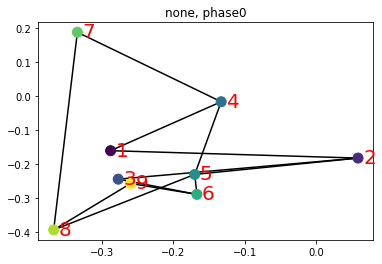

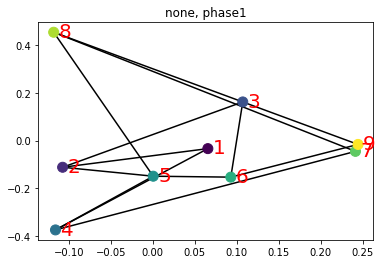

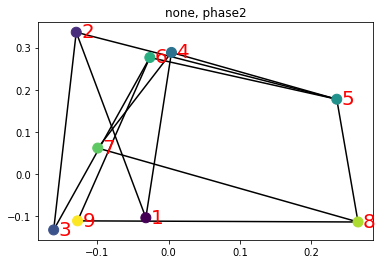

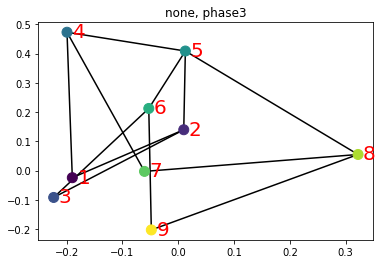

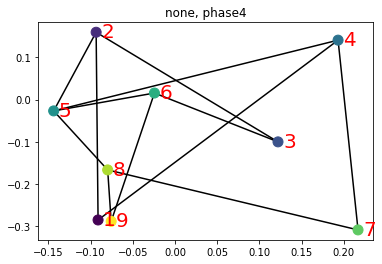

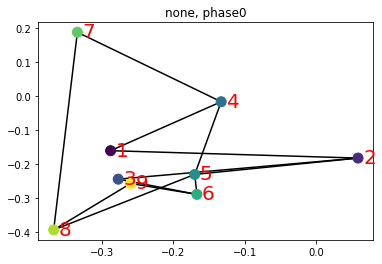

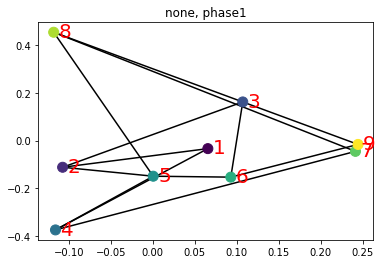

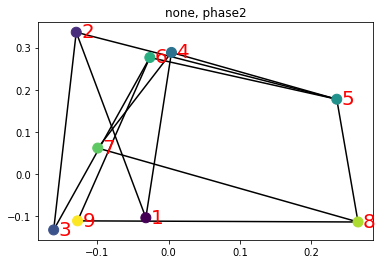

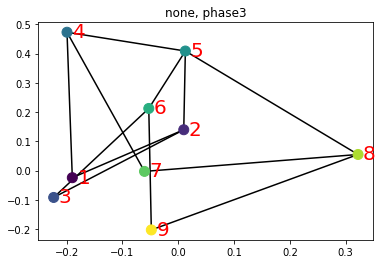

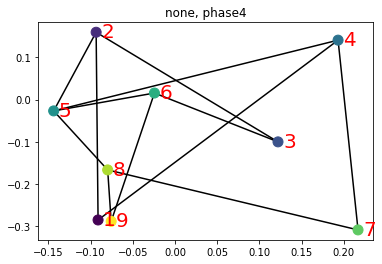

In [734]:
num_locs = max(Location_array)


if phase_partitions==5:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }

if phase_partitions==3:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
    }


centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_1
}
for stack in range(2):
    for i in range(phase_partitions):
        ind1 = i * num_locs
        ind2 = i*num_locs+num_locs
        phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
        phase_specific_betas_dic[i].append(phase_specific_betas)
        pca_phase = PCA(n_components=3)
        pca_phase.fit(phase_specific_betas)
        subspace_vectors = pca_phase.components_
        
        phase_planes_dic[i].append(subspace_vectors)
    
        projection = phase_specific_betas.dot(subspace_vectors.T)
#         ax = plt.figure().add_subplot(projection='3d')
#         for connection in connections:
#             y = projection[connection[0],1], projection[connection[1],1]
#             x = projection[connection[0],0], projection[connection[1],0]
#             z = projection[connection[0],2], projection[connection[1],2]
#             ax.plot(y,x,z, color='k')
        
#         ax.scatter(projection[:,1], projection[:,0], projection[:,2], 
#                    c=list(range(len(projection[:,1]))),
#                    s=100, zorder=4)
        
#         node_labels = list(range(1,len(projection[:,1])+1))
                           
# #         for label, x_point, y_point, z_point in zip(node_labels, projection[:,1], projection[:,0]):
# #             ax.annotate(label,
# #                         xy=(x_point, y_point),
# #                         xytext=(5, -5),
# #                         textcoords='offset points',
# #                        zorder=5,
# #                        color='r',
# #                        size=20)

#         ax.set_title(f'phase = {i}')
    
        ax = plt.figure().add_subplot()
        for connection in connections:
            y = projection[connection[0],1], projection[connection[1],1]
            x = projection[connection[0],0], projection[connection[1],0]
           
            ax.plot(y,x, color='k')
        
        ax.scatter(projection[:,1], projection[:,0],
                   c=list(range(len(projection[:,1]))),
                   s=100, zorder=4)
        
        node_labels = list(range(1,len(projection[:,1])+1))
                           
        for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
            ax.annotate(label,
                        xy=(x_point, y_point),
                        xytext=(5, -5),
                        textcoords='offset points',
                       zorder=5,
                       color='r',
                       size=20)

        ax.set_title(f'{conf_group}, phase{i}')
        
        
        
    

In [740]:
#### self_comps  
angles_self = []
for i in phase_planes_dic:
    plane1 = phase_planes_dic[i][0]
    plane2 = phase_planes_dic[i][1]
    outer_product = plane1.dot(plane2.T)
    U, S, Vt = np.linalg.svd(outer_product, full_matrices=True)
    principal_angle = S[0]
    angles_self.append(principal_angle) 
    
angles_across = []

if phase_partitions ==3:
    comps =[[0,1],
            [0,2],
            [1,2]]

if phase_partitions ==5:
    comps =[[0,1],
            [0,2],
            [0,3],
            [0,4],
            [3,4]]

for comp in comps:
    plane1 = phase_planes_dic[comp[0]][0]
    plane2 = phase_planes_dic[comp[1]][1]
    outer_product = plane1.dot(plane2.T)
    U, S, Vt = np.linalg.svd(outer_product, full_matrices=True)
    principal_angle = S[0]
    angles_across.append(principal_angle) 

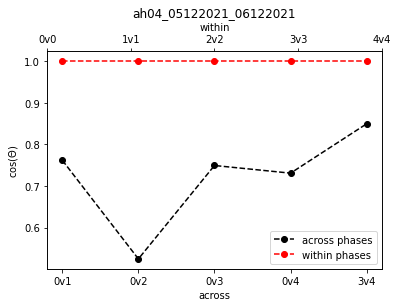

In [743]:
if phase_partitions==5:
    fig, ax = plt.subplots()

    ax.plot(angles_across, linestyle='--', marker='o', color='k', label='across phases')
    ax.plot(angles_self, linestyle='--', marker='o', color='r', label='within phases')
    plt.ylabel(r"$\cos({\Theta})$")
    plt.xlabel('across')
    plt.legend()

    plt.xticks(ticks = [0,1,2, 3, 4], labels=['0v1','0v2','0v3','0v4','3v4'])
    plt.title(mouse_recday)
    ax2 = ax.twiny()

    # Define the positions and labels for the second set of x-ticks
    new_xticks_positions = [0, 1, 2, 3, 4]
    new_xticks_labels = ['0v0', '1v1', '2v2', '3v3', '4v4']

    # Set the positions of the second x-axis ticks
    ax2.set_xticks(new_xticks_positions)

    # Set the labels for the second x-axis ticks
    ax2.set_xticklabels(new_xticks_labels)

    # Set the label for the second x-axis
    ax2.set_xlabel('within')


if phase_partitions ==3:
    fig, ax = plt.subplots()

    ax.plot(angles_across, linestyle='--', marker='o', color='k', label='across phases')
    ax.plot(angles_self, linestyle='--', marker='o', color='r', label='within phases')
    plt.ylabel(r"$\cos({\Theta})$")
    plt.xlabel('across')
    plt.legend()

    plt.xticks(ticks = [0,1,2], labels=['0v1',  '0v2', '1v2'])
    plt.title(mouse_recday)
    ax2 = ax.twiny()

    # Define the positions and labels for the second set of x-ticks
    new_xticks_positions = [0, 1, 2]
    new_xticks_labels = ['0v0', '1v1', '2v2']

    # Set the positions of the second x-axis ticks
    ax2.set_xticks(new_xticks_positions)

    # Set the labels for the second x-axis ticks
    ax2.set_xticklabels(new_xticks_labels)

    # Set the label for the second x-axis
    ax2.set_xlabel('within')


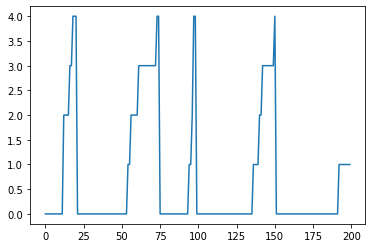

In [745]:
plt.plot(Phase_array[:200])

In [557]:
# sessions, Tasks = get_sessions(mouse_recday)
phase_partitions = 5
downsample_factor=10


for counter, session in enumerate(sessions):
    
    task = Tasks[session]
    Neuron_raw=np.load(Data_folder+'Neuron_raw_'+mouse_recday+'_'+str(session)+'.npy')
    Location_raw=np.load(Data_folder+'Location_raw_'+mouse_recday+'_'+str(session)+'.npy')
    XY_raw = np.load(Data_folder+'XY_raw_'+mouse_recday+'_'+str(session)+'.npy')
    Trial_times=np.load(Data_folder+'trialtimes_'+mouse_recday+'_'+str(session)+'.npy')
    #data_neurons=np.load(Data_folder+'Neuron_'+mouse_recday+'_'+str(session)+'.npy')
    
    # downsample neurons and locations
    Neuron_raw_downsampled=average_over_factor(Neuron_raw, downsample_factor)
    Location_raw_downsampled=sample_every_nth(Location_raw, downsample_factor)
    
    
    #use trial_times to get phase labels
    Trial_times_sr_adj = (Trial_times/25).astype(int)
    
    
    
    
    for trial_num, trial in enumerate(Trial_times_sr_adj):
        for state, _ in enumerate(trial[:-1]):
            
            state_length = trial[state+1]-trial[state]
            phase_length = math.floor(state_length/phase_partitions)
            
            if phase_partitions==3:
                phase_state = np.hstack((np.repeat(0, phase_length), 
                                        np.repeat(1, phase_length),
                                        np.repeat(2, phase_length)))
            if phase_partitions ==5:
                phase_state = np.hstack((np.repeat(0, phase_length), 
                                        np.repeat(1, phase_length),
                                        np.repeat(2, phase_length),
                                        np.repeat(3, phase_length),
                                        np.repeat(4, phase_length)))
            error=state_length-phase_partitions*phase_length
            error_add_on = np.repeat(phase_partitions-1, error)
            phase_state=np.hstack((phase_state, error_add_on))
            if state==0:
                phase_trial = phase_state
            else:
                phase_trial = np.hstack((phase_trial, phase_state))
                
        if trial_num==0:
            phase_session = phase_trial
        else:
            phase_session = np.hstack((phase_session, phase_trial))
            
            
            
            
#             for phase_discrete in range(phase_partitions):
#                 if phase_discrete+1==phase_partitions:
#                     phase_arr_[-phase_length:]=phase_discrete #used this to catch any bins left out by rounding errors
#                 else:
#                     phase_arr_[phase_discrete*phase_length:phase_discrete+1*phase_length]
            
#             if trial_num==0:
#                 phase_array_full_sess=phase_arr_
#             else:
#                 phase_array_full_sess=np.hstack((phase_array_full_sess, phase_arr_))
        
    
    Phase_raw_downsampled=sample_every_nth(phase_session, downsample_factor)
    print('_____________________________________')
    print(f'Bin_counts: neurons {Neuron_raw_downsampled.shape[1]}, \n'
            f'loctions {len(Location_raw_downsampled)}, \n'
            f'phases {len(Phase_raw_downsampled)}')
            
    min_ind = min(Neuron_raw_downsampled.shape[1], len(Location_raw_downsampled), len(Phase_raw_downsampled))
    Neuron_raw_downsampled = Neuron_raw_downsampled[:,:min_ind]
    Location_raw_downsampled = Location_raw_downsampled[:min_ind]
    Phase_raw_downsampled = Phase_raw_downsampled[:min_ind]

    
    mask=Location_raw_downsampled<10
    
    Phase_downsampled_nodes_only = Phase_raw_downsampled[mask]
    Location_downsampled_nodes_only = Location_raw_downsampled[mask]
    Neuron_downsampled_nodes_only = Neuron_raw_downsampled[:,mask]
    
    print('-  -  -  -  -  -  -  -  -  -  -  -  - ')
    
    print('Removed bins where animal is on edge not node')
    
    print(f'Bin_counts: neurons {Neuron_downsampled_nodes_only.shape[1]}, \n'
            f'loctions {len(Location_downsampled_nodes_only)}, \n'
            f'phases {len(Phase_downsampled_nodes_only)}')
    
   
    
    #initialise data arrays
    if counter == 0:
        Neuron_array = Neuron_downsampled_nodes_only
        Location_array = Location_downsampled_nodes_only
        Phase_array = Phase_downsampled_nodes_only
    else:
        Neuron_array = np.hstack((Neuron_array, Neuron_downsampled_nodes_only))
        Location_array = np.hstack((Location_array, Location_downsampled_nodes_only)).astype(int)
        Phase_array = np.hstack((Phase_array, Phase_downsampled_nodes_only))

_____________________________________
Bin_counts: neurons 4526, 
loctions 4526, 
phases 4525
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3781, 
loctions 3781, 
phases 3781
_____________________________________
Bin_counts: neurons 4226, 
loctions 4226, 
phases 4226
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3482, 
loctions 3482, 
phases 3482
_____________________________________
Bin_counts: neurons 3484, 
loctions 3484, 
phases 3484
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 2945, 
loctions 2945, 
phases 2945
_____________________________________
Bin_counts: neurons 4303, 
loctions 4303, 
phases 4303
-  -  -  -  -  -  -  -  -  -  -  -  - 
Removed bins where animal is on edge not node
Bin_counts: neurons 3629, 
loctions 3629, 
phases 3629
_____________________________________
Bin_counts: neurons 2668, 
loc

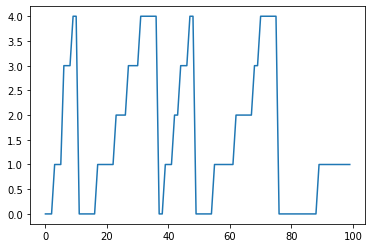

In [558]:
plt.plot(Phase_array[:100])

# regression subspace

- one-hot encode place-phases

- random half-half split of all data from double day

- Lasso regression of place phases onto fr for each neuron

- get place phase x neurons matrix of betas for each split and then stack

- repeat for 50 iterations (get 100 matrices)

- split the big stack in two sw we can do same vs same comparison

- split into phase-specific matrices

- PCA each phase

- project onto subspace plane (first two PCs)

- plot projection

- for each comparison, compute the outer matrix of condition1 subspace vectors against condition2 subspace vectors

- calculate principal angle between planes using singular value decomp on outer matric ( so you get U, S, Vt, take first element of S)




In [559]:
from tqdm import tqdm
one_hot_all = []
for i,j in tqdm(zip(Location_array, Phase_array)):
    one_hot = np.zeros((phase_partitions, max(Location_array.astype(int))))
    one_hot[j,i-1]=1
#     one_hot = np.zeros((max(Location_array.astype(int)),))
#     one_hot[i-1]=1
    one_hot_all.append(one_hot.flatten())
    
one_hot_all = np.array(one_hot_all)

23137it [00:29, 775.61it/s]


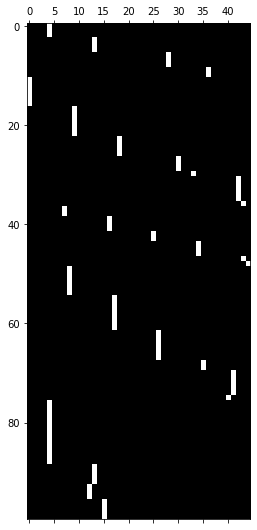

In [560]:
plt.matshow(one_hot_all[:100,:], cmap='gray')

In [561]:
NUM_ITERS = 50
NUM_NEURONS = Neuron_array.shape[0]
NUM_REGRESSORS = np.array(one_hot_all).shape[1]
LASSO_PARAM = 0.00005

for iteration in tqdm(range(NUM_ITERS)):
    
    split_1_mask = np.random.choice([0, 1], size=(len(Location_array),), p=[0.5, 0.5]).astype(bool)
    split_2_mask = ~split_1_mask
    
    betas_array_1 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    betas_array_2 = np.zeros((NUM_NEURONS, NUM_REGRESSORS))
    
    for neuron, activity_array in enumerate(Neuron_array):
        
        activity_array_split_1 = activity_array[split_1_mask]
        activity_array_split_2 = activity_array[split_2_mask]
        
        one_hot_all_split_1 = one_hot_all[split_1_mask, :]
        one_hot_all_split_2 = one_hot_all[split_2_mask, :]
        
        lasso_1 = Lasso(alpha = LASSO_PARAM)
        lasso_1.fit(one_hot_all_split_1, activity_array_split_1)
        betas_1 = lasso_1.coef_
        
        lasso_2 = Lasso(alpha = LASSO_PARAM)
        lasso_2.fit(one_hot_all_split_2, activity_array_split_2)
        betas_2 = lasso_2.coef_
        
        betas_array_1[neuron,:]=betas_1
        betas_array_2[neuron,:]=betas_2
        
        
    if iteration==0:
        stacked_betas = np.stack((betas_array_1, betas_array_2))
    else:
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_1, axis=0)), axis=0)
        stacked_betas = np.concatenate((stacked_betas, np.expand_dims(betas_array_2, axis=0)), axis=0)
        
        
num_stacks_in_split = math.floor(stacked_betas.shape[0]/2)

stack_split_1 = stacked_betas[:num_stacks_in_split,:,:]
stack_split_2 = stacked_betas[num_stacks_in_split:,:,:]

mean_betas_1 = np.nanmean(stack_split_1, axis=0)
mean_betas_2 = np.nanmean(stack_split_2, axis=0)


row_means_1 = np.mean(mean_betas_1, axis=1, keepdims=True)
row_means_2 = np.mean(mean_betas_2, axis=1, keepdims=True)

centred_betas_1 = mean_betas_1 - row_means_1
centred_betas_2 = mean_betas_2 - row_means_2
        

100%|██████████| 50/50 [03:02<00:00,  3.65s/it]


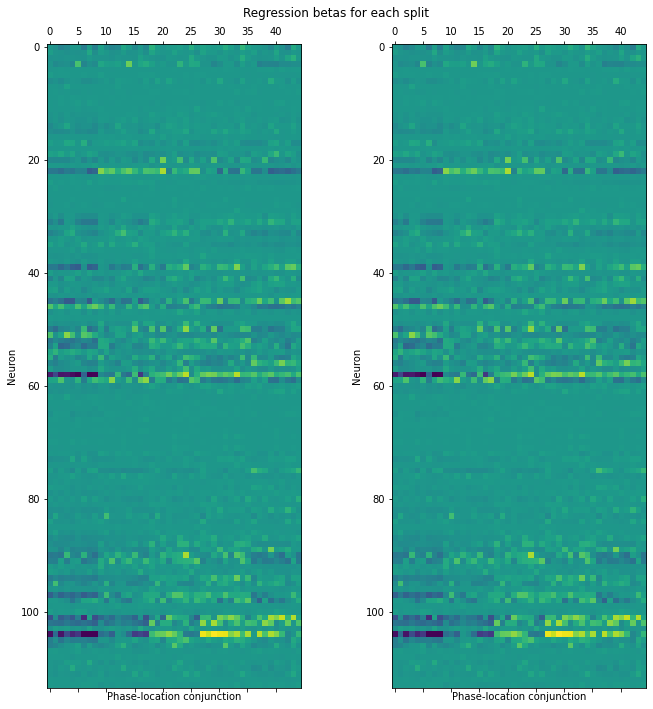

In [562]:

fig, axs = plt.subplots(1,2, figsize = (10,10))
plt.suptitle('Regression betas for each split')

axs[0].matshow(centred_betas_1)
axs[0].set_xlabel('Phase-location conjunction')
axs[0].set_ylabel('Neuron')
axs[1].matshow(centred_betas_2)
axs[1].set_xlabel('Phase-location conjunction')
axs[1].set_ylabel('Neuron')
plt.tight_layout()


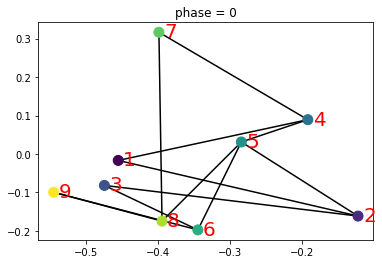

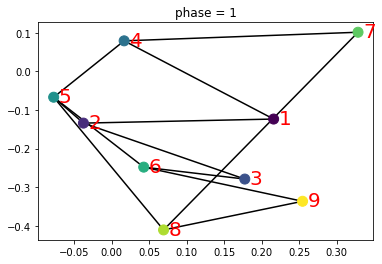

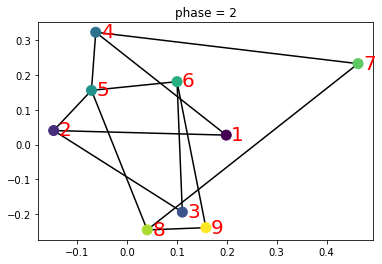

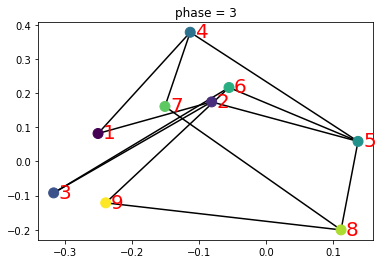

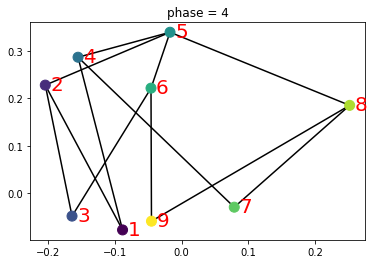

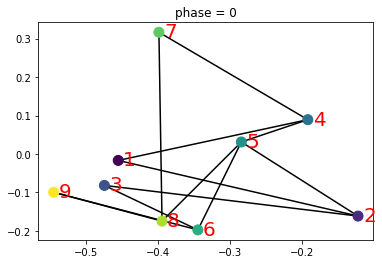

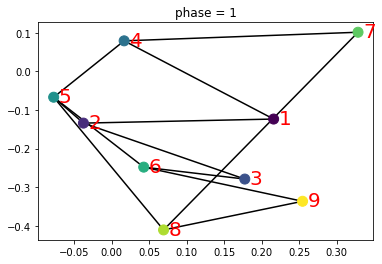

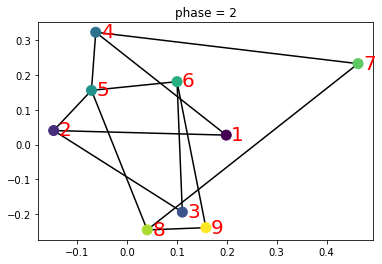

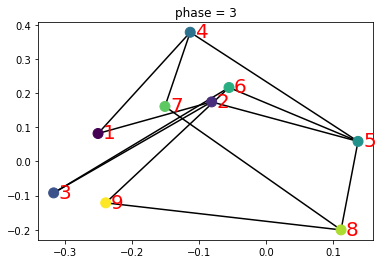

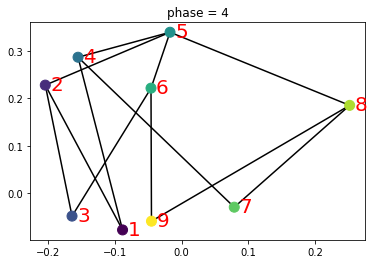

In [566]:
num_locs = max(Location_array)


if phase_partitions==5:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
        3:[],
        4:[]
    }

if phase_partitions==3:
    phase_planes_dic = {
        0:[],
        1:[],
        2:[]
    }
    phase_specific_betas_dic = {
        0:[],
        1:[],
        2:[],
    }


centred_betas_dic = {
    0:centred_betas_1,
    1:centred_betas_1
}
for stack in range(2):
    for i in range(phase_partitions):
        ind1 = i * num_locs
        ind2 = i*num_locs+num_locs
        phase_specific_betas = centred_betas_dic[stack][:,ind1:ind2].T
        phase_specific_betas_dic[i].append(phase_specific_betas)
        pca_phase = PCA(n_components=3)
        pca_phase.fit(phase_specific_betas)
        subspace_vectors = pca_phase.components_
        
        phase_planes_dic[i].append(subspace_vectors)
    
        projection = phase_specific_betas.dot(subspace_vectors.T)
#         ax = plt.figure().add_subplot(projection='3d')
#         for connection in connections:
#             y = projection[connection[0],1], projection[connection[1],1]
#             x = projection[connection[0],0], projection[connection[1],0]
#             z = projection[connection[0],2], projection[connection[1],2]
#             ax.plot(y,x,z, color='k')
        
#         ax.scatter(projection[:,1], projection[:,0], projection[:,2], 
#                    c=list(range(len(projection[:,1]))),
#                    s=100, zorder=4)
        
#         node_labels = list(range(1,len(projection[:,1])+1))
                           
# #         for label, x_point, y_point, z_point in zip(node_labels, projection[:,1], projection[:,0]):
# #             ax.annotate(label,
# #                         xy=(x_point, y_point),
# #                         xytext=(5, -5),
# #                         textcoords='offset points',
# #                        zorder=5,
# #                        color='r',
# #                        size=20)

#         ax.set_title(f'phase = {i}')
    
        ax = plt.figure().add_subplot()
        for connection in connections:
            y = projection[connection[0],1], projection[connection[1],1]
            x = projection[connection[0],0], projection[connection[1],0]
           
            ax.plot(y,x, color='k')
        
        ax.scatter(projection[:,1], projection[:,0],
                   c=list(range(len(projection[:,1]))),
                   s=100, zorder=4)
        
        node_labels = list(range(1,len(projection[:,1])+1))
                           
        for label, x_point, y_point in zip(node_labels, projection[:,1], projection[:,0]):
            ax.annotate(label,
                        xy=(x_point, y_point),
                        xytext=(5, -5),
                        textcoords='offset points',
                       zorder=5,
                       color='r',
                       size=20)

        ax.set_title(f'phase = {i}')
        
        
        
    

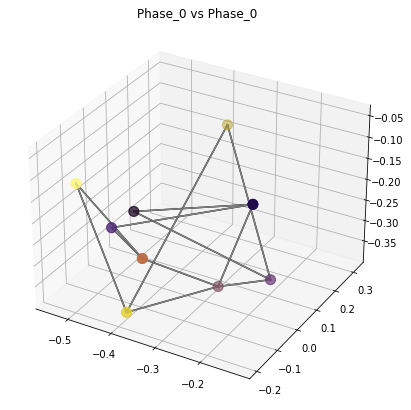

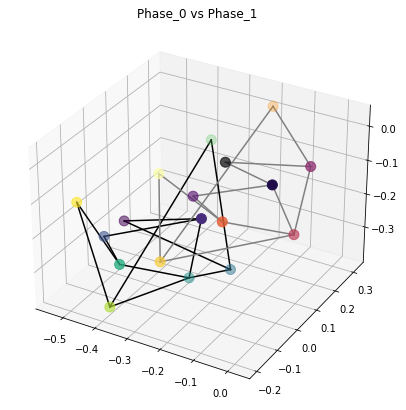

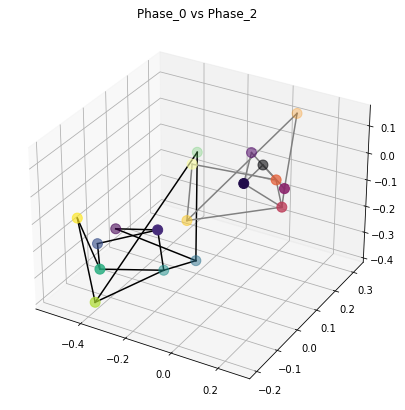

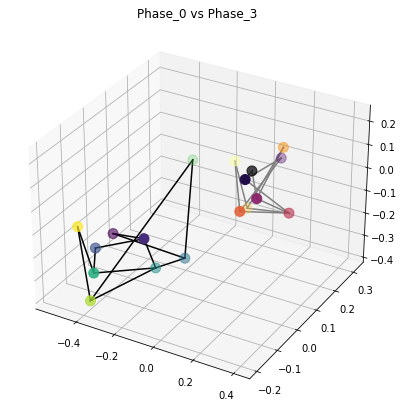

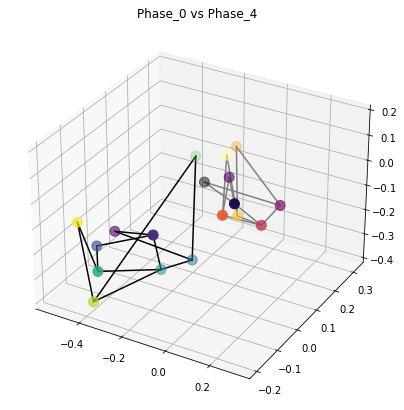

In [509]:
for i in range(0,5):
    
    proj_congruent = phase_specific_betas_dic[0][1]
    proj_incongruent = phase_specific_betas_dic[i][1]
    subspace_vectors = phase_planes_dic[0][1]
    if i==0:
        proj_incongruent = phase_specific_betas_dic[i][0] 
    proj_1 = proj_congruent.dot(subspace_vectors.T)
    proj_2 = proj_incongruent.dot(subspace_vectors.T)

    ax = plt.figure(figsize=(7,7)).add_subplot(projection='3d')
    ax.set_title(f'Phase_0 vs Phase_{i}')
    for connection in connections:
        y = proj_1[connection[0],1], proj_1[connection[1],1]
        x = proj_1[connection[0],0], proj_1[connection[1],0]
        z = proj_1[connection[0],2], proj_1[connection[1],2]
        ax.plot(y,x,z, color='k')

        y2 = proj_2[connection[0],1], proj_2[connection[1],1]
        x2 = proj_2[connection[0],0], proj_2[connection[1],0]
        z2 = proj_2[connection[0],2], proj_2[connection[1],2]
        ax.plot(y2,x2,z2, color='gray')

    ax.scatter(proj_1[:,1], proj_1[:,0], proj_1[:,2], 
               c=list(range(len(proj_1[:,1]))),
               s=100, zorder=4, cmap = 'viridis')

    ax.scatter(proj_2[:,1], proj_2[:,0], proj_2[:,2], 
               c=list(range(len(proj_2[:,1]))),
               s=100, zorder=4, cmap = 'inferno')
    plt.show()


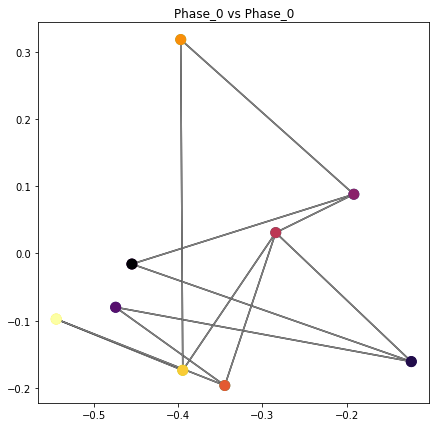

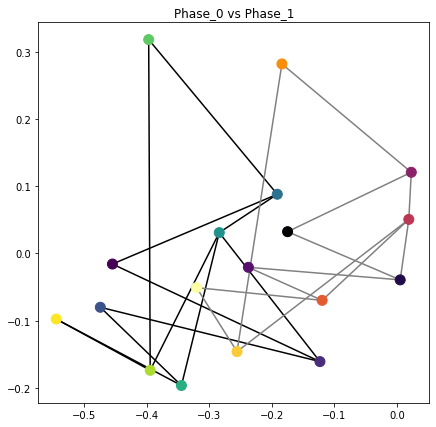

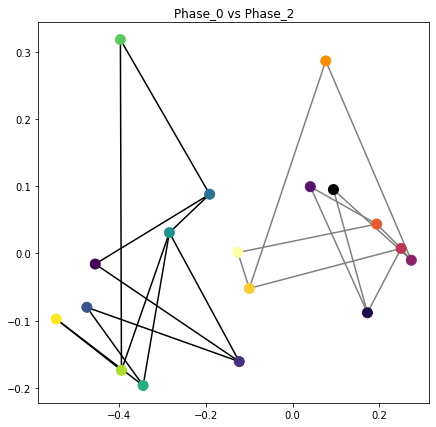

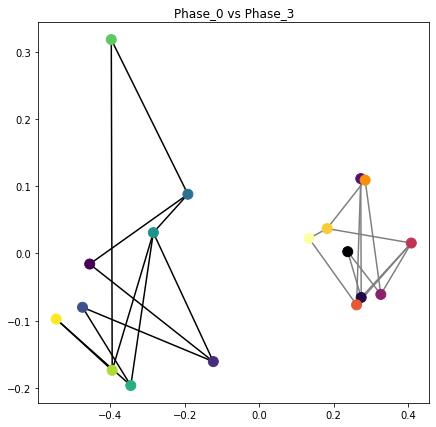

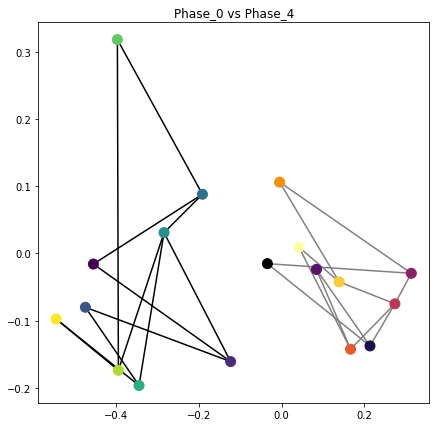

In [514]:
for i in range(0,5):
    
    proj_congruent = phase_specific_betas_dic[0][1]
    proj_incongruent = phase_specific_betas_dic[i][1]
    subspace_vectors = phase_planes_dic[0][1][:2,:]
    if i==0:
        proj_incongruent = phase_specific_betas_dic[i][0] 
    proj_1 = proj_congruent.dot(subspace_vectors.T)
    proj_2 = proj_incongruent.dot(subspace_vectors.T)

    ax = plt.figure(figsize=(7,7)).add_subplot()
    ax.set_title(f'Phase_0 vs Phase_{i}')
    for connection in connections:
        y = proj_1[connection[0],1], proj_1[connection[1],1]
        x = proj_1[connection[0],0], proj_1[connection[1],0]
      
        ax.plot(y,x, color='k')

        y2 = proj_2[connection[0],1], proj_2[connection[1],1]
        x2 = proj_2[connection[0],0], proj_2[connection[1],0]
       
        ax.plot(y2,x2, color='gray')

    ax.scatter(proj_1[:,1], proj_1[:,0], 
               c=list(range(len(proj_1[:,1]))),
               s=100, zorder=4, cmap = 'viridis')

    ax.scatter(proj_2[:,1], proj_2[:,0], 
               c=list(range(len(proj_2[:,1]))),
               s=100, zorder=4, cmap = 'inferno')
    plt.show()

In [480]:
phase_planes_dic[0][0].shape

(3, 114)

In [481]:
#### self_comps  
angles_self = []
for i in phase_planes_dic:
    plane1 = phase_planes_dic[i][0]
    plane2 = phase_planes_dic[i][1]
    outer_product = plane1.dot(plane2.T)
    U, S, Vt = np.linalg.svd(outer_product, full_matrices=True)
    principal_angle = S[0]
    angles_self.append(principal_angle) 
    
angles_across = []

if phase_partitions ==3:
    comps =[[0,1],
            [0,2],
            [1,2]]

if phase_partitions ==5:
    comps =[[0,1],
            [0,2],
            [0,3],
            [0,4],
            [2,4]]

for comp in comps:
    plane1 = phase_planes_dic[comp[0]][0]
    plane2 = phase_planes_dic[comp[1]][1]
    outer_product = plane1.dot(plane2.T)
    U, S, Vt = np.linalg.svd(outer_product, full_matrices=True)
    principal_angle = S[0]
    angles_across.append(principal_angle) 

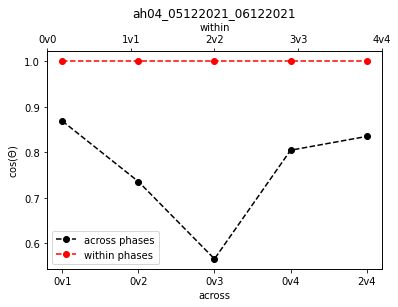

In [483]:
if phase_partitions==5:
    fig, ax = plt.subplots()

    ax.plot(angles_across, linestyle='--', marker='o', color='k', label='across phases')
    ax.plot(angles_self, linestyle='--', marker='o', color='r', label='within phases')
    plt.ylabel(r"$\cos({\Theta})$")
    plt.xlabel('across')
    plt.legend()

    plt.xticks(ticks = [0,1,2, 3, 4], labels=['0v1','0v2','0v3','0v4','2v4'])
    plt.title(mouse_recday)
    ax2 = ax.twiny()

    # Define the positions and labels for the second set of x-ticks
    new_xticks_positions = [0, 1, 2, 3, 4]
    new_xticks_labels = ['0v0', '1v1', '2v2', '3v3', '4v4']

    # Set the positions of the second x-axis ticks
    ax2.set_xticks(new_xticks_positions)

    # Set the labels for the second x-axis ticks
    ax2.set_xticklabels(new_xticks_labels)

    # Set the label for the second x-axis
    ax2.set_xlabel('within')


if phase_partitions ==3:
    fig, ax = plt.subplots()

    ax.plot(angles_across, linestyle='--', marker='o', color='k', label='across phases')
    ax.plot(angles_self, linestyle='--', marker='o', color='r', label='within phases')
    plt.ylabel(r"$\cos({\Theta})$")
    plt.xlabel('across')
    plt.legend()

    plt.xticks(ticks = [0,1,2], labels=['0v1',  '0v2', '1 v 2'])
    plt.title(mouse_recday)
    ax2 = ax.twiny()

    # Define the positions and labels for the second set of x-ticks
    new_xticks_positions = [0, 1, 2]
    new_xticks_labels = ['0v0', '1v1', '2v2']

    # Set the positions of the second x-axis ticks
    ax2.set_xticks(new_xticks_positions)

    # Set the labels for the second x-axis ticks
    ax2.set_xticklabels(new_xticks_labels)

    # Set the label for the second x-axis
    ax2.set_xlabel('within')


In [280]:
x = np.random.choice([0, 1], size=(10,), p=[0.5, 0.5]).astype(bool)
y = ~x

In [281]:
print(x)
print(y)

[ True  True  True False  True False  True  True False False]
[False False False  True False  True False False  True  True]


In [ ]:
# centre the data
Neuron_array=Neuron_array.T
mean_values = np.mean(Neuron_array, axis=0)  # Calculate the mean of each column
centered_data = Neuron_array - mean_values   # Subtract the mean from each column

# Whitening the data
# std_values = np.std(centered_data, axis=0)  # Calculate the standard deviation of each column
# whitened_data = centered_data / std_values   # Divide each column by its standard deviation


In [235]:
import numpy as np
from scipy.optimize import minimize
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA



def silhouette_optimization(data, labels=Locations_phase):
    labels = labels
    num_components=data.shape[1]
    """
    Optimize rotation matrix for silhouette score.

    Parameters:
    - data: The input data.
    - num_components: The number of components to use for projection.

    Returns:
    - best_rotation_matrix: The optimized rotation matrix.
    - best_silhouette_score: The highest silhouette score achieved.
    """
    
    def objective_function(rotation_matrix_flat, data, labels=Locations_phase):
        # Reshape the flattened rotation matrix
        rotation_matrix = rotation_matrix_flat.reshape((num_components, 2))

        # Project the data onto the rotated space
        projected_data = data.dot(rotation_matrix)

        # Compute silhouette score
        silhouette_score_value = silhouette_score(projected_data, labels)
        
        # The optimization task is to maximize the silhouette score, so we return the negative value
        return -silhouette_score_value
    

    # Initialize a random rotation matrix
    initial_rotation_matrix = np.random.rand(num_components, 2)
    initial_rotation_matrix, _ = np.linalg.qr(initial_rotation_matrix)

    # Flatten the matrix for optimization
    initial_guess = initial_rotation_matrix.flatten()

    # Perform optimization
    result = minimize(objective_function, initial_guess, args=(data,), method='L-BFGS-B')

    # Reshape the optimized flat rotation matrix to its original shape
    best_rotation_matrix = result.x.reshape((num_components, 2))

    # Project the data onto the rotated space using the best rotation matrix
    projected_data = data.dot(best_rotation_matrix)

    # Compute the silhouette score for the best rotation matrix
    best_silhouette_score = silhouette_score(projected_data, labels)

    return best_rotation_matrix, best_silhouette_score




In [236]:
initial_rotation_matrix = np.random.rand(Neurons_phase.shape[1], 2)
initial_rotation_matrix, _ = np.linalg.qr(initial_rotation_matrix)

In [237]:
xx=Neurons_phase.dot(initial_rotation_matrix)
plt.scatter(XX[:,0], xx[:,1], c=Locations_phase)

SyntaxError: invalid syntax (<ipython-input-237-ba2fb1025042>, line 2)

In [ ]:
plt.scatter(Neurons_phase[:,5], Neurons_phase[:,8], c=Locations_phase)

In [ ]:
mask = Phase_array==0
Phase_phase = Phase_array[mask]
Neurons_phase = centered_data[mask,:]
Locations_phase =Location_array[mask]
# Assuming 'your_data' is a 2D array representing your data
# Make sure your_data.shape[1] > 1, as silhouette score makes sense in at least 2D
best_rotation_matrix, best_silhouette_score = silhouette_optimization(Neurons_phase, Locations_phase)
print("Best Rotation Matrix:")
plt.matshow(best_rotation_matrix)
plt.show()
print("Best Silhouette Score:", best_silhouette_score)

In [ ]:
mask = Phase_array==1
Phase_phase = Phase_array[mask]
Neurons_phase = Neuron_array[mask,:]
Locations_phase =Location_array[mask]
# Assuming 'your_data' is a 2D array representing your data
# Make sure your_data.shape[1] > 1, as silhouette score makes sense in at least 2D
best_rotation_matrix_1, best_silhouette_score_1 = silhouette_optimization(Neurons_phase, Locations_phase)
print("Best Rotation Matrix:")
plt.matshow(best_rotation_matrix_1)
plt.show()
print("Best Silhouette Score:", best_silhouette_score_1)

In [ ]:
mask = Phase_array==2
Phase_phase = Phase_array[mask]
Neurons_phase = Neuron_array[mask,:]
Locations_phase =Location_array[mask]
# Assuming 'your_data' is a 2D array representing your data
# Make sure your_data.shape[1] > 1, as silhouette score makes sense in at least 2D
best_rotation_matrix_2, best_silhouette_score_2 = silhouette_optimization(Neurons_phase, Locations_phase)
print("Best Rotation Matrix:")
plt.matshow(best_rotation_matrix_2)
plt.show()
print("Best Silhouette Score:", best_silhouette_score_2)

In [ ]:
Locations_0v